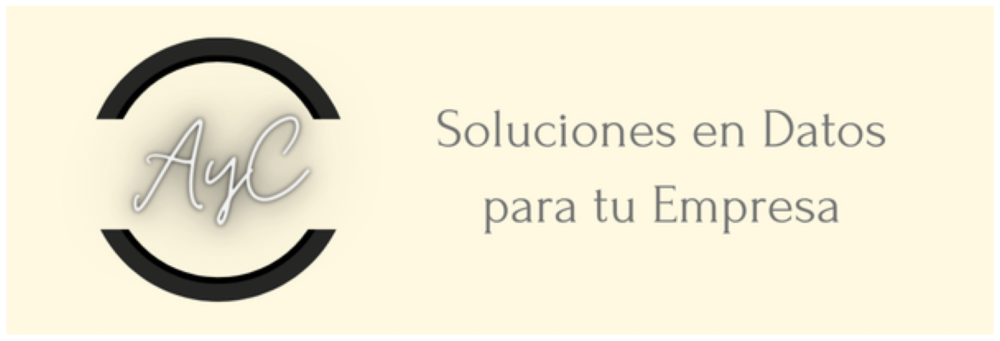

In [ ]:
r.Imagen('/content/drive/MyDrive/NoCountry_RiesgoCrediticio/banner_consultora_ayc.png', (20,10))

#### Para Google Colab

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importaciones

In [2]:
import numpy as np
import pandas as pd
import os # en el caso que se trabaje en el entorno de colab

os.chdir('/content/drive/MyDrive/NoCountry_RiesgoCrediticio/recursos_y_notebooks') # en el caso de que se trabaje en google colab

%load_ext autoreload
%autoreload 2

import resources as r

# Este codigo Pone un limite grande para el ancho y sin limite para el largo de un output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 1000)
pd.set_option('display.width', 1000)

In [3]:
lista_produccion = os.listdir('../raw/')

# <h1 align= 'center'><u><strong></strong>Datos</u></h1>

En Principio, los datos con los que contamos y vamos a trabajar referidos a la tematica de proyecto, son de diferentes origenes, aunque principalmente se obtienen de la plataforma web de datos publicos de la nacion (tanto en Datos Argentina como en los diferenetes ministerios o la plataforma de la nación)

Detallamos los origenes principales:
* https://kaggle.com/
* https://datos.gob.ar/
* https://www.argentina.gob.ar/
* https://nasdaq.com
* https://inversores.ypf.com/informacion-financiera.html
* https://datos.enerdata.net/productos-petroliferos/estadisticas-consumo-mundial-petroleo-consumo-domestico.html
* https://datos.enerdata.net/petroleo-crudo/datos-produccion-energia-mundial.html

Como se hace notar, nos centramos en la data de empresas petroleras que estan asentadas en Argentina, ya que va a ser nuestro contexto de analisis (el objeto de estudio se centra principalmente en la empresa YPF), aunque complementamos la misma con algunos datos referentes al área (de hidrocarburos), en el contexto global para tomar como punto de referencia en diversos analisis.

La data apunta a el estado general de actividad productiva, el estado financiero y/o contable de la empresa y su capital-infraestructura, la proyeccion de produccion y creciemiento, las inversiones que realiza, la cotizacion en bolsa, etc... todo esto, pertinente para tener un panorama claro del estado general de la empresa a evaluar

En este informe se detalla el estado de la calidad de los datos de manera general, como paso previo a realizar un ETL de los mismos.

### Instanciamos los dataframes

In [ ]:
no_convencional = pd.read_csv('../raw/produccin-de-pozos-de-gas-y-petrleo-no-convencional.csv')

In [ ]:
pozos = pd.read_csv('../raw/capitulo-iv-pozos.csv')

In [ ]:
prod_gyp_2020 = pd.read_csv('../raw/produccin-de-pozos-de-gas-y-petrleo-2020.csv')

In [ ]:
prod_gyp_2021 = pd.read_csv('../raw/produccin-de-pozos-de-gas-y-petrleo-2021.csv')

In [ ]:
prod_gyp_2022 = pd.read_csv('../raw/produccin-de-pozos-de-gas-y-petrleo-2022.csv')

In [ ]:
prod_gyp_2023 = pd.read_csv('../raw/produccin-de-pozos-de-gas-y-petrleo-2023.csv')

In [ ]:
prod_gyp_2024 = pd.read_csv('../raw/produccin-de-pozos-de-gas-y-petrleo-2024.csv')

In [ ]:
precio_mundial = pd.read_csv('../raw/Precios petroleo mundia desde 1970.csv')

In [ ]:
ppw = pd.read_csv('../raw/Petrol Price Worldwide.csv', encoding= 'ISO-8859-1')

In [ ]:
nasdaq = pd.read_csv('../raw/YPF NASDAQ.csv', encoding= 'ascii')

In [ ]:
PZD = pd.read_csv('../raw/PZE Historical Data.csv')

In [ ]:
PBR = pd.read_csv('../raw/PBRm Historical Data (1).csv')

In [ ]:
CVXm = pd.read_csv('../raw/CVXm Historical Data.csv')

In [ ]:
price_oil = pd.read_csv('../raw/crude-oil-price.csv')

In [ ]:
inv_20 = pd.read_parquet('../raw/inversiones/Inv. previstas año actual_2020.parquet')

In [ ]:
inv_21 = pd.read_parquet('../raw/inversiones/Inv. previstas año actual_2021.parquet')

In [ ]:
inv_22 = pd.read_parquet('../raw/inversiones/Inv. previstas año actual_2022.parquet')

In [ ]:
inv_23 = pd.read_parquet('../raw/inversiones/Inv. previstas año actual_2023.parquet')

In [ ]:
inv_24 = pd.read_parquet('../raw/inversiones/Inv. previstas año actual_2024.parquet')

In [ ]:
bs = pd.read_parquet('../raw/info_contable/BS.parquet')

In [ ]:
cf = pd.read_parquet('../raw/info_contable/CF.parquet')

In [ ]:
pyl = pd.read_parquet('../raw/info_contable/P&L.parquet')

In [ ]:
segment = pd.read_parquet('../raw/info_contable/Segment.parquet')

In [ ]:
volumes = pd.read_parquet('../raw/info_contable/Volumes.parquet')

In [ ]:
reservas = pd.read_parquet('../raw/reservas_fin de vida util_2023.parquet')

In [ ]:
world_consum = pd.read_parquet('../raw/Yearbook_world_oil_domestic_consumption.parquet')

In [ ]:
world_prod = pd.read_parquet('../raw/Yearbook_world_production.parquet')

In [ ]:
ENAP_ratios = pd.read_parquet('../raw/ENAP_ratios.parquet')

In [ ]:
ecopetrol_ratios = pd.read_parquet('../raw/Ecopetrol_ratios.parquet')

In [ ]:
gran_tierra_energy_ratios = pd.read_parquet('../raw/Gran Tierra Energy_ratios.parquet')

In [ ]:
petrobras_br_ratios = pd.read_parquet('../raw/Petrobas Brasil_ratios.parquet')

In [ ]:
repsol_ratios = pd.read_parquet('../raw/REPSOL_ratios.parquet')

In [ ]:
TGC_ratios = pd.read_parquet('../raw/TGC_ratios.parquet')

In [ ]:
tecpetrol_ratios = pd.read_parquet('../raw/Tecpetrol_ratios.parquet')

In [4]:
ypf_ratios = pd.read_parquet('../raw/YPF_ratios.parquet')

# <h1 align= 'center'><u><strong></strong>Análisis</u></h1>

## Produccion de pozos de gas y petroleo no convencional

### Informe general

In [ ]:
r.informe_dataframe(no_convencional)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 303393
Columnas: 40

--Numero de datos--
11547859

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 303392
Columnas: ['idempresa', 'anio', 'mes', 'idpozo', 'prod_pet', 'prod_gas', 'prod_agua', 'iny_agua', 'iny_gas', 'iny_co2', 'iny_otro', 'tef', 'vida_util', 'tipoextraccion', 'tipoestado', 'tipopozo', 'observaciones', 'fechaingreso', 'rectificado', 'habilitado', 'idusuario', 'empresa', 'sigla', 'formprod', 'profundidad', 'formacion', 'idareapermisoconcesion', 'areapermisoconcesion', 'idareayacimiento', 'areayacimiento', 'cuenca', 'provincia', 'coordenadax', 'coordenaday', 'tipo_de_recurso', 'proyecto', 'clasificacion', 'subclasificacion', 'sub_tipo_recurso', 'fecha_data']

--Tipo de columnas--
idempresa                  object
anio                        int64
mes                         int64
idpozo                      int64
prod_pet                

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(no_convencional)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,idempresa,[<class 'str'>],100.00,0.00,0
1,anio,[<class 'int'>],100.00,0.00,0
2,mes,[<class 'int'>],100.00,0.00,0
3,idpozo,[<class 'int'>],100.00,0.00,0
4,prod_pet,[<class 'float'>],100.00,0.00,0
5,prod_gas,[<class 'float'>],100.00,0.00,0
6,prod_agua,[<class 'float'>],100.00,0.00,0
7,iny_agua,[<class 'float'>],100.00,0.00,0
8,iny_gas,[<class 'float'>],100.00,0.00,0
9,iny_co2,[<class 'float'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in no_convencional:
  r.informe_columna(no_convencional, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idempresa:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
42

--Valores unicos en la columna (Primeros 5 valores)--
['YSUR' 'YPF' 'WIN' 'WDA' 'VST']

--Moda de la columna especificada--
Valor modal -----> YPF
Frecuencia acumulada ------> 170358

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 idempresa
YPF    170358
APS     16678
PLU     15894
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE anio:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2018 2015 2017 2016 2022]  -----> Desde 2018  Hasta 2012

--Estadisticos Principales de la columna--
Media: 2019.25
Desviacion Estandar: 3.75
Primer cuartil:

### Gráficos

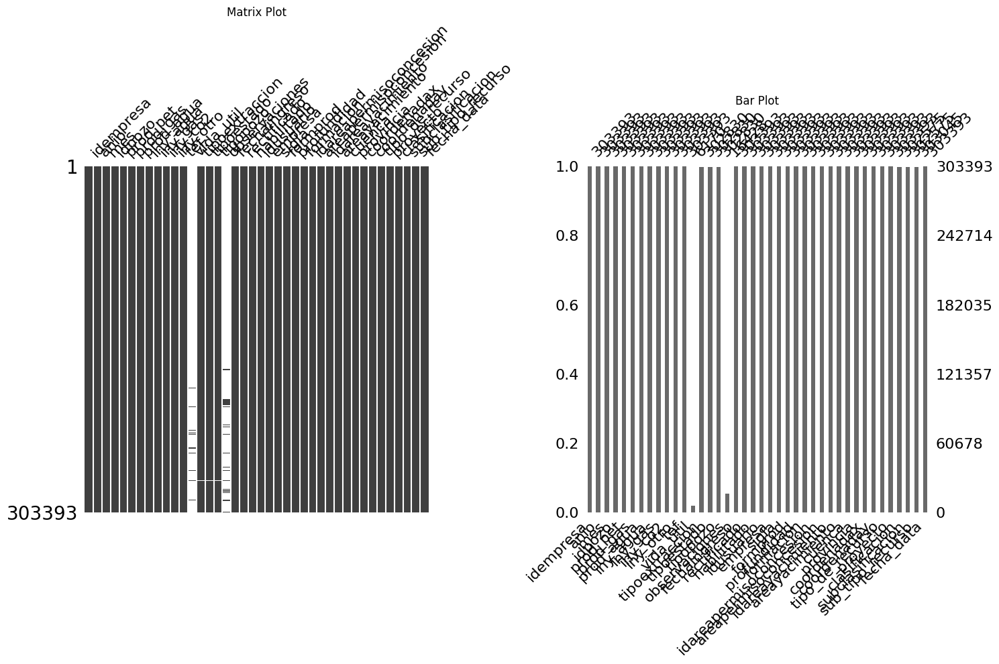

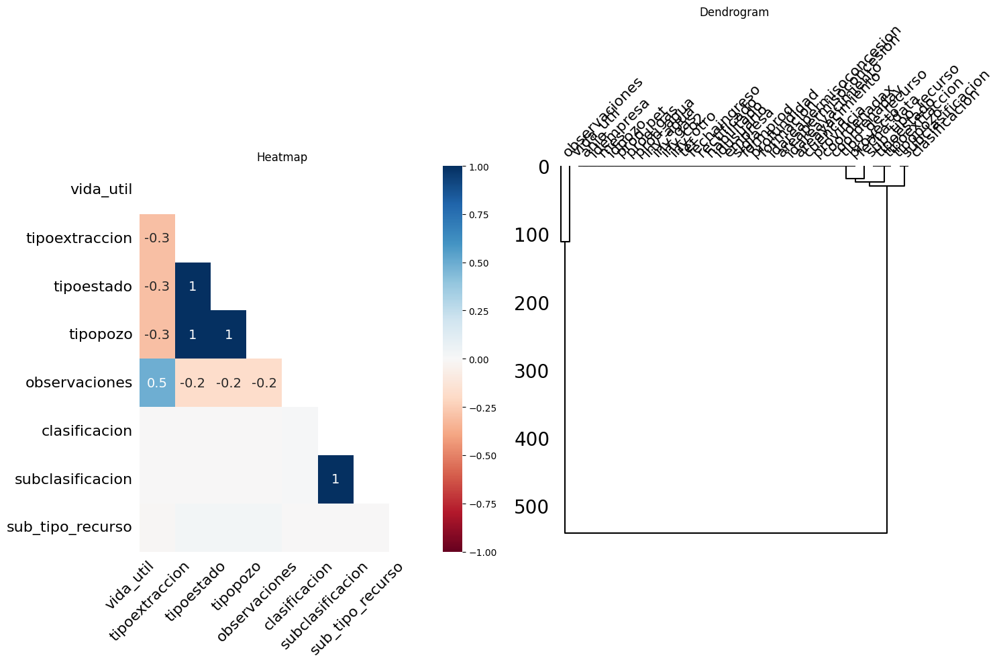

In [ ]:
r.visualizar_nulos(no_convencional)

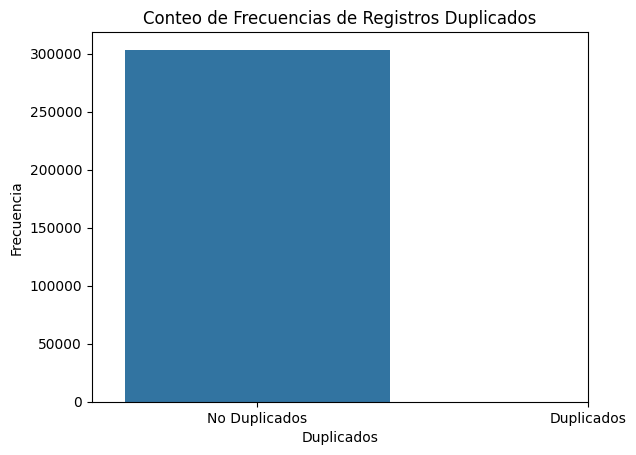

In [ ]:
r.hist_duplicados(no_convencional)

## Pozos

### Informe general

In [ ]:
r.informe_dataframe(pozos)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 83990
Columnas: 26

--Numero de datos--
2038459

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 83989
Columnas: ['sigla', 'idpozo', 'area', 'cod_area', 'empresa', 'yacimiento', 'cod_yacimiento', 'formacion', 'cuenca', 'provincia', 'cota', 'profundidad', 'clasificacion', 'subclasificacion', 'tipo_recurso', 'sub_tipo_recurso', 'gasplus', 'tipopozo', 'tipoextraccion', 'tipoestado', 'adjiv_fecha_inicio_perf', 'adjiv_fecha_fin_perf', 'adjiv_fecha_inicio_term', 'adjiv_fecha_fin_term', 'geojson', 'geom']

--Tipo de columnas--
sigla                       object
idpozo                       int64
area                        object
cod_area                    object
empresa                     object
yacimiento                  object
cod_yacimiento              object
formacion                   object
cuenca                      object
provincia            

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(pozos)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,sigla,[<class 'str'>],100.00,0.00,0
1,idpozo,[<class 'int'>],100.00,0.00,0
2,area,[<class 'str'>],100.00,0.00,0
3,cod_area,[<class 'str'>],100.00,0.00,0
4,empresa,"[<class 'str'>, <class 'float'>]",98.96,1.04,874
5,yacimiento,[<class 'str'>],100.00,0.00,0
6,cod_yacimiento,[<class 'str'>],100.00,0.00,0
7,formacion,"[<class 'str'>, <class 'float'>]",96.65,3.35,2815
8,cuenca,[<class 'str'>],100.00,0.00,0
9,provincia,[<class 'str'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in pozos:
  r.informe_columna(pozos, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE sigla:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
76783

--Valores unicos en la columna (Primeros 5 valores)--
['CH.CH.EaLE.x-1' 'CH.CH.EaLE.x-2' 'CH.CH.EaLE-3' 'CH.CH.EaLE-4'
 'CH.CH.EaLE-5']

--Moda de la columna especificada--
Valor modal -----> APCO.Ch.CR.x-7
Frecuencia acumulada ------> 11

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 sigla
APCO.Ch.CR.x-7     11
YPF.Nq.EL-3         5
YPF.Md.NMDM.e-4     5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idpozo:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [212 213 214 215 216]  -----> Desde 212  Hasta 165400

--Estadisticos Principales

### Gráficos

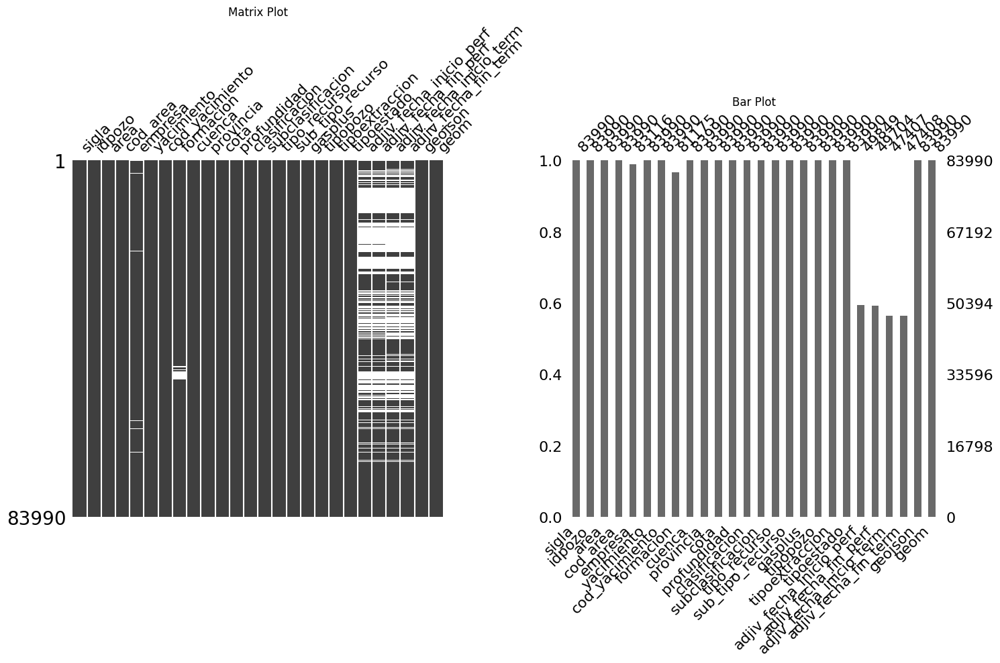

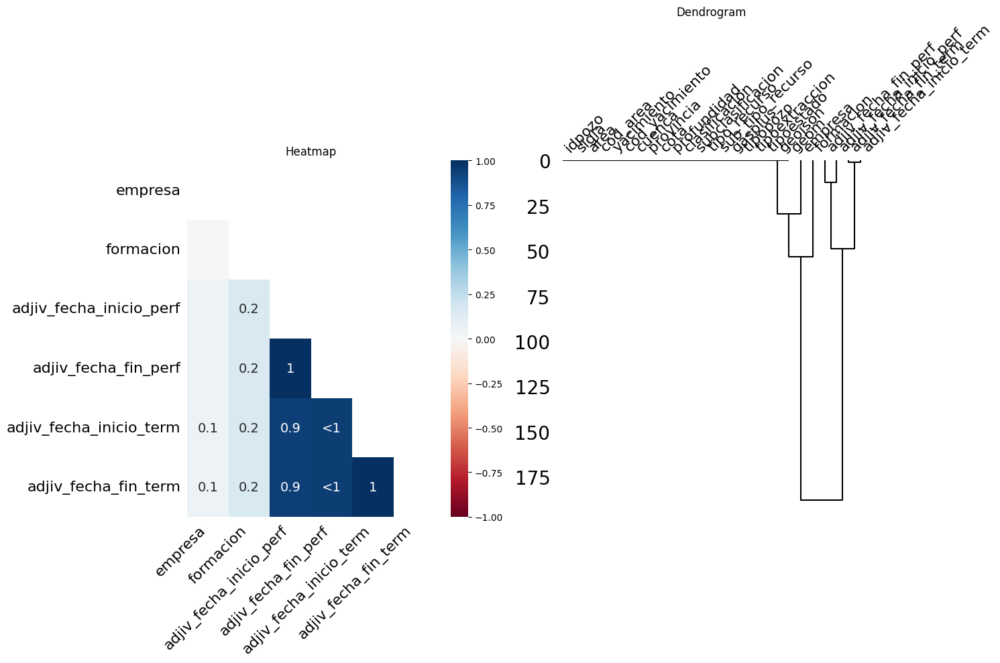

In [ ]:
r.visualizar_nulos(pozos)

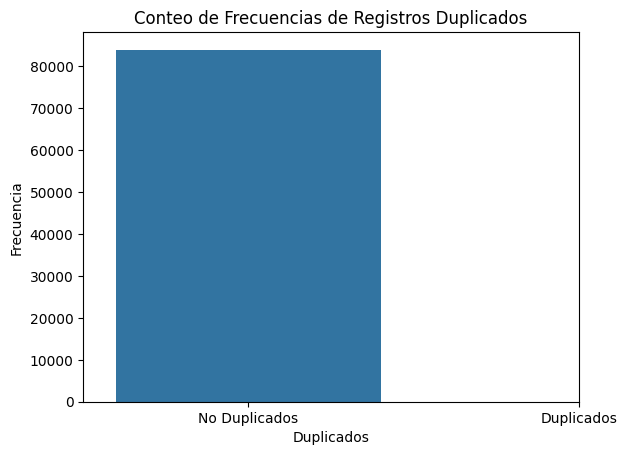

In [ ]:
r.hist_duplicados(pozos)

## Produccion de gas y petroleo (2020)

### Informe general

In [ ]:
r.informe_dataframe(prod_gyp_2020)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 953660
Columnas: 38

--Numero de datos--
33036239

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 953659
Columnas: ['idempresa', 'anio', 'mes', 'idpozo', 'prod_pet', 'prod_gas', 'prod_agua', 'iny_agua', 'iny_gas', 'iny_co2', 'iny_otro', 'tef', 'vida_util', 'tipoextraccion', 'tipoestado', 'tipopozo', 'observaciones', 'fechaingreso', 'rectificado', 'habilitado', 'idusuario', 'empresa', 'sigla', 'formprod', 'profundidad', 'formacion', 'idareapermisoconcesion', 'areapermisoconcesion', 'idareayacimiento', 'areayacimiento', 'cuenca', 'provincia', 'tipo_de_recurso', 'proyecto', 'clasificacion', 'subclasificacion', 'sub_tipo_recurso', 'fecha_data']

--Tipo de columnas--
idempresa                  object
anio                        int64
mes                         int64
idpozo                      int64
prod_pet                  float64
prod_gas            

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(prod_gyp_2020)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,idempresa,[<class 'str'>],100.00,0.00,0
1,anio,[<class 'int'>],100.00,0.00,0
2,mes,[<class 'int'>],100.00,0.00,0
3,idpozo,[<class 'int'>],100.00,0.00,0
4,prod_pet,[<class 'float'>],100.00,0.00,0
5,prod_gas,[<class 'float'>],100.00,0.00,0
6,prod_agua,[<class 'float'>],100.00,0.00,0
7,iny_agua,[<class 'float'>],100.00,0.00,0
8,iny_gas,[<class 'float'>],100.00,0.00,0
9,iny_co2,[<class 'float'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in prod_gyp_2020:
  r.informe_columna(prod_gyp_2020, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idempresa:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
58

--Valores unicos en la columna (Primeros 5 valores)--
['Z001' 'YPF' 'WDA' 'VNO' 'VIS']

--Moda de la columna especificada--
Valor modal -----> YPF
Frecuencia acumulada ------> 463005

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 idempresa
YPF     463005
PAL      93027
SINO     80196
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE anio:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2020]  -----> Desde 2020  Hasta 2020

--Estadisticos Principales de la columna--
Media: 2020.0
Desviacion Estandar: 0.0
Primer cuartil: 2020.0
Mediana: 20

### Gráficos

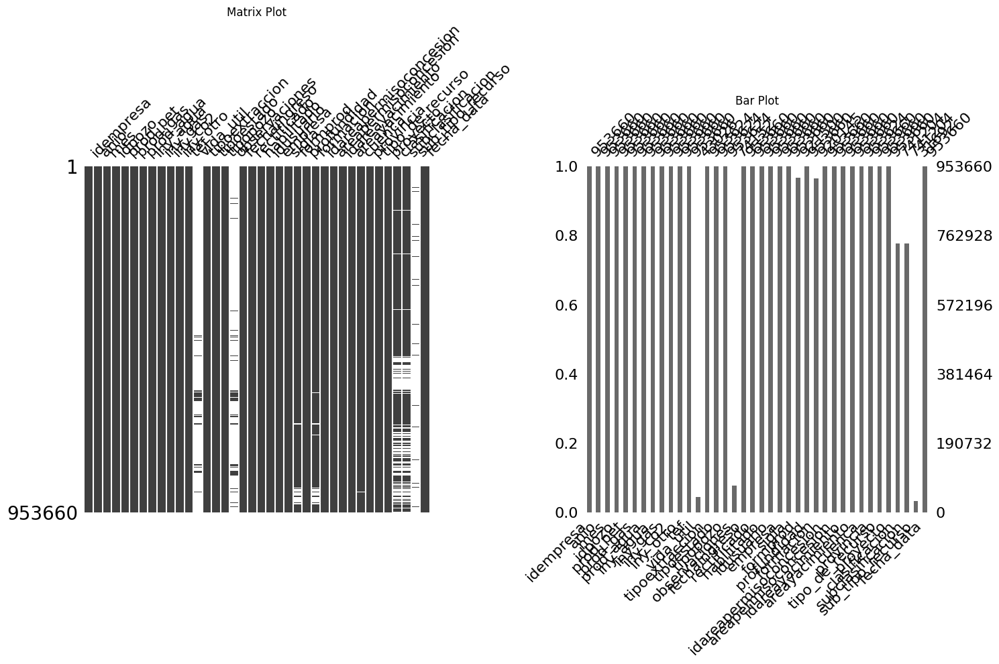

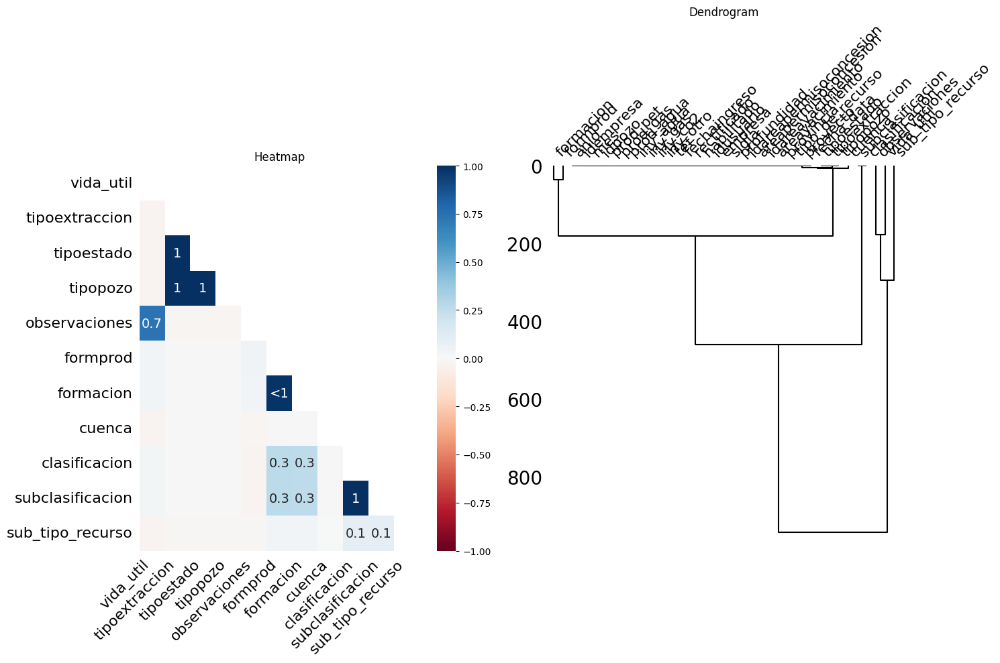

In [ ]:
r.visualizar_nulos(prod_gyp_2020)

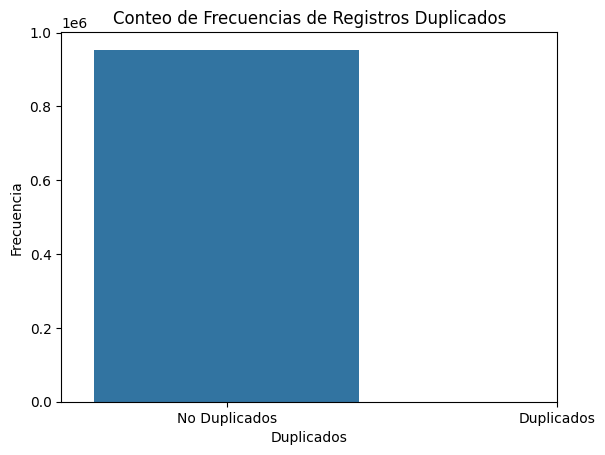

In [ ]:
r.hist_duplicados(prod_gyp_2020)

## Produccion de gas y petroleo (2021)

### Informe general

In [ ]:
r.informe_dataframe(prod_gyp_2021)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 961451
Columnas: 38

--Numero de datos--
33300601

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 961450
Columnas: ['idempresa', 'anio', 'mes', 'idpozo', 'prod_pet', 'prod_gas', 'prod_agua', 'iny_agua', 'iny_gas', 'iny_co2', 'iny_otro', 'tef', 'vida_util', 'tipoextraccion', 'tipoestado', 'tipopozo', 'observaciones', 'fechaingreso', 'rectificado', 'habilitado', 'idusuario', 'empresa', 'sigla', 'formprod', 'profundidad', 'formacion', 'idareapermisoconcesion', 'areapermisoconcesion', 'idareayacimiento', 'areayacimiento', 'cuenca', 'provincia', 'tipo_de_recurso', 'proyecto', 'clasificacion', 'subclasificacion', 'sub_tipo_recurso', 'fecha_data']

--Tipo de columnas--
idempresa                  object
anio                        int64
mes                         int64
idpozo                      int64
prod_pet                  float64
prod_gas            

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(prod_gyp_2021)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,idempresa,[<class 'str'>],100.00,0.00,0
1,anio,[<class 'int'>],100.00,0.00,0
2,mes,[<class 'int'>],100.00,0.00,0
3,idpozo,[<class 'int'>],100.00,0.00,0
4,prod_pet,[<class 'float'>],100.00,0.00,0
5,prod_gas,[<class 'float'>],100.00,0.00,0
6,prod_agua,[<class 'float'>],100.00,0.00,0
7,iny_agua,[<class 'float'>],100.00,0.00,0
8,iny_gas,[<class 'float'>],100.00,0.00,0
9,iny_co2,[<class 'float'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in prod_gyp_2021:
  r.informe_columna(prod_gyp_2021, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idempresa:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
57

--Valores unicos en la columna (Primeros 5 valores)--
['Z001' 'YPF' 'WDA' 'VNO' 'VIS']

--Moda de la columna especificada--
Valor modal -----> YPF
Frecuencia acumulada ------> 465590

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 idempresa
YPF     465590
PAL      94849
SINO     80196
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE anio:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2021]  -----> Desde 2021  Hasta 2021

--Estadisticos Principales de la columna--
Media: 2021.0
Desviacion Estandar: 0.0
Primer cuartil: 2021.0
Mediana: 20

### Gráficos

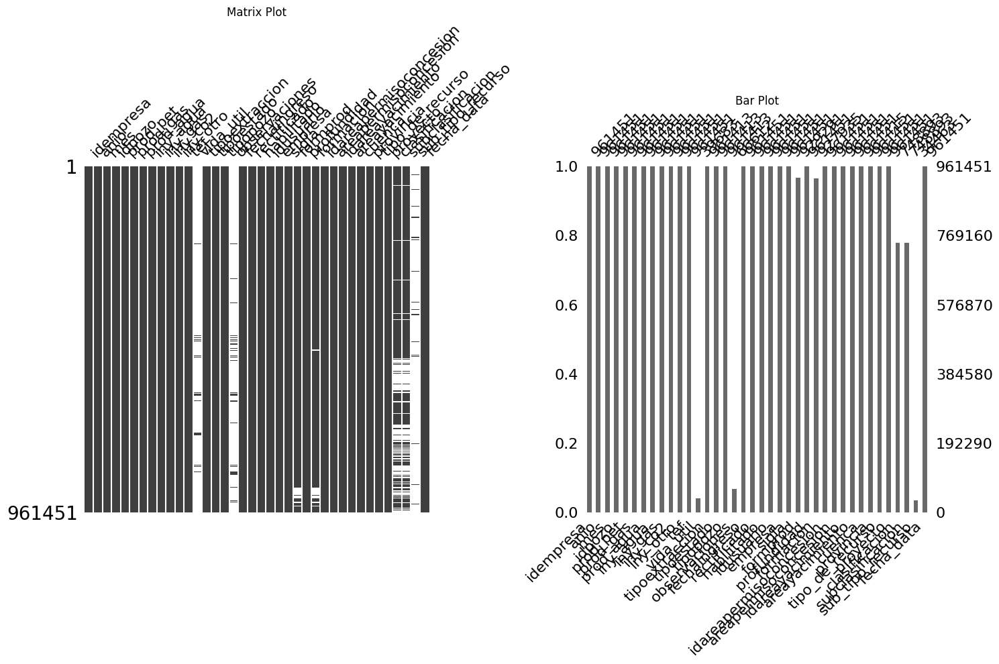

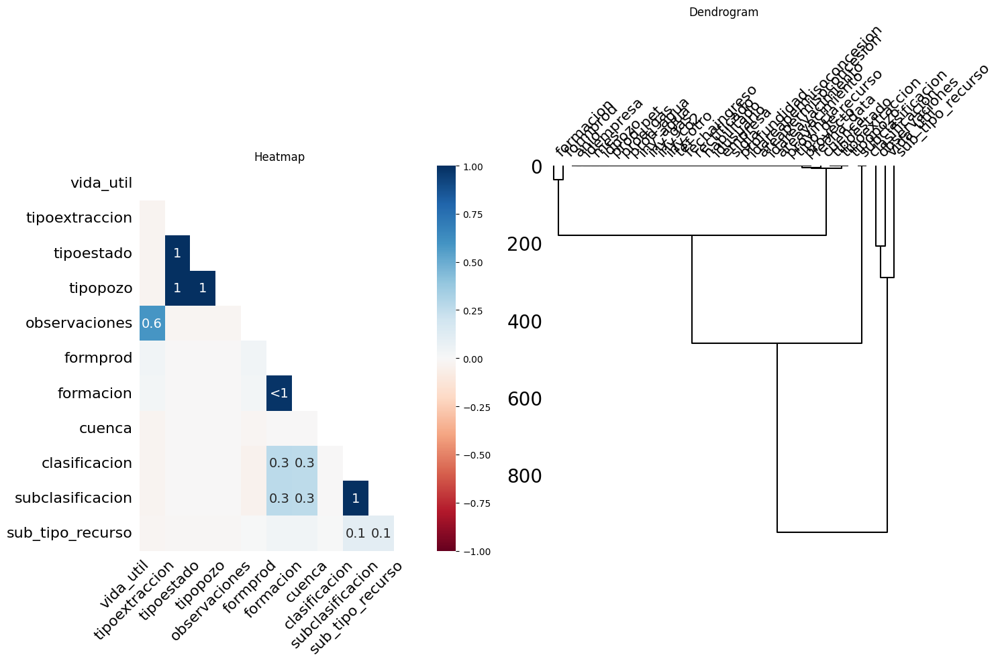

In [ ]:
r.visualizar_nulos(prod_gyp_2021)

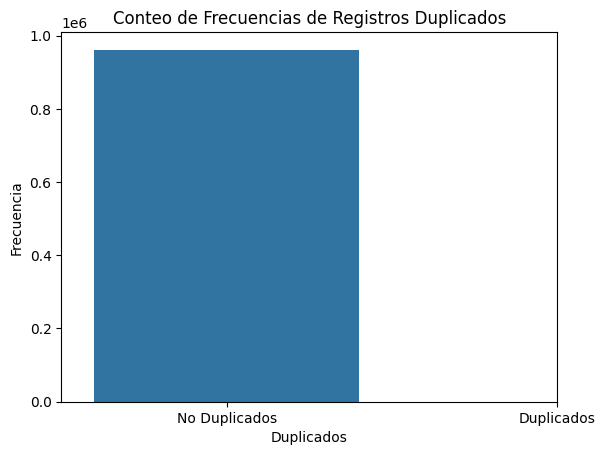

In [ ]:
r.hist_duplicados(prod_gyp_2021)

## Produccion de gas y petroleo (2022)

### Informe general

In [ ]:
r.informe_dataframe(prod_gyp_2022)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 972353
Columnas: 38

--Numero de datos--
33669674

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 972352
Columnas: ['idempresa', 'anio', 'mes', 'idpozo', 'prod_pet', 'prod_gas', 'prod_agua', 'iny_agua', 'iny_gas', 'iny_co2', 'iny_otro', 'tef', 'vida_util', 'tipoextraccion', 'tipoestado', 'tipopozo', 'observaciones', 'fechaingreso', 'rectificado', 'habilitado', 'idusuario', 'empresa', 'sigla', 'formprod', 'profundidad', 'formacion', 'idareapermisoconcesion', 'areapermisoconcesion', 'idareayacimiento', 'areayacimiento', 'cuenca', 'provincia', 'tipo_de_recurso', 'proyecto', 'clasificacion', 'subclasificacion', 'sub_tipo_recurso', 'fecha_data']

--Tipo de columnas--
idempresa                  object
anio                        int64
mes                         int64
idpozo                      int64
prod_pet                  float64
prod_gas            

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(prod_gyp_2022)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,idempresa,[<class 'str'>],100.00,0.00,0
1,anio,[<class 'int'>],100.00,0.00,0
2,mes,[<class 'int'>],100.00,0.00,0
3,idpozo,[<class 'int'>],100.00,0.00,0
4,prod_pet,[<class 'float'>],100.00,0.00,0
5,prod_gas,[<class 'float'>],100.00,0.00,0
6,prod_agua,[<class 'float'>],100.00,0.00,0
7,iny_agua,[<class 'float'>],100.00,0.00,0
8,iny_gas,[<class 'float'>],100.00,0.00,0
9,iny_co2,[<class 'float'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in prod_gyp_2022:
  r.informe_columna(prod_gyp_2022, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idempresa:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
60

--Valores unicos en la columna (Primeros 5 valores)--
['Z001' 'YPF' 'VST' 'VNO' 'VIS']

--Moda de la columna especificada--
Valor modal -----> YPF
Frecuencia acumulada ------> 468230

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 idempresa
YPF     468230
PAL      96946
SINO     60158
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE anio:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2022]  -----> Desde 2022  Hasta 2022

--Estadisticos Principales de la columna--
Media: 2022.0
Desviacion Estandar: 0.0
Primer cuartil: 2022.0
Mediana: 20

### Gráficos

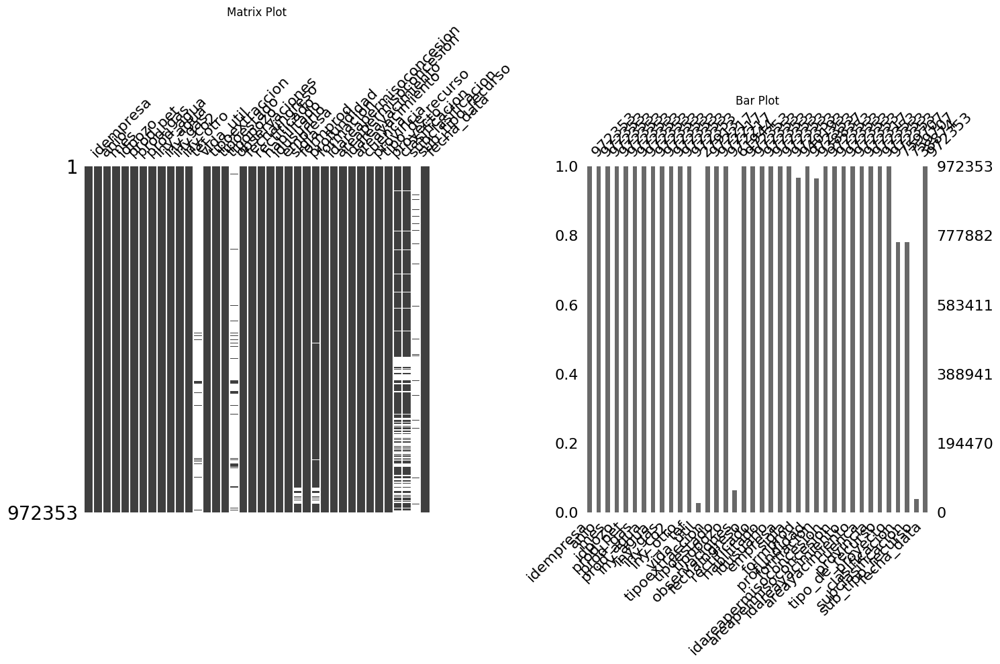

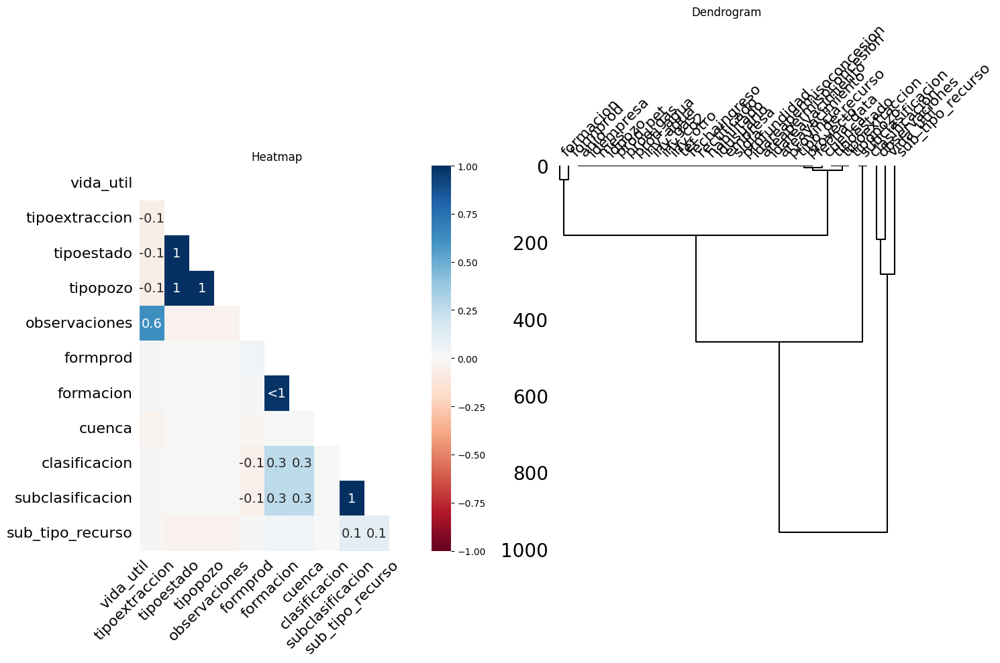

In [ ]:
r.visualizar_nulos(prod_gyp_2022)

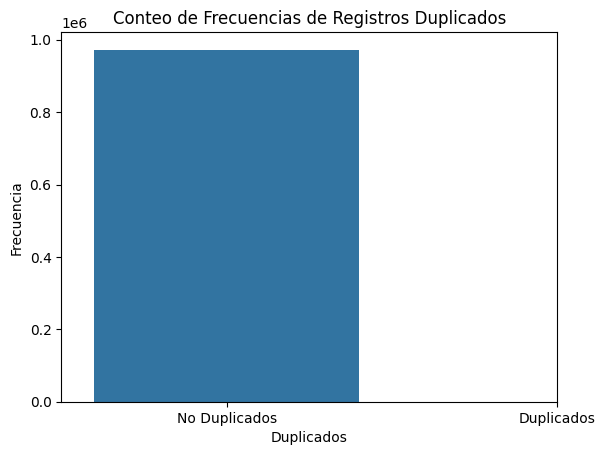

In [ ]:
r.hist_duplicados(prod_gyp_2022)

## Produccion de gas y petroleo (2023)

### Informe general

In [ ]:
r.informe_dataframe(prod_gyp_2023)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 974958
Columnas: 38

--Numero de datos--
33785463

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 974957
Columnas: ['idempresa', 'anio', 'mes', 'idpozo', 'prod_pet', 'prod_gas', 'prod_agua', 'iny_agua', 'iny_gas', 'iny_co2', 'iny_otro', 'tef', 'vida_util', 'tipoextraccion', 'tipoestado', 'tipopozo', 'observaciones', 'fechaingreso', 'rectificado', 'habilitado', 'idusuario', 'empresa', 'sigla', 'formprod', 'profundidad', 'formacion', 'idareapermisoconcesion', 'areapermisoconcesion', 'idareayacimiento', 'areayacimiento', 'cuenca', 'provincia', 'tipo_de_recurso', 'proyecto', 'clasificacion', 'subclasificacion', 'sub_tipo_recurso', 'fecha_data']

--Tipo de columnas--
idempresa                  object
anio                        int64
mes                         int64
idpozo                      int64
prod_pet                  float64
prod_gas            

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(prod_gyp_2023)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,idempresa,[<class 'str'>],100.00,0.00,0
1,anio,[<class 'int'>],100.00,0.00,0
2,mes,[<class 'int'>],100.00,0.00,0
3,idpozo,[<class 'int'>],100.00,0.00,0
4,prod_pet,[<class 'float'>],100.00,0.00,0
5,prod_gas,[<class 'float'>],100.00,0.00,0
6,prod_agua,[<class 'float'>],100.00,0.00,0
7,iny_agua,[<class 'float'>],100.00,0.00,0
8,iny_gas,[<class 'float'>],100.00,0.00,0
9,iny_co2,[<class 'float'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in prod_gyp_2023:
  r.informe_columna(prod_gyp_2023, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idempresa:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
57

--Valores unicos en la columna (Primeros 5 valores)--
['Z001' 'YPF' 'VST' 'VNO' 'TPT']

--Moda de la columna especificada--
Valor modal -----> YPF
Frecuencia acumulada ------> 472041

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 idempresa
YPF    472041
PAL     99276
CG1     80537
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE anio:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2023]  -----> Desde 2023  Hasta 2023

--Estadisticos Principales de la columna--
Media: 2023.0
Desviacion Estandar: 0.0
Primer cuartil: 2023.0
Mediana: 2023.

### Gráficos

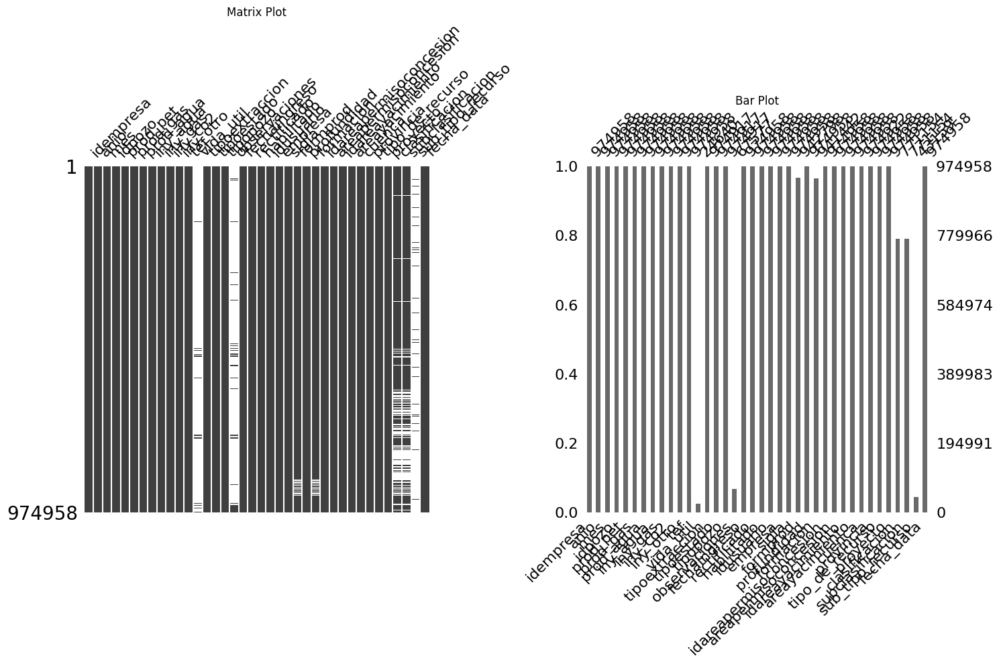

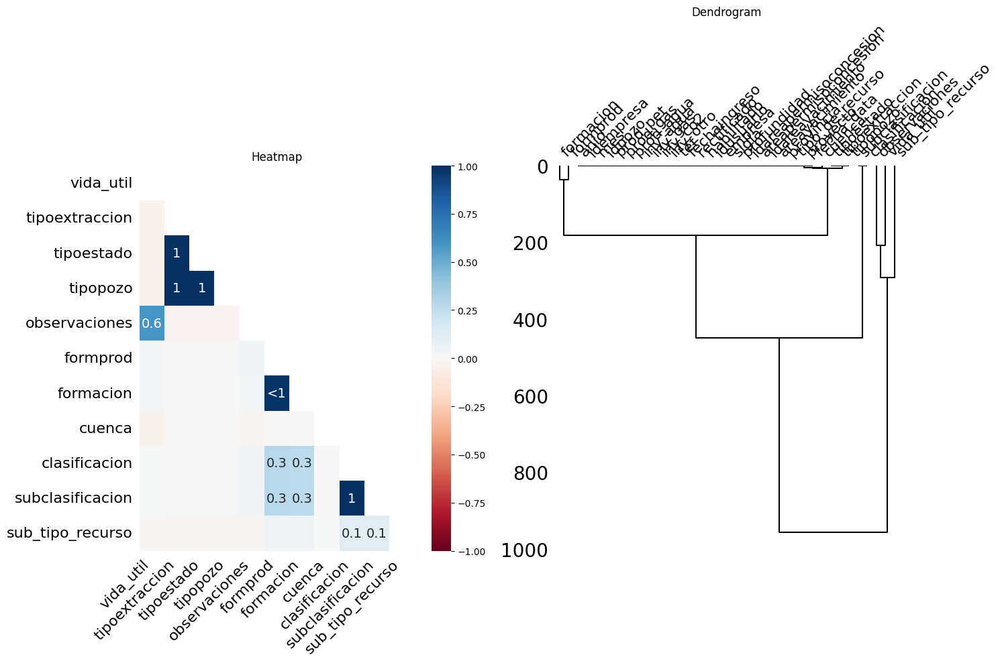

In [ ]:
r.visualizar_nulos(prod_gyp_2023)

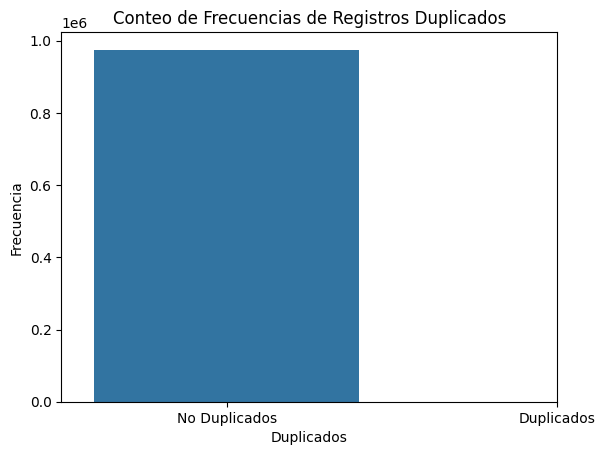

In [ ]:
r.hist_duplicados(prod_gyp_2023)

## Produccion de gas y petroleo (2024)

### Informe general

In [ ]:
r.informe_dataframe(prod_gyp_2024)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 409352
Columnas: 38

--Numero de datos--
14189243

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 409351
Columnas: ['idempresa', 'anio', 'mes', 'idpozo', 'prod_pet', 'prod_gas', 'prod_agua', 'iny_agua', 'iny_gas', 'iny_co2', 'iny_otro', 'tef', 'vida_util', 'tipoextraccion', 'tipoestado', 'tipopozo', 'observaciones', 'fechaingreso', 'rectificado', 'habilitado', 'idusuario', 'empresa', 'sigla', 'formprod', 'profundidad', 'formacion', 'idareapermisoconcesion', 'areapermisoconcesion', 'idareayacimiento', 'areayacimiento', 'cuenca', 'provincia', 'tipo_de_recurso', 'proyecto', 'clasificacion', 'subclasificacion', 'sub_tipo_recurso', 'fecha_data']

--Tipo de columnas--
idempresa                  object
anio                        int64
mes                         int64
idpozo                      int64
prod_pet                  float64
prod_gas            

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(prod_gyp_2024)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,idempresa,[<class 'str'>],100.00,0.00,0
1,anio,[<class 'int'>],100.00,0.00,0
2,mes,[<class 'int'>],100.00,0.00,0
3,idpozo,[<class 'int'>],100.00,0.00,0
4,prod_pet,[<class 'float'>],100.00,0.00,0
5,prod_gas,[<class 'float'>],100.00,0.00,0
6,prod_agua,[<class 'float'>],100.00,0.00,0
7,iny_agua,[<class 'float'>],100.00,0.00,0
8,iny_gas,[<class 'float'>],100.00,0.00,0
9,iny_co2,[<class 'float'>],100.00,0.00,0


### Informe particular

In [ ]:
for columna in prod_gyp_2024:
  r.informe_columna(prod_gyp_2024, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE idempresa:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
56

--Valores unicos en la columna (Primeros 5 valores)--
['Z001' 'YPF' 'VST' 'VNO' 'TPT']

--Moda de la columna especificada--
Valor modal -----> YPF
Frecuencia acumulada ------> 197705

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 idempresa
YPF    197705
PAL     42142
CG1     33688
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE anio:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [2024]  -----> Desde 2024  Hasta 2024

--Estadisticos Principales de la columna--
Media: 2024.0
Desviacion Estandar: 0.0
Primer cuartil: 2024.0
Mediana: 2024.

### Gráficos

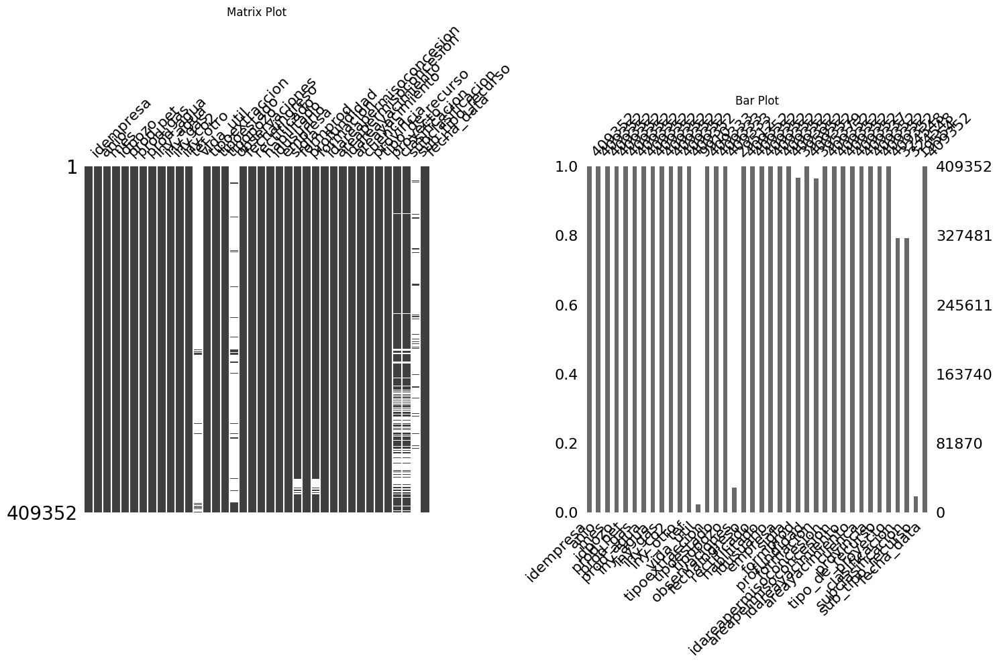

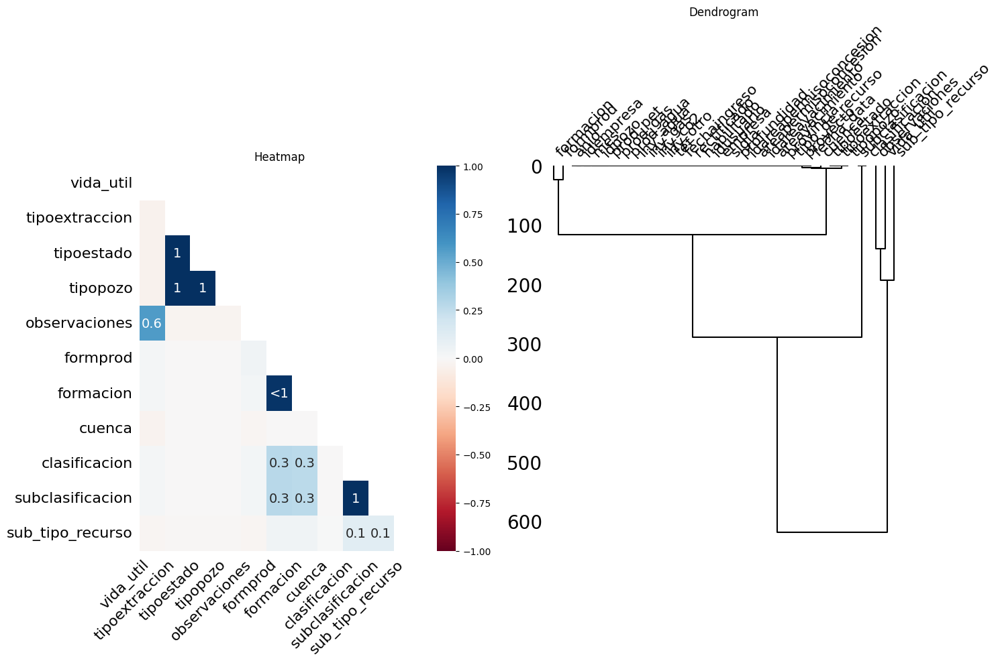

In [ ]:
r.visualizar_nulos(prod_gyp_2024)

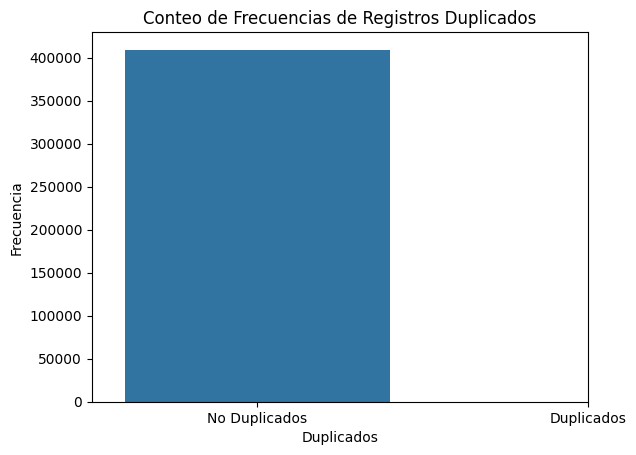

In [ ]:
r.hist_duplicados(prod_gyp_2024)

## Precio Mundial del petroleo (desde 1970)

### Informe general

In [ ]:
r.informe_dataframe(precio_mundial)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 264
Columnas: 60

--Numero de datos--
11762

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 263
Columnas: ['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code', '1966', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', 'Unnamed: 68']

--Tipo de columnas--
Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1966              float64
1970              float64
1971              float64
1972              float64
1

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(precio_mundial)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Country Name,[<class 'str'>],100.00,0.00,0
1,Country Code,[<class 'str'>],100.00,0.00,0
2,Indicator Name,[<class 'str'>],100.00,0.00,0
3,Indicator Code,[<class 'str'>],100.00,0.00,0
4,1966,[<class 'float'>],0.00,100.00,264
5,1970,[<class 'float'>],28.79,71.21,188
6,1971,[<class 'float'>],48.11,51.89,137
7,1972,[<class 'float'>],48.48,51.52,136
8,1973,[<class 'float'>],48.48,51.52,136
9,1974,[<class 'float'>],48.86,51.14,135


### Informe particular

In [ ]:
for columna in precio_mundial:
  r.informe_columna(precio_mundial, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Country Name:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
264

--Valores unicos en la columna (Primeros 5 valores)--
['Aruba' 'Afganistán' 'Angola' 'Albania' 'Andorra']

--Moda de la columna especificada--
Valor modal -----> Aruba
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Country Name
Aruba                    1
Otros Estados pequeos    1
Malasia                  1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Country Code:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
264

--Valores unicos en la columna (Primeros 5 valores)--
['ABW' 'AFG' 'AGO' 'A

### Gráficos

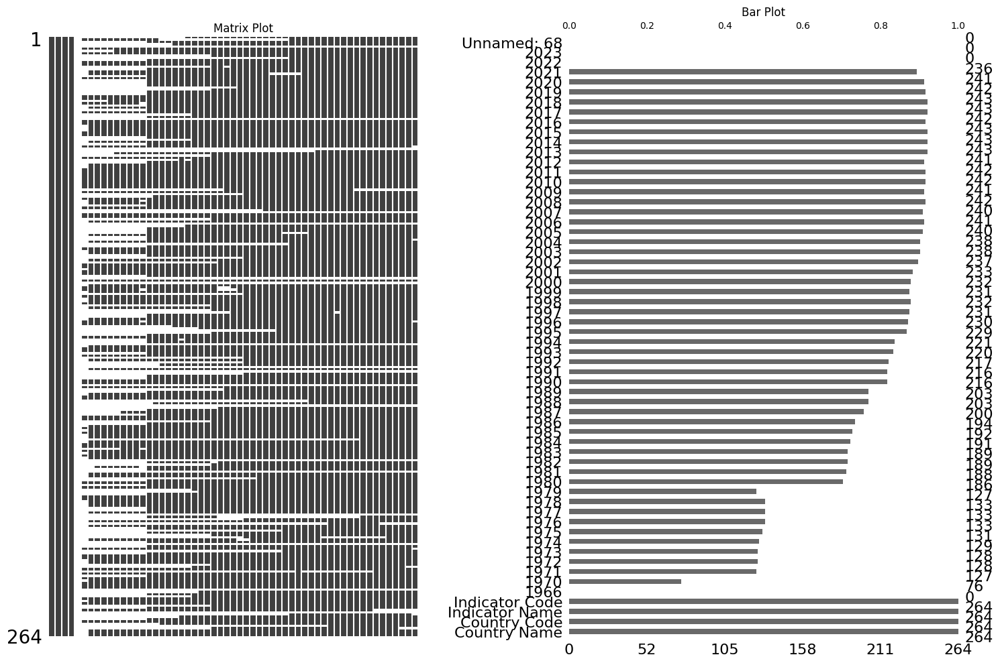

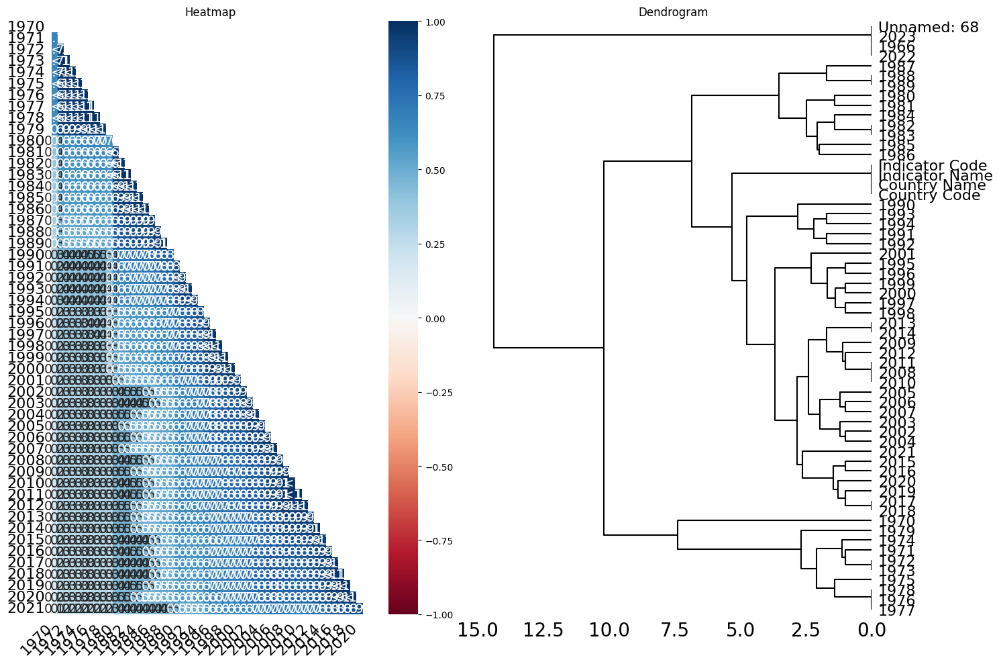

In [ ]:
r.visualizar_nulos(precio_mundial)

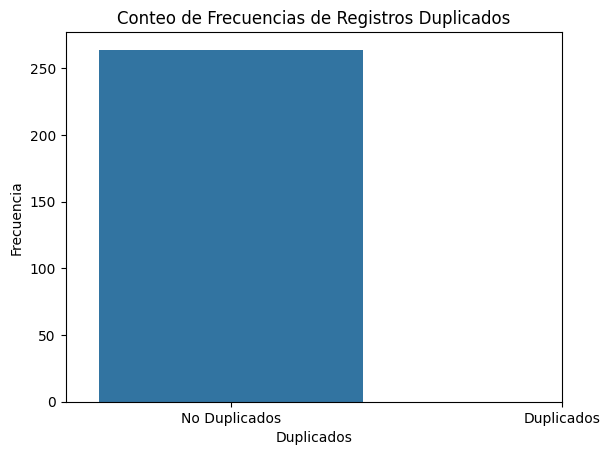

In [ ]:
r.hist_duplicados(precio_mundial)

## Petrol Price Worldwide

### Informe general

In [ ]:
r.informe_dataframe(ppw)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 181
Columnas: 11

--Numero de datos--
1991

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 180
Columnas: ['S#', 'Country', 'Daily Oil Consumption (Barrels)', 'World Share', 'Yearly Gallons Per Capita', 'Price Per Gallon (USD)', 'Price Per Liter (USD)', 'Price Per Liter (PKR)', 'GDP Per Capita ( USD )', 'Gallons GDP Per Capita Can Buy', 'xTimes Yearly Gallons Per Capita Buy']

--Tipo de columnas--
S#                                        int64
Country                                  object
Daily Oil Consumption (Barrels)          object
World Share                              object
Yearly Gallons Per Capita               float64
Price Per Gallon (USD)                  float64
Price Per Liter (USD)                   float64
Price Per Liter (PKR)                   float64
GDP Per Capita ( USD )                   object
Gallons GDP Per Capita Can Bu

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(ppw)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,S#,[<class 'int'>],100.0,0.0,0
1,Country,[<class 'str'>],100.0,0.0,0
2,Daily Oil Consumption (Barrels),[<class 'str'>],100.0,0.0,0
3,World Share,[<class 'str'>],100.0,0.0,0
4,Yearly Gallons Per Capita,[<class 'float'>],100.0,0.0,0
5,Price Per Gallon (USD),[<class 'float'>],100.0,0.0,0
6,Price Per Liter (USD),[<class 'float'>],100.0,0.0,0
7,Price Per Liter (PKR),[<class 'float'>],100.0,0.0,0
8,GDP Per Capita ( USD ),[<class 'str'>],100.0,0.0,0
9,Gallons GDP Per Capita Can Buy,[<class 'str'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in ppw:
  r.informe_columna(ppw, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE S#:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [1 2 3 4 5]  -----> Desde 1  Hasta 181

--Estadisticos Principales de la columna--
Media: 91.0
Desviacion Estandar: 52.39
Primer cuartil: 46.0
Mediana: 91.0
Tercer cuartil: 136.0

--Valores extremos--
Valor maximo: 181
Valor minimo: 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 S#
1      1
115    1
117    1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 181
Minimo: 1

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Country:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
181

--Valores unicos en la columna (Primeros 5 valores)--
['United States' 'China' 'In

### Gráficos

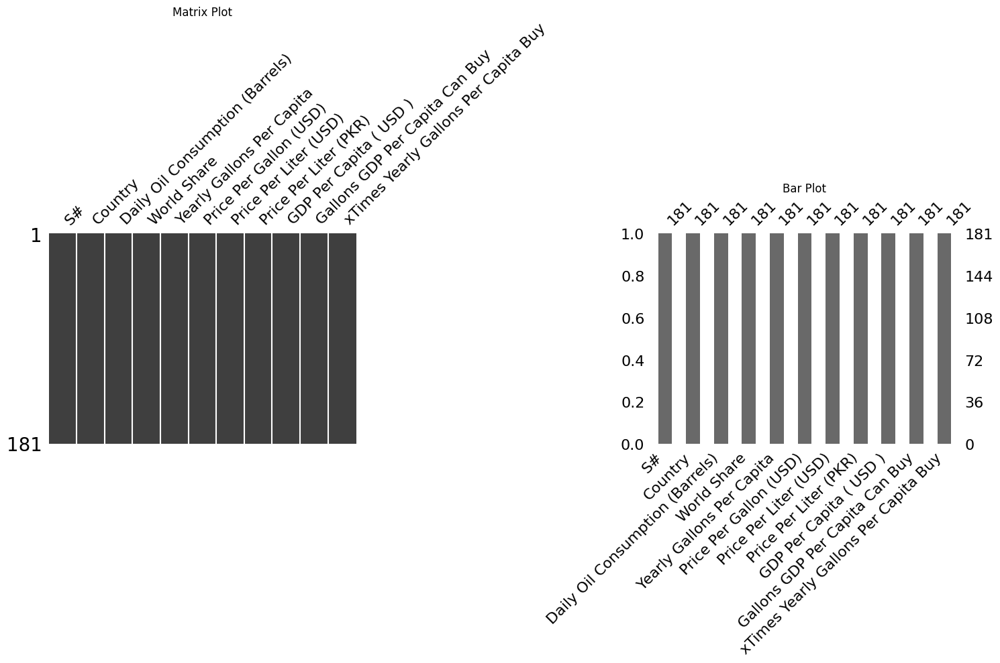

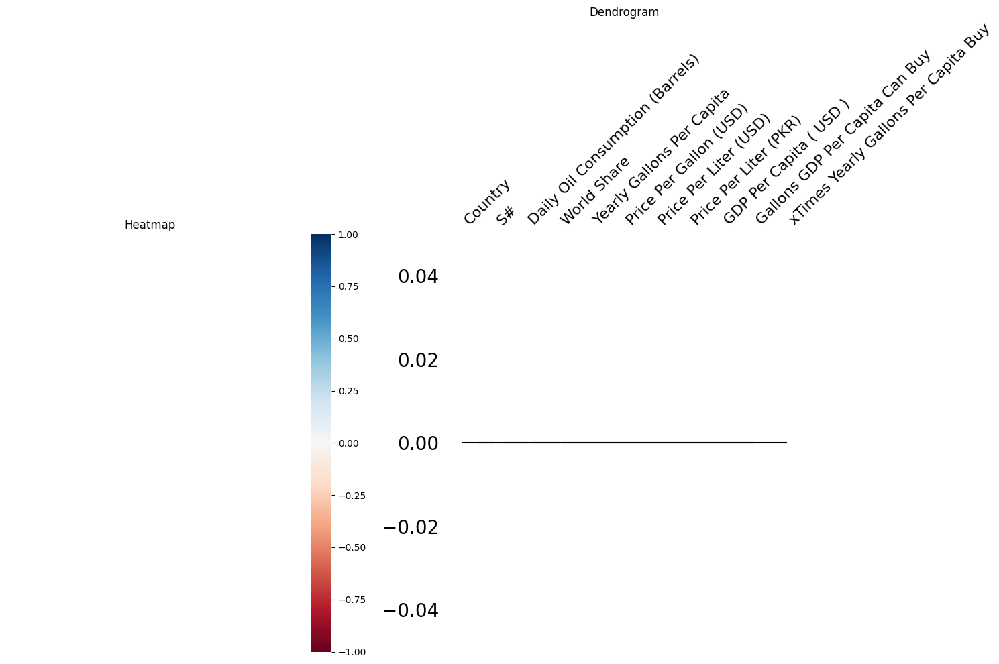

In [ ]:
r.visualizar_nulos(ppw)

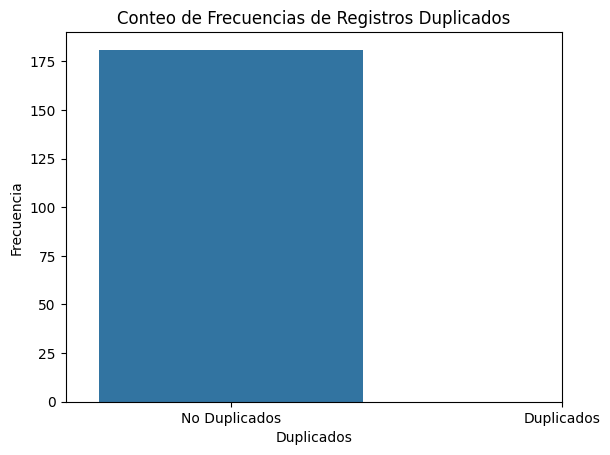

In [ ]:
r.hist_duplicados(ppw)

## YPF en NASDAQ

### Informe general

In [ ]:
r.informe_dataframe(nasdaq)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 21
Columnas: 6

--Numero de datos--
126

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 20
Columnas: ['Date', 'Close/Last', 'Volume', 'Open', 'High', 'Low']

--Tipo de columnas--
Date          object
Close/Last    object
Volume         int64
Open          object
High          object
Low           object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(nasdaq)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Date,[<class 'str'>],100.0,0.0,0
1,Close/Last,[<class 'str'>],100.0,0.0,0
2,Volume,[<class 'int'>],100.0,0.0,0
3,Open,[<class 'str'>],100.0,0.0,0
4,High,[<class 'str'>],100.0,0.0,0
5,Low,[<class 'str'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in nasdaq:
  r.informe_columna(nasdaq, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Date:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
21

--Valores unicos en la columna (Primeros 5 valores)--
['07/10/2024' '07/09/2024' '07/08/2024' '07/05/2024' '07/03/2024']

--Moda de la columna especificada--
Valor modal -----> 07/10/2024
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Date
07/10/2024    1
06/24/2024    1
06/11/2024    1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Close/Last:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
21

--Valores unicos en la columna (Primeros 5 valores)--
['$21.05' '$20.73' '$20.55' '$20.08' '$20.15']

--Moda

### Gráficos

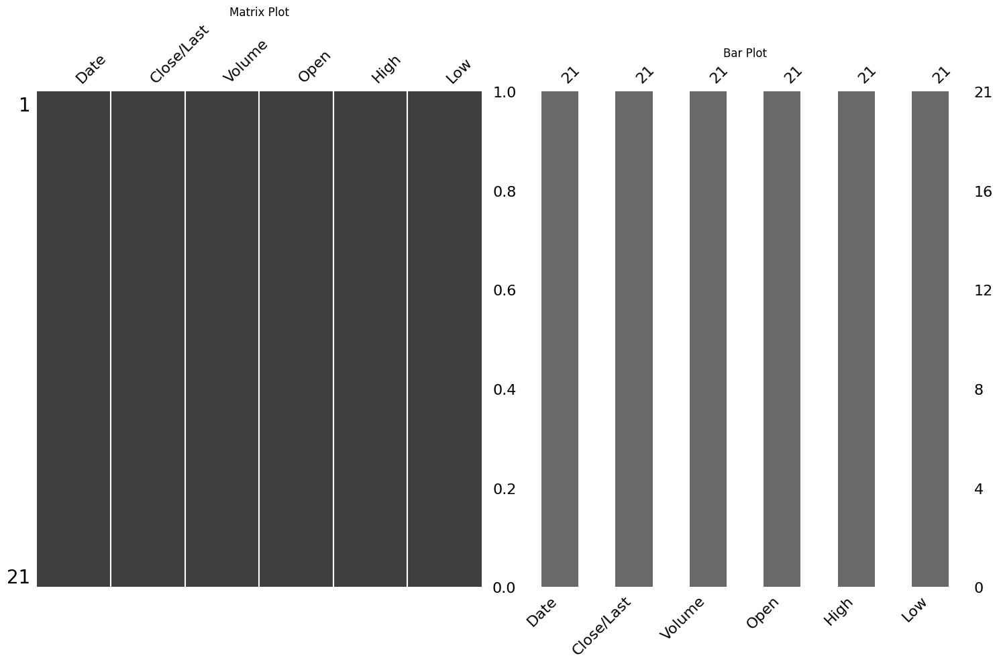

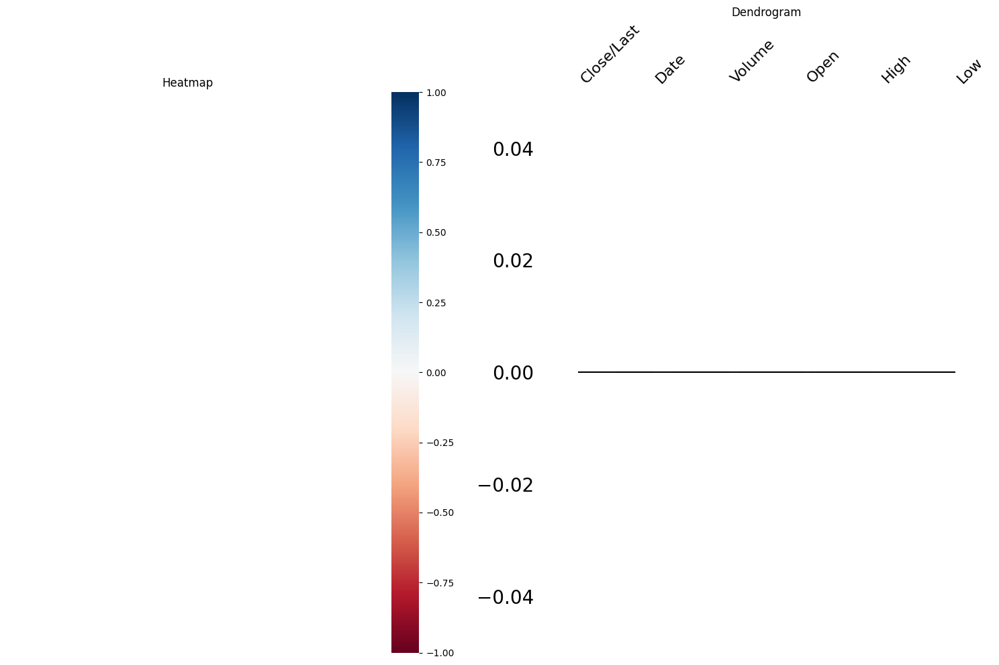

In [ ]:
r.visualizar_nulos(nasdaq)

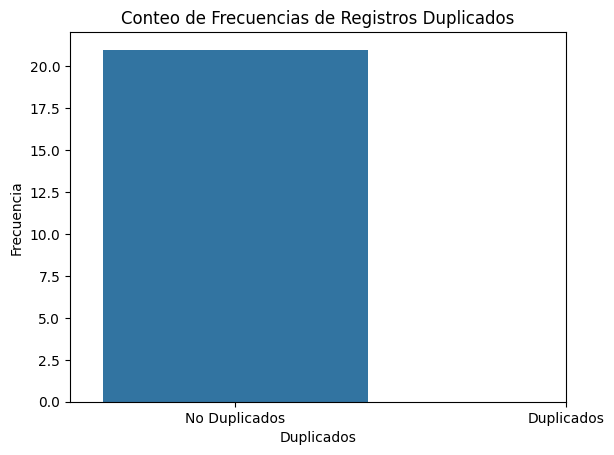

In [ ]:
r.hist_duplicados(nasdaq)

## CVXm

### Informe general

In [ ]:
r.informe_dataframe(CVXm)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 1173
Columnas: 7

--Numero de datos--
8211

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 1172
Columnas: ['Date', 'Price', 'Open', 'High', 'Low', 'Vol.', 'Change %']

--Tipo de columnas--
Date        object
Price       object
Open        object
High        object
Low         object
Vol.        object
Change %    object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(CVXm)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Date,[<class 'str'>],100.0,0.0,0
1,Price,[<class 'str'>],100.0,0.0,0
2,Open,[<class 'str'>],100.0,0.0,0
3,High,[<class 'str'>],100.0,0.0,0
4,Low,[<class 'str'>],100.0,0.0,0
5,Vol.,[<class 'str'>],100.0,0.0,0
6,Change %,[<class 'str'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in CVXm:
  r.informe_columna(CVXm, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Date:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1173

--Valores unicos en la columna (Primeros 5 valores)--
['07/11/2024' '07/10/2024' '07/08/2024' '07/05/2024' '07/04/2024']

--Moda de la columna especificada--
Valor modal -----> 07/11/2024
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Date
07/11/2024    1
05/11/2021    1
04/19/2021    1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Price:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1103

--Valores unicos en la columna (Primeros 5 valores)--
['13,650.00' '13,525.00' '13,362.00' '13,435.00' '14,24

### Gráficos

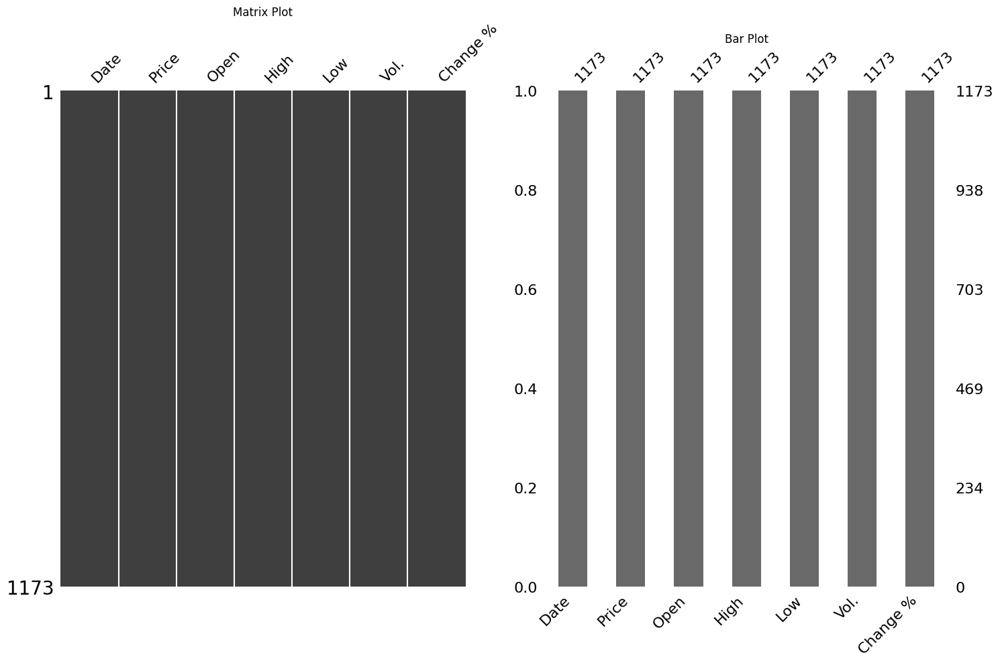

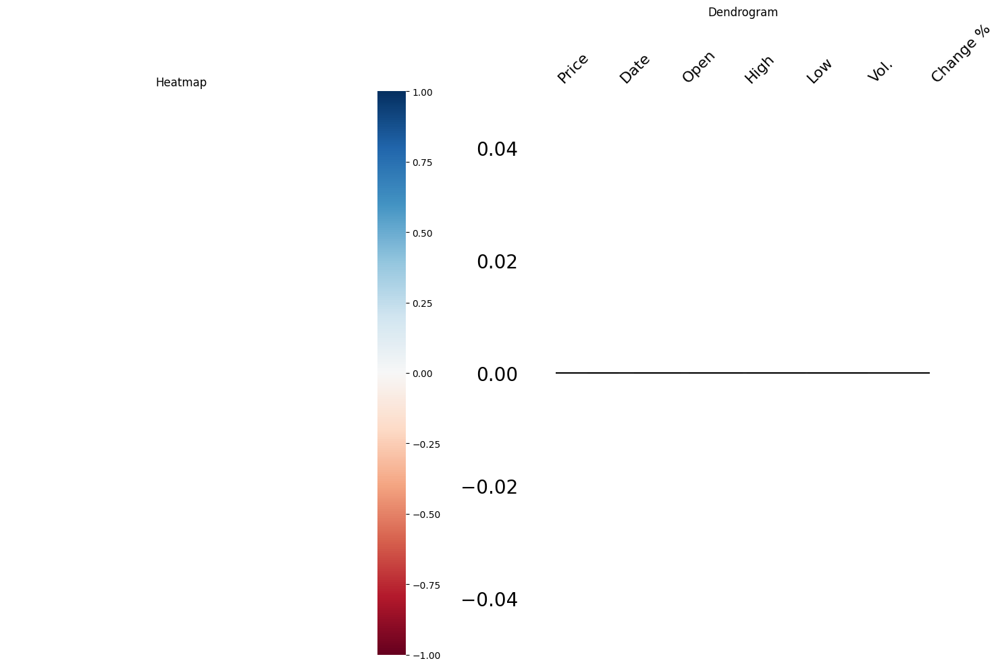

In [ ]:
r.visualizar_nulos(CVXm)

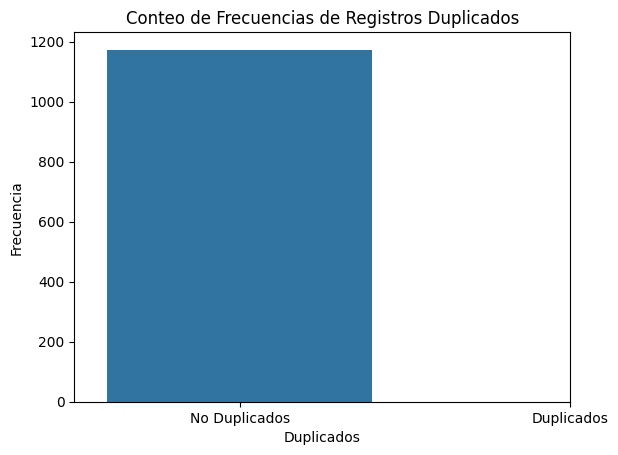

In [ ]:
r.hist_duplicados(CVXm)

## PBR

### Informe general

In [ ]:
r.informe_dataframe(PBR)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 1154
Columnas: 7

--Numero de datos--
8078

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 1153
Columnas: ['Date', 'Price', 'Open', 'High', 'Low', 'Vol.', 'Change %']

--Tipo de columnas--
Date        object
Price       object
Open        object
High        object
Low         object
Vol.        object
Change %    object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(PBR)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Date,[<class 'str'>],100.0,0.0,0
1,Price,[<class 'str'>],100.0,0.0,0
2,Open,[<class 'str'>],100.0,0.0,0
3,High,[<class 'str'>],100.0,0.0,0
4,Low,[<class 'str'>],100.0,0.0,0
5,Vol.,[<class 'str'>],100.0,0.0,0
6,Change %,[<class 'str'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in PBR:
  r.informe_columna(PBR, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Date:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1154

--Valores unicos en la columna (Primeros 5 valores)--
['07/11/2024' '07/10/2024' '07/08/2024' '07/05/2024' '07/04/2024']

--Moda de la columna especificada--
Valor modal -----> 07/11/2024
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Date
07/11/2024    1
12/17/2020    1
05/07/2021    1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Price:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1041

--Valores unicos en la columna (Primeros 5 valores)--
['21,375.00' '21,100.00' '20,980.00' '20,600.00' '20,94

### Gráficos

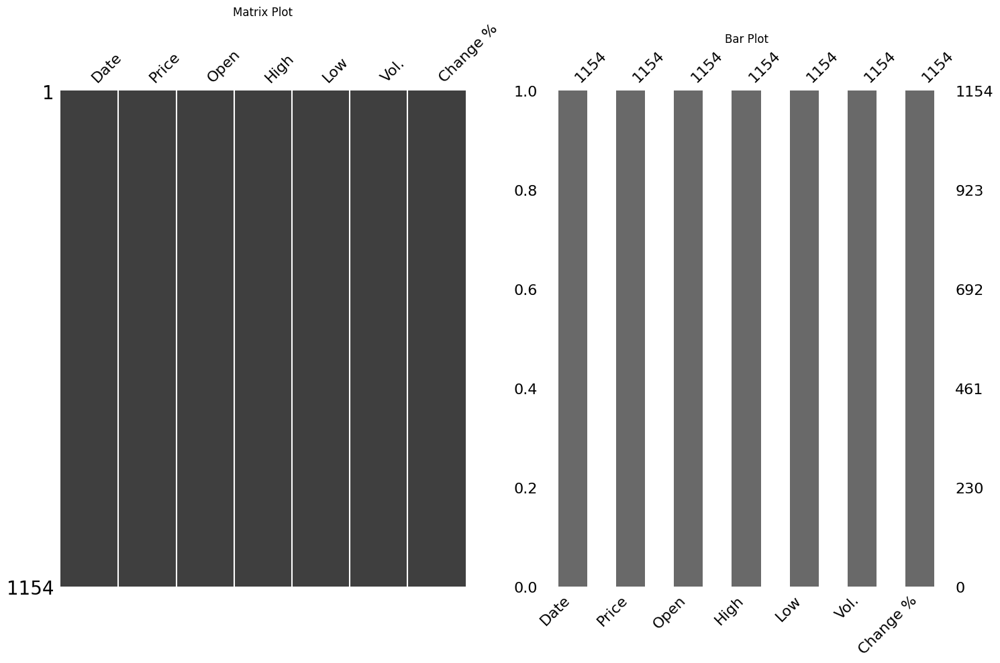

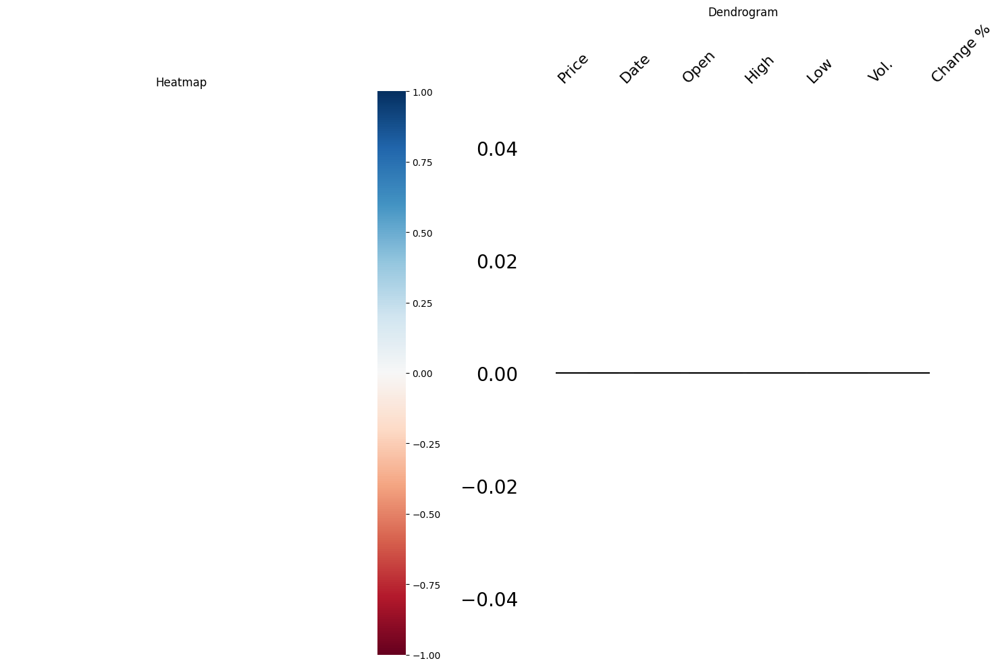

In [ ]:
r.visualizar_nulos(PBR)

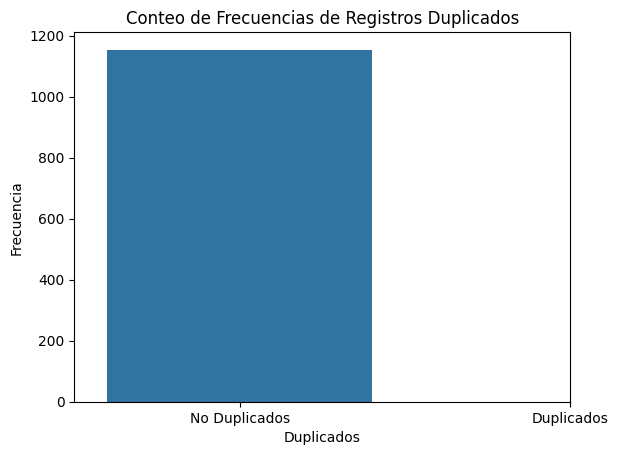

In [ ]:
r.hist_duplicados(PBR)

## PZD

### Informe general

In [ ]:
r.informe_dataframe(PZD)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 30
Columnas: 7

--Numero de datos--
210

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 29
Columnas: ['Date', 'Price', 'Open', 'High', 'Low', 'Vol.', 'Change %']

--Tipo de columnas--
Date         object
Price       float64
Open        float64
High        float64
Low         float64
Vol.         object
Change %     object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(PZD)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Date,[<class 'str'>],100.0,0.0,0
1,Price,[<class 'float'>],100.0,0.0,0
2,Open,[<class 'float'>],100.0,0.0,0
3,High,[<class 'float'>],100.0,0.0,0
4,Low,[<class 'float'>],100.0,0.0,0
5,Vol.,[<class 'str'>],100.0,0.0,0
6,Change %,[<class 'str'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in PZD:
  r.informe_columna(PZD, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Date:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
30

--Valores unicos en la columna (Primeros 5 valores)--
['05/18/2018' '05/17/2018' '05/16/2018' '05/15/2018' '05/14/2018']

--Moda de la columna especificada--
Valor modal -----> 05/18/2018
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Date
05/18/2018    1
05/17/2018    1
04/10/2018    1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Price:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [11.33 11.26 11.2  11.16 10.89]  -----> Desde 11.33  Hasta 11.68

--Estadisticos Principales de la columna--
Media: 11.15
Des

### Gráficos

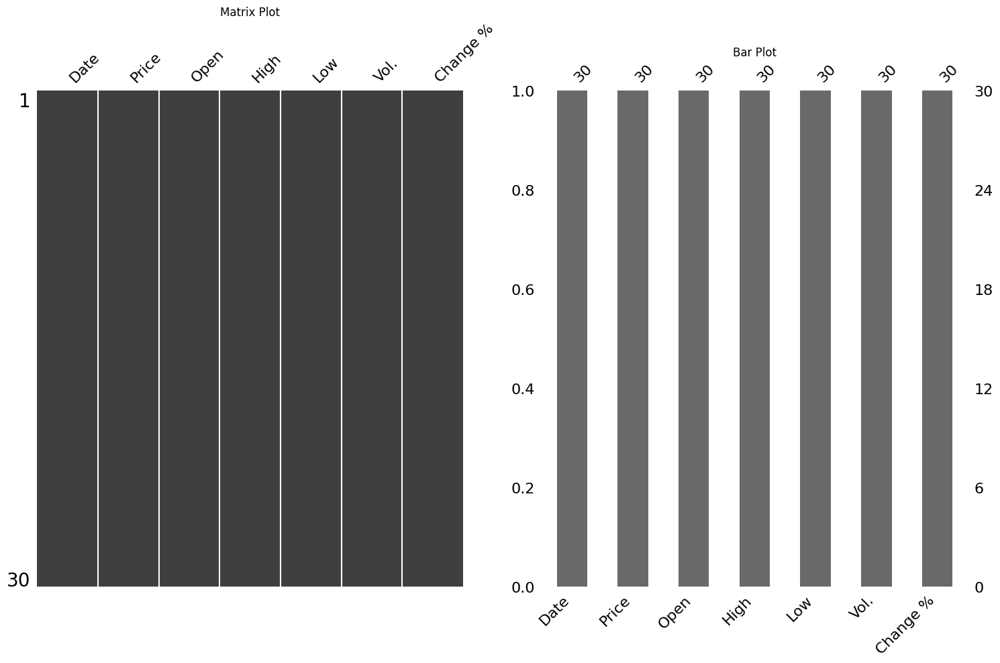

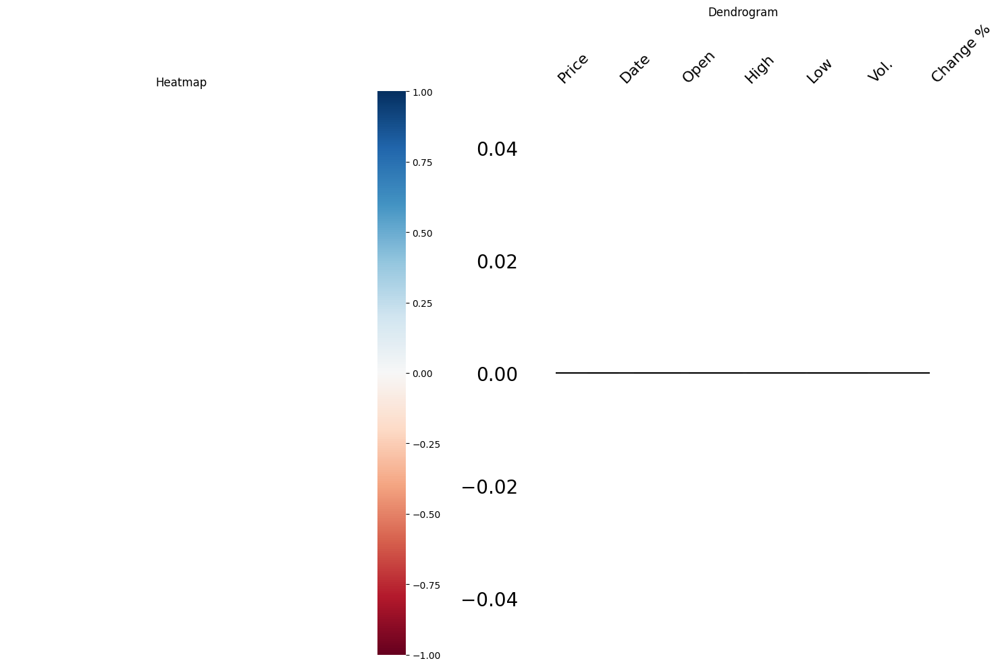

In [ ]:
r.visualizar_nulos(PZD)

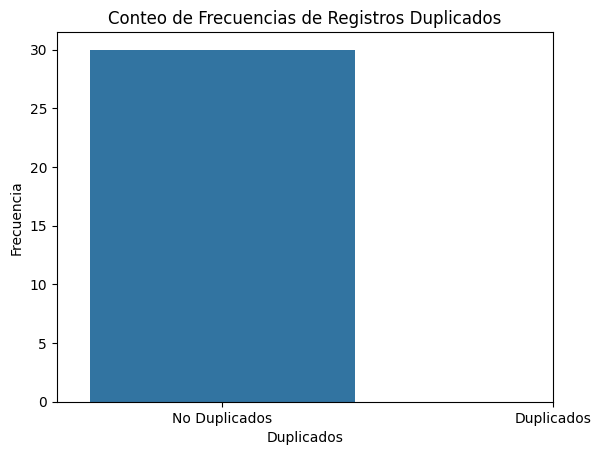

In [ ]:
r.hist_duplicados(PZD)

## Crude Oil Price

### Informe general

In [ ]:
r.informe_dataframe(price_oil)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 494
Columnas: 4

--Numero de datos--
1974

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 493
Columnas: ['date', 'price', 'percentChange', 'change']

--Tipo de columnas--
date              object
price            float64
percentChange    float64
change           float64
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(price_oil)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,date,[<class 'str'>],100.0,0.0,0
1,price,[<class 'float'>],100.0,0.0,0
2,percentChange,[<class 'float'>],99.8,0.2,1
3,change,[<class 'float'>],99.8,0.2,1


### Informe particular

In [ ]:
for columna in price_oil:
  r.informe_columna(price_oil, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE date:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
494

--Valores unicos en la columna (Primeros 5 valores)--
['1983-06-01 00:00:00+00:00' '1983-07-01 00:00:00+00:00'
 '1983-08-01 00:00:00+00:00' '1983-09-01 00:00:00+00:00'
 '1983-10-01 00:00:00+00:00']

--Moda de la columna especificada--
Valor modal -----> 1983-06-01 00:00:00+00:00
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 date
1983-06-01 00:00:00+00:00    1
2011-09-01 00:00:00+00:00    1
2011-07-01 00:00:00+00:00    1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE price:

--Numero de datos nulos--
0

--Valores unicos en la c

### Gráficos

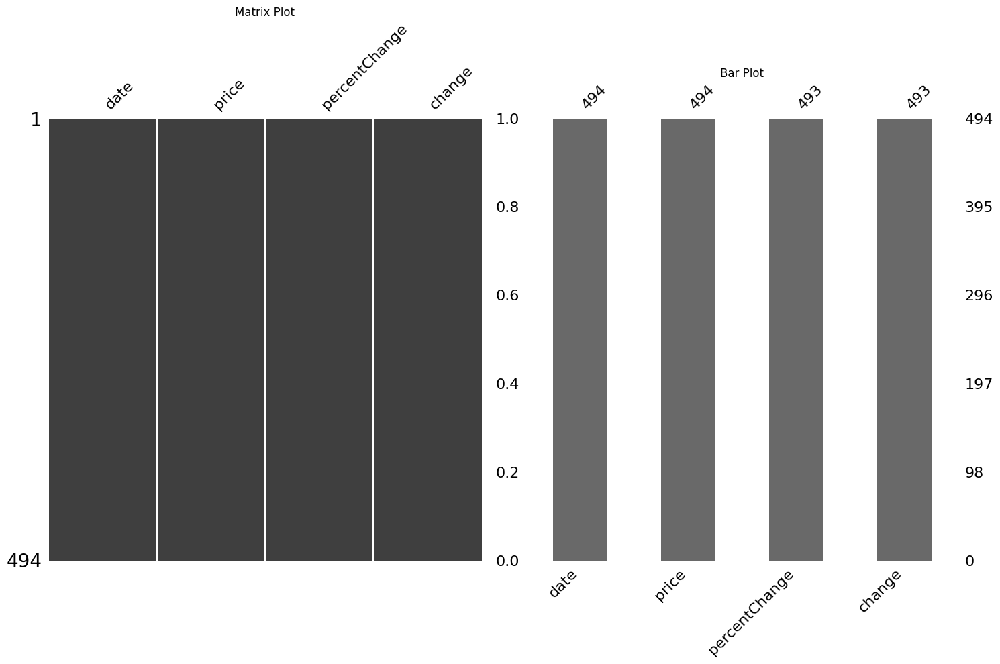

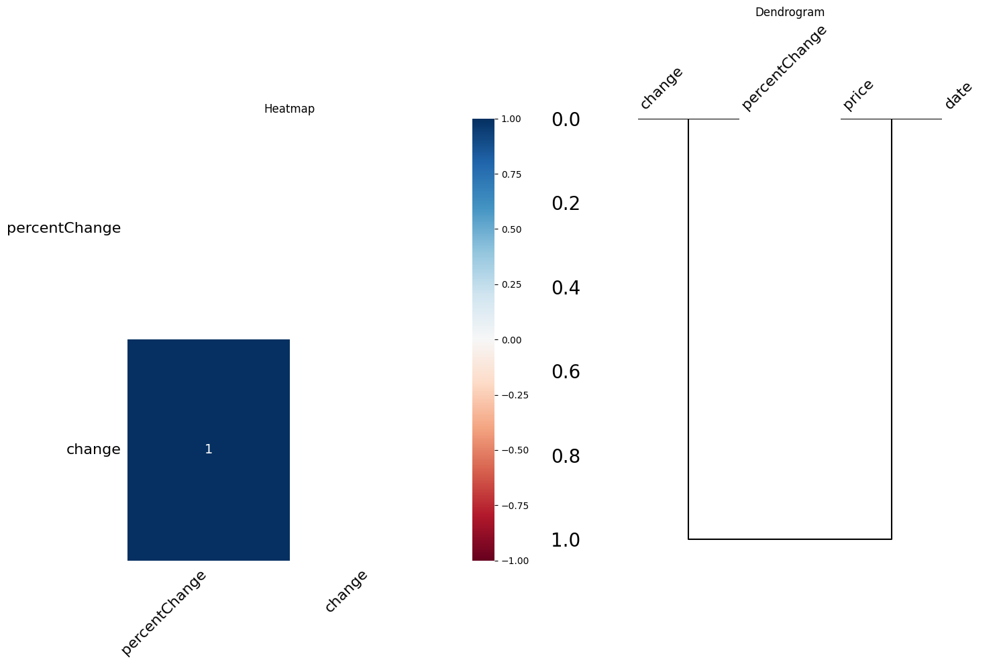

In [ ]:
r.visualizar_nulos(price_oil)

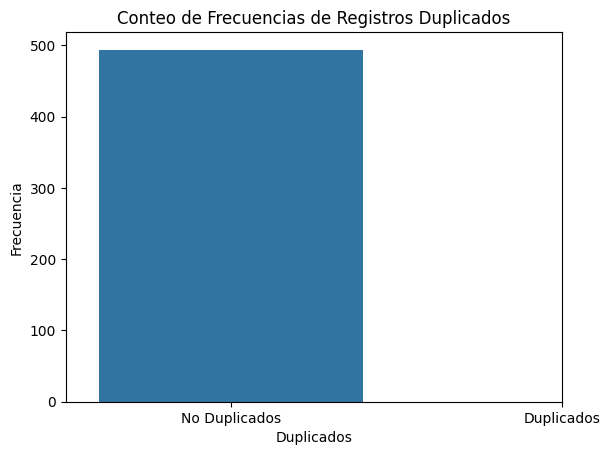

In [ ]:
r.hist_duplicados(price_oil)

## Inversiones 2020

### Informe general

In [ ]:
r.informe_dataframe(inv_20)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 48
Columnas: 5

--Numero de datos--
192

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 47
Columnas: ['Etiquetas de fila', 'Suma de Millones u$s Exploracion', 'Suma de Millones u$s Exp. Complementaria', 'Suma de Millones u$s Explotacion', None]

--Tipo de columnas--
Etiquetas de fila                            object
Suma de Millones u$s Exploracion            float64
Suma de Millones u$s Exp. Complementaria    float64
Suma de Millones u$s Explotacion            float64
None                                         object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(inv_20)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Etiquetas de fila,[<class 'str'>],100.0,0.0,0
1,Suma de Millones u$s Exploracion,[<class 'float'>],100.0,0.0,0
2,Suma de Millones u$s Exp. Complementaria,[<class 'float'>],100.0,0.0,0
3,Suma de Millones u$s Explotacion,[<class 'float'>],100.0,0.0,0
4,None,[<class 'NoneType'>],0.0,100.0,48


### Informe particular

In [ ]:
for columna in inv_20:
  r.informe_columna(inv_20, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Etiquetas de fila:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
48

--Valores unicos en la columna (Primeros 5 valores)--
['ALIANZA PETROLERA ARGENTINA S.A.' 'CAPETROL ARGENTINA S.A.'
 'CAPETROL S.A.' 'CAPEX S.A.' 'CHEVRON ARGENTINA S.R.L.']

--Moda de la columna especificada--
Valor modal -----> ALIANZA PETROLERA ARGENTINA S.A.
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Etiquetas de fila
ALIANZA PETROLERA ARGENTINA S.A.    1
CAPETROL ARGENTINA S.A.             1
PAN AMERICAN ENERGY SL              1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Suma de Millones u$s Exploracion

### Gráficos

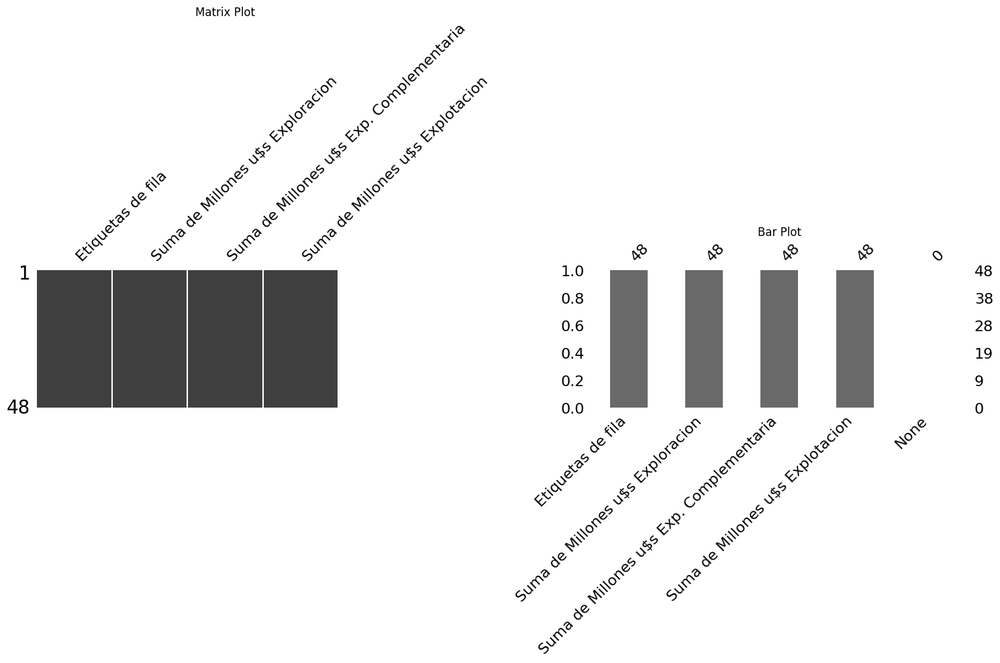

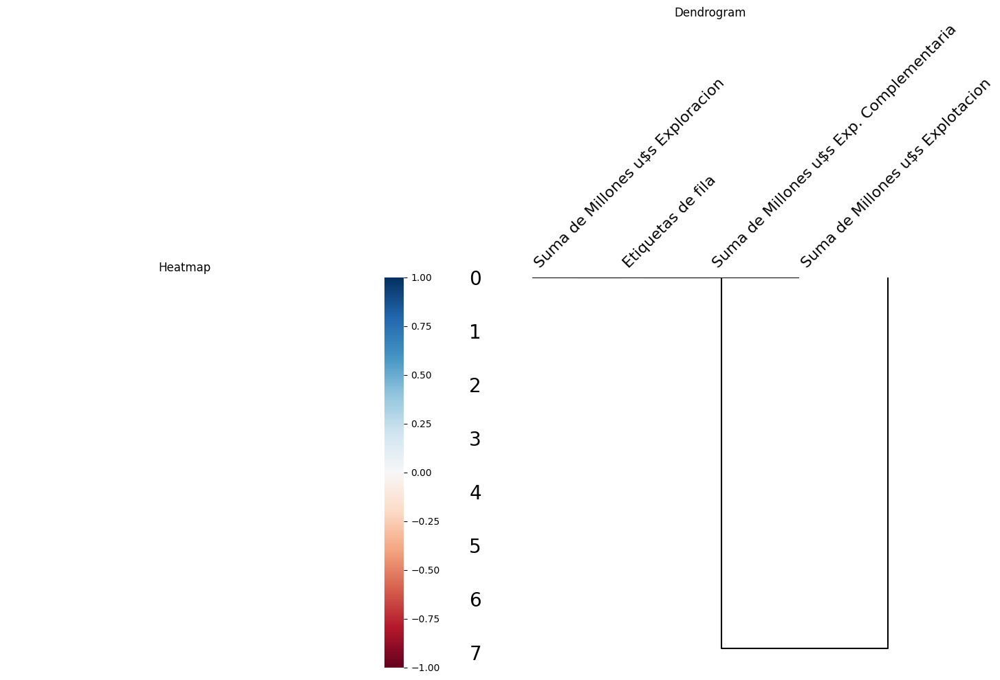

In [ ]:
r.visualizar_nulos(inv_20)

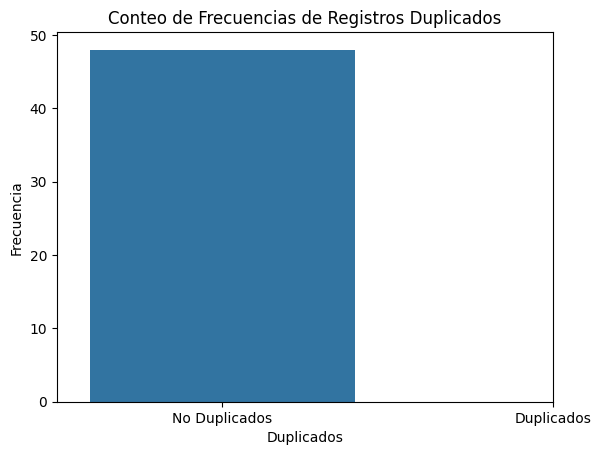

In [ ]:
r.hist_duplicados(inv_20)

## Inversiones 2021

### Informe general

In [ ]:
r.informe_dataframe(inv_21)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 250
Columnas: 5

--Numero de datos--
212

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 249
Columnas: ['Etiquetas de fila', 'Suma de Millones u$s Exploracion', 'Suma de Millones u$s Exp. Complementaria', 'Suma de Millones u$s Explotacion', None]

--Tipo de columnas--
Etiquetas de fila                            object
Suma de Millones u$s Exploracion            float64
Suma de Millones u$s Exp. Complementaria    float64
Suma de Millones u$s Explotacion            float64
None                                         object
dtype: object
--Cantidad de registros duplicados--
196



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(inv_21)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Etiquetas de fila,"[<class 'str'>, <class 'NoneType'>]",21.2,78.8,197
1,Suma de Millones u$s Exploracion,[<class 'float'>],21.2,78.8,197
2,Suma de Millones u$s Exp. Complementaria,[<class 'float'>],21.2,78.8,197
3,Suma de Millones u$s Explotacion,[<class 'float'>],21.2,78.8,197
4,None,[<class 'NoneType'>],0.0,100.0,250


### Informe particular

In [ ]:
for columna in inv_21:
  r.informe_columna(inv_21, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Etiquetas de fila:

--Numero de datos nulos--
197

--Cantidad de valores unicos en la columna--
53

--Valores unicos en la columna (Primeros 5 valores)--
['CAPETROL ARGENTINA S.A.' 'CAPETROL S.A.' 'CAPEX S.A.'
 'CHEVRON ARGENTINA S.R.L.' 'COLHUE HUAPI S.A.']

--Moda de la columna especificada--
Valor modal -----> CAPETROL ARGENTINA S.A.
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Etiquetas de fila
CAPETROL ARGENTINA S.A.    1
OILSTONE ENERGIA S.A.      1
PAMPETROL S.A.P.E.M        1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Suma de Millones u$s Exploracion:

--Numero de datos nulos--
197

--Valores unico

### Gráficos

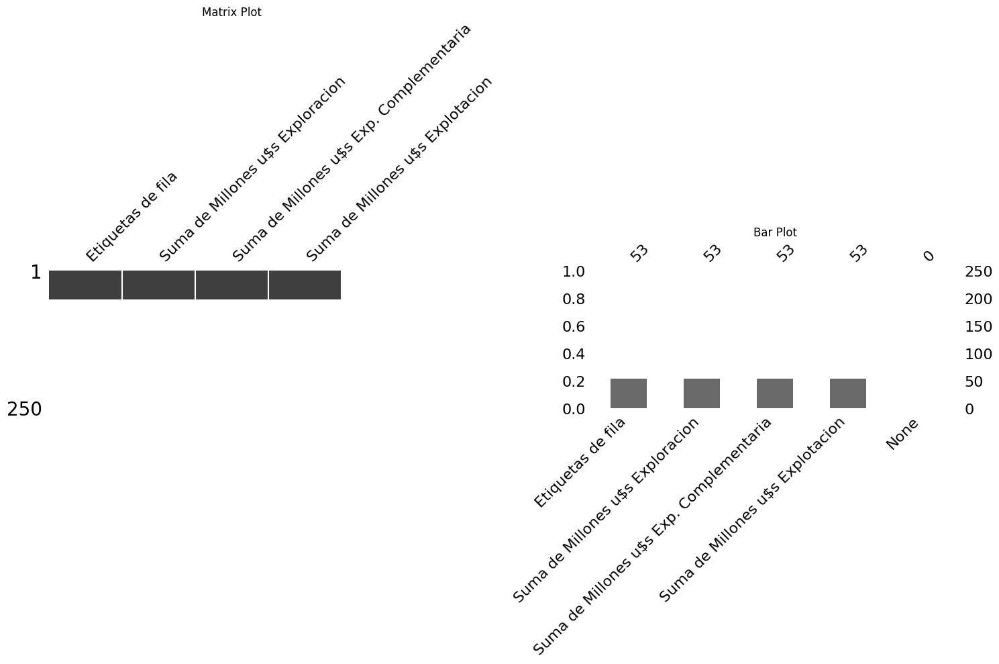

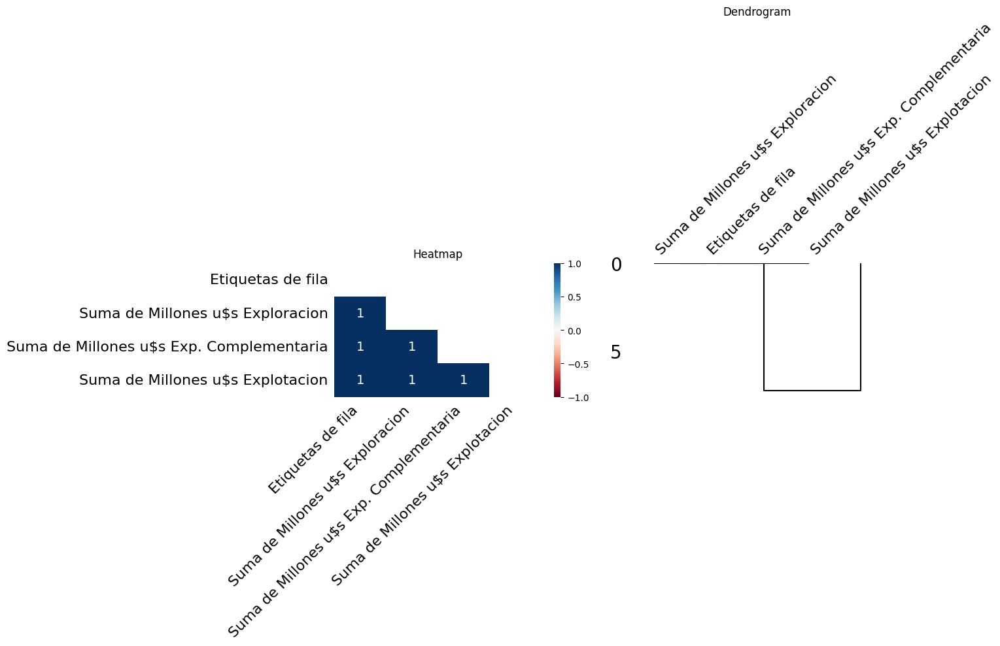

In [ ]:
r.visualizar_nulos(inv_21)

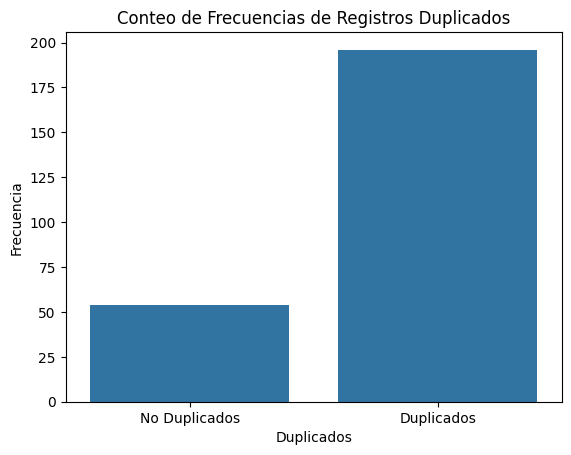

In [ ]:
r.hist_duplicados(inv_21)

## Inversiones 2022

### Informe general

In [ ]:
r.informe_dataframe(inv_22)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 47
Columnas: 5

--Numero de datos--
184

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 46
Columnas: ['Etiquetas de fila', 'Suma de Millones u$s Exploracion', 'Suma de Millones u$s Exp. Complementaria', 'Suma de Millones u$s Explotacion', None]

--Tipo de columnas--
Etiquetas de fila                            object
Suma de Millones u$s Exploracion            float64
Suma de Millones u$s Exp. Complementaria    float64
Suma de Millones u$s Explotacion            float64
None                                         object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(inv_22)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Etiquetas de fila,"[<class 'str'>, <class 'NoneType'>]",97.87,2.13,1
1,Suma de Millones u$s Exploracion,[<class 'float'>],97.87,2.13,1
2,Suma de Millones u$s Exp. Complementaria,[<class 'float'>],97.87,2.13,1
3,Suma de Millones u$s Explotacion,[<class 'float'>],97.87,2.13,1
4,None,[<class 'NoneType'>],0.00,100.00,47


### Informe particular

In [ ]:
for columna in inv_22:
  r.informe_columna(inv_22, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Etiquetas de fila:

--Numero de datos nulos--
1

--Cantidad de valores unicos en la columna--
46

--Valores unicos en la columna (Primeros 5 valores)--
['CAPETROL ARGENTINA S.A.' 'CAPETROL S.A.' 'CAPEX S.A.'
 'CHEVRON ARGENTINA S.R.L.' 'COLHUE HUAPI S.A.']

--Moda de la columna especificada--
Valor modal -----> CAPETROL ARGENTINA S.A.
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Etiquetas de fila
CAPETROL ARGENTINA S.A.    1
PLUSPETROL S.A.            1
PAN AMERICAN ENERGY SL     1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Suma de Millones u$s Exploracion:

--Numero de datos nulos--
1

--Valores unicos en

### Gráficos

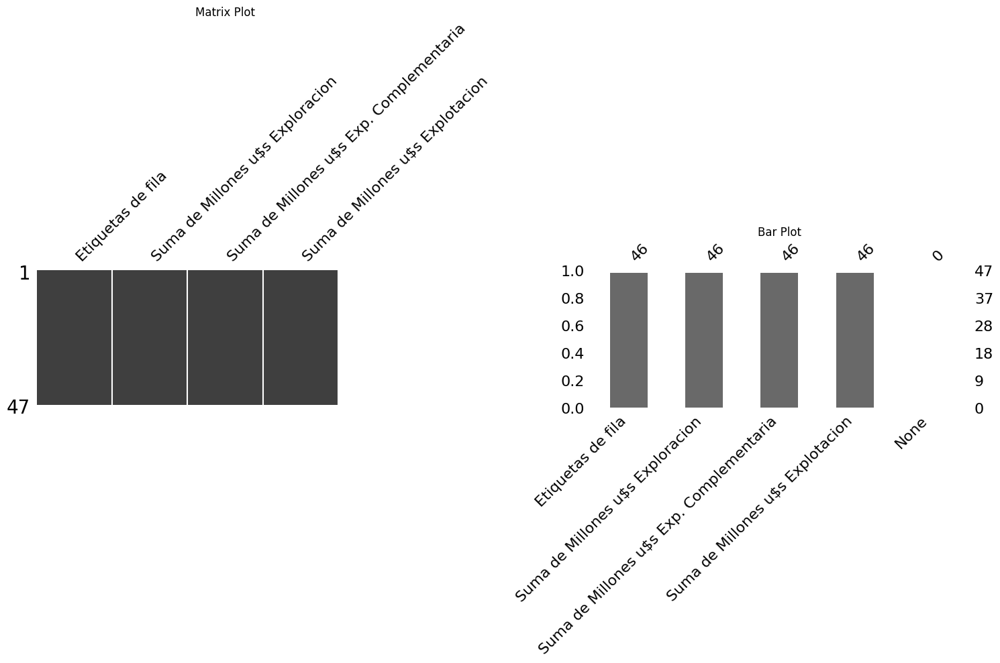

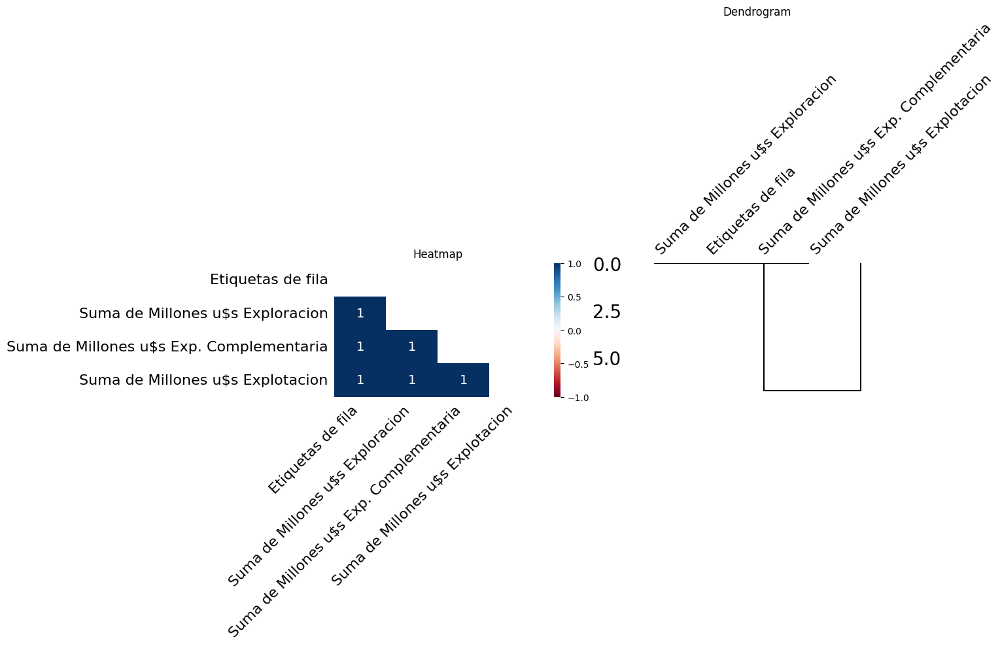

In [ ]:
r.visualizar_nulos(inv_22)

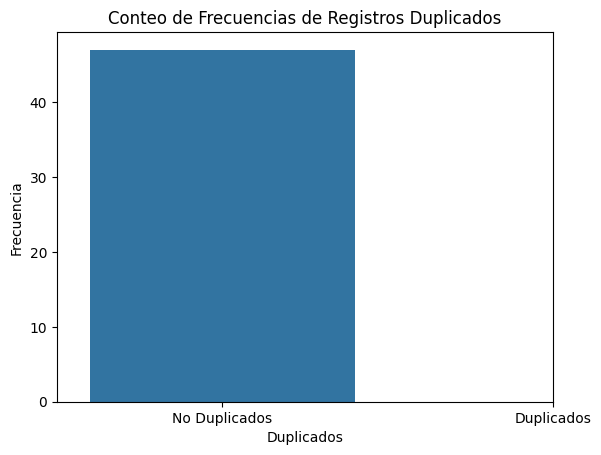

In [ ]:
r.hist_duplicados(inv_22)

## Inversiones 2023

### Informe general

In [ ]:
r.informe_dataframe(inv_23)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 47
Columnas: 5

--Numero de datos--
188

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 46
Columnas: ['Etiquetas de fila', 'Suma de Millones u$s Exploracion', 'Suma de Millones u$s Exp. Complementaria', 'Suma de Millones u$s Explotacion', None]

--Tipo de columnas--
Etiquetas de fila                            object
Suma de Millones u$s Exploracion            float64
Suma de Millones u$s Exp. Complementaria    float64
Suma de Millones u$s Explotacion            float64
None                                         object
dtype: object
--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(inv_23)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Etiquetas de fila,[<class 'str'>],100.0,0.0,0
1,Suma de Millones u$s Exploracion,[<class 'float'>],100.0,0.0,0
2,Suma de Millones u$s Exp. Complementaria,[<class 'float'>],100.0,0.0,0
3,Suma de Millones u$s Explotacion,[<class 'float'>],100.0,0.0,0
4,None,[<class 'NoneType'>],0.0,100.0,47


### Informe particular

In [ ]:
for columna in inv_23:
  r.informe_columna(inv_23, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Etiquetas de fila:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
47

--Valores unicos en la columna (Primeros 5 valores)--
['ALIANZA PETROLERA ARGENTINA S.A.' 'CAPETROL ARGENTINA S.A.'
 'CAPETROL S.A.' 'CGC ENERGIA SAU' 'CHEVRON ARGENTINA S.R.L.']

--Moda de la columna especificada--
Valor modal -----> ALIANZA PETROLERA ARGENTINA S.A.
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Etiquetas de fila
ALIANZA PETROLERA ARGENTINA S.A.    1
QUINTANA E&P ARGENTINA S.R.L.       1
PETROLEOS SUDAMERICANOS S.A.        1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Suma de Millones u$s Explor

### Gráficos

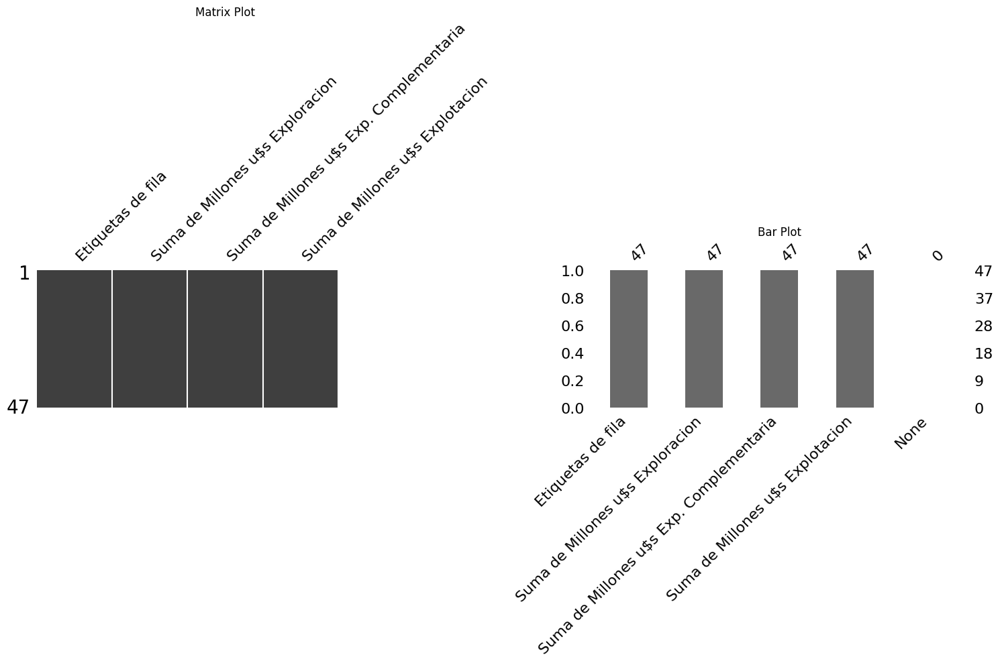

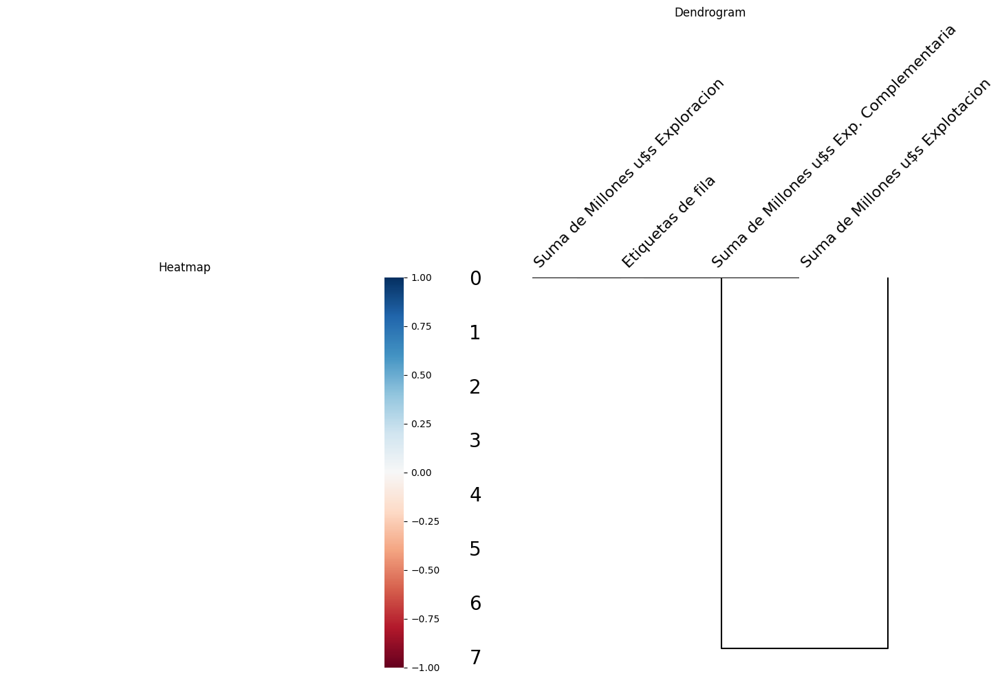

In [ ]:
r.visualizar_nulos(inv_23)

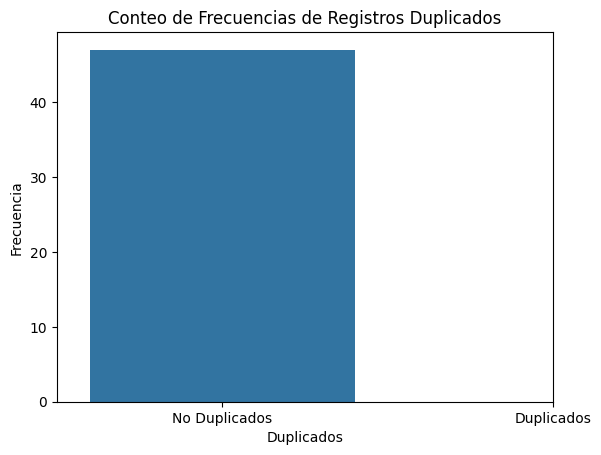

In [ ]:
r.hist_duplicados(inv_23)

## Inversiones 2024

### Informe general

In [ ]:
r.informe_dataframe(inv_24)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 47
Columnas: 5

--Numero de datos--
172

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 46
Columnas: ['Etiquetas de fila', 'Suma de Millones u$s Exploracion', 'Suma de Millones u$s Exp. Complementaria', 'Suma de Millones u$s Explotacion', None]

--Tipo de columnas--
Etiquetas de fila                            object
Suma de Millones u$s Exploracion            float64
Suma de Millones u$s Exp. Complementaria    float64
Suma de Millones u$s Explotacion            float64
None                                         object
dtype: object
--Cantidad de registros duplicados--
3



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(inv_24)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Etiquetas de fila,"[<class 'str'>, <class 'NoneType'>]",91.49,8.51,4
1,Suma de Millones u$s Exploracion,[<class 'float'>],91.49,8.51,4
2,Suma de Millones u$s Exp. Complementaria,[<class 'float'>],91.49,8.51,4
3,Suma de Millones u$s Explotacion,[<class 'float'>],91.49,8.51,4
4,None,[<class 'NoneType'>],0.00,100.00,47


### Informe particular

In [ ]:
for columna in inv_24:
  r.informe_columna(inv_24, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Etiquetas de fila:

--Numero de datos nulos--
4

--Cantidad de valores unicos en la columna--
43

--Valores unicos en la columna (Primeros 5 valores)--
['CAPETROL ARGENTINA S.A.' 'CAPETROL S.A.' 'CAPEX S.A.' 'CGC ENERGIA SAU'
 'CHEVRON ARGENTINA S.R.L.']

--Moda de la columna especificada--
Valor modal -----> CAPETROL ARGENTINA S.A.
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Etiquetas de fila
CAPETROL ARGENTINA S.A.             1
RECURSOS Y ENERGIA FORMOSA S.A.     1
PETROLERA ACONCAGUA ENERGIA S.A.    1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Suma de Millones u$s Exploracion:

--Numero de datos nulos

### Gráficos

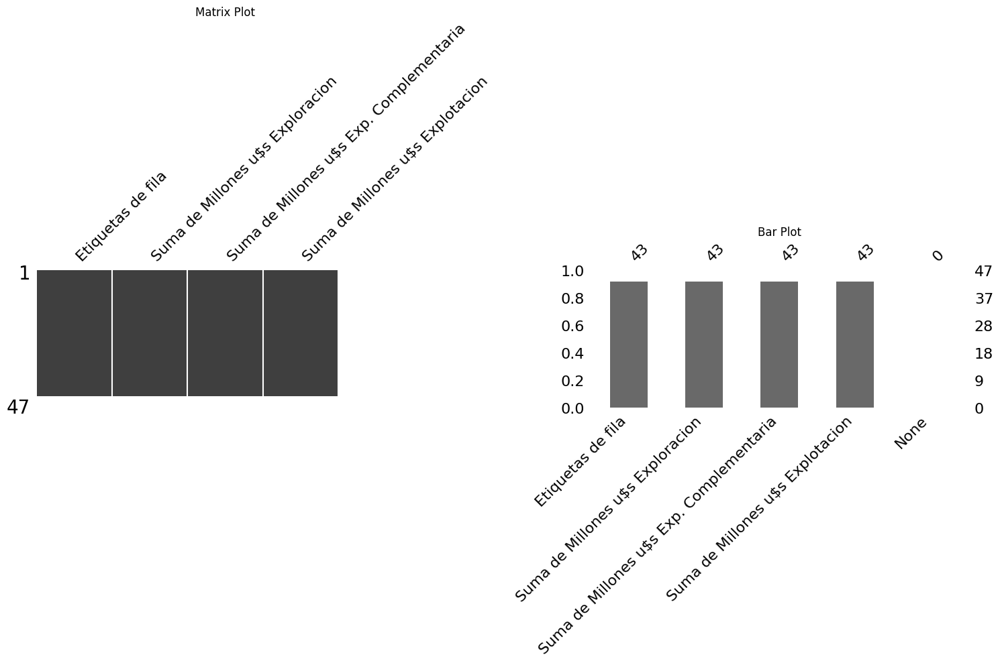

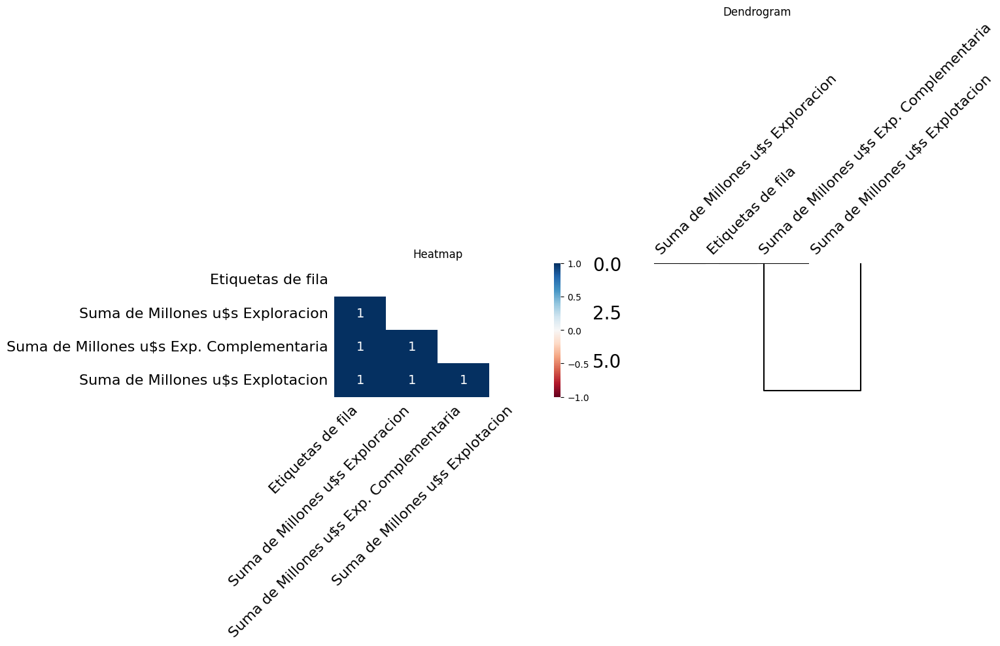

In [ ]:
r.visualizar_nulos(inv_24)

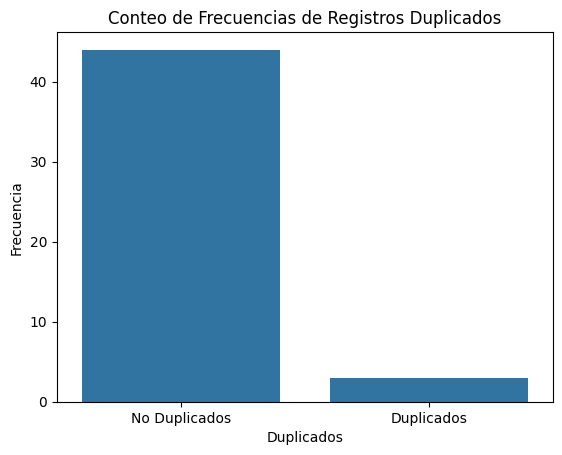

In [ ]:
r.hist_duplicados(inv_24)

## BS

### Informe general

In [ ]:
r.informe_dataframe(bs)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 2
Columnas: 50

--Numero de datos--
100

--Filas y Columnas--
Filas: muestra de indices-------> [43830.0, 43921.0]  -----> Desde 43830.0  Hasta 43921.0
Columnas: ['BALANCE SHEETS (Amounts expressed in million of Argentine Pesos) ', 'Noncurrent Assets', 'Intangible assets', 'Properties, plant and equipment', 'Assets for leasing', 'Investments in companies and joint ventures', 'Deferred tax assets, net', 'Other receivables', 'Trade receivables', 'Total Non-current assets', 'Current Assets', 'Assets held for disposal', 'Inventories', 'Contract assets', 'Other receivables_1', 'Trade receivables_1', 'Investment in financial assets', 'Cash and equivalents', 'Total current assets', 'Total assets', 'Shareholders’ equity ', 'Shareholders’ contributions', 'Reserves, other comprehensive income and retained earnings', 'Noncontrolling interest', 'Total Shareholders’ equity', 'Noncurrent Liabilities', 'Provis

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(bs)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,BALANCE SHEETS (Amounts expressed in million of Argentine Pesos),[<class 'str'>],100.0,0.0,0
1,Noncurrent Assets,[<class 'str'>],100.0,0.0,0
2,Intangible assets,[<class 'float'>],100.0,0.0,0
3,"Properties, plant and equipment",[<class 'float'>],100.0,0.0,0
4,Assets for leasing,[<class 'float'>],100.0,0.0,0
5,Investments in companies and joint ventures,[<class 'float'>],100.0,0.0,0
6,"Deferred tax assets, net",[<class 'float'>],100.0,0.0,0
7,Other receivables,[<class 'float'>],100.0,0.0,0
8,Trade receivables,[<class 'float'>],100.0,0.0,0
9,Total Non-current assets,[<class 'float'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in bs:
  r.informe_columna(bs, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE BALANCE SHEETS (Amounts expressed in million of Argentine Pesos) :

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1

--Valores unicos en la columna--
['']

--Moda de la columna especificada--
Valor modal -----> 
Frecuencia acumulada ------> 2

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 BALANCE SHEETS (Amounts expressed in million of Argentine Pesos) 
    2
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Noncurrent Assets:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1

--Valores unicos en la columna--
['']

--Moda de la columna especificada--
Valor modal -----> 
Frecuencia acumulada 

### Gráficos

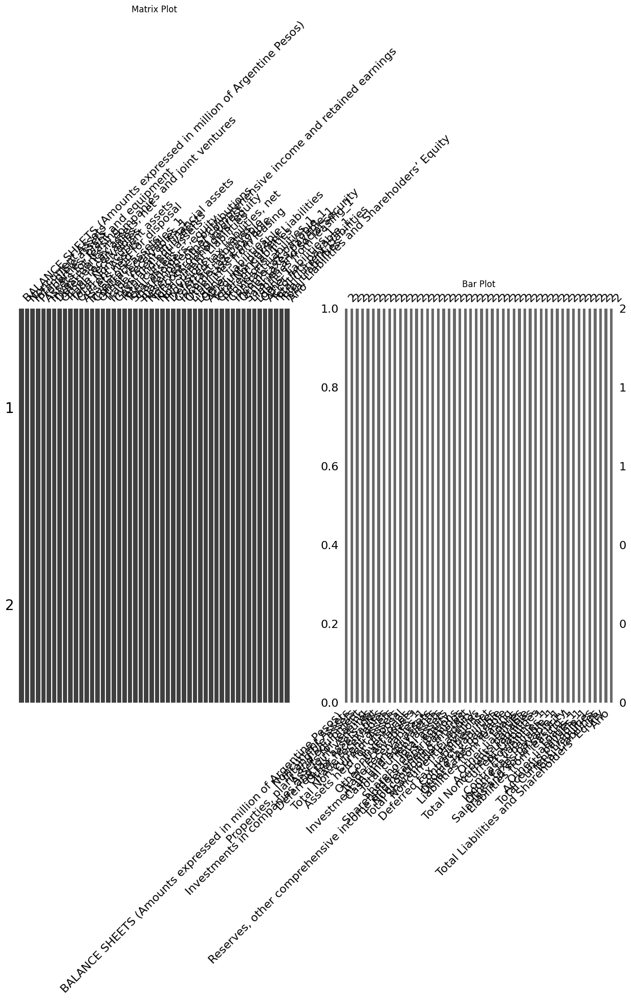

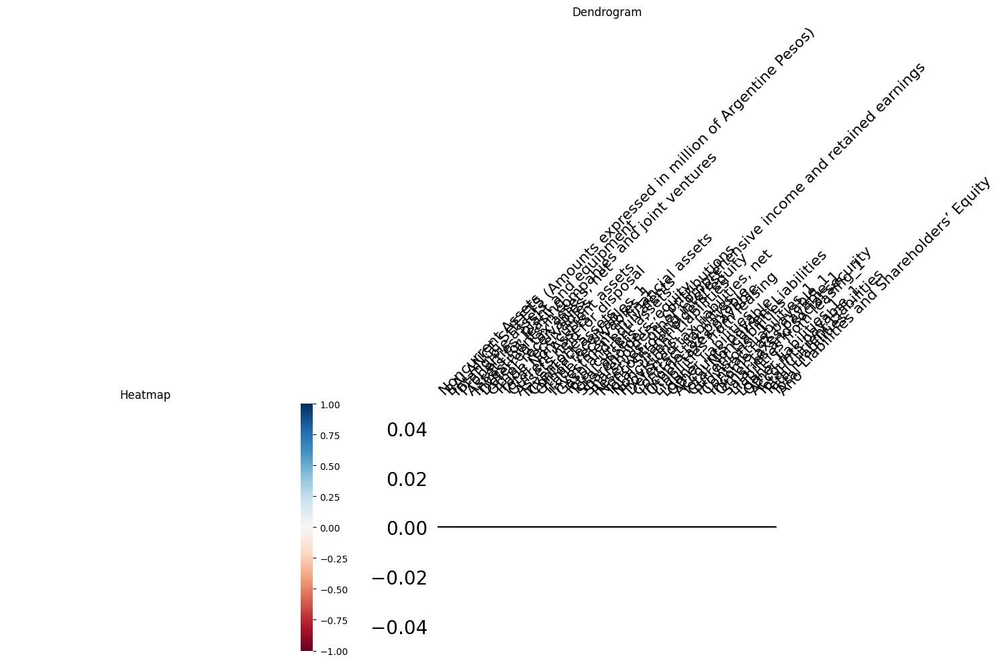

In [ ]:
r.visualizar_nulos(bs)

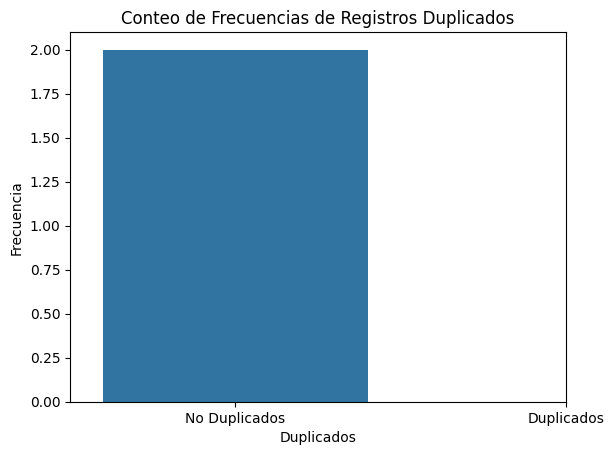

In [ ]:
r.hist_duplicados(bs)

## CF

### Informe general

In [ ]:
r.informe_dataframe(cf)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 3
Columnas: 53

--Numero de datos--
159

--Filas y Columnas--
Filas: muestra de indices-------> ['1Q 2019', '4Q 2019', '1Q 2020']  -----> Desde 1Q 2019  Hasta 1Q 2020
Columnas: ['CASH FLOW (Amounts expressed in million of Argentine Pesos) ', 'Operating activities', 'Net income ', 'Income of interests in companies and joint ventures', 'Depreciation of property, plant and equipment', 'Depreciation of the right-of-use assets', 'Amortization of intangible assets', 'Losses of property, plant and equipment and intangible assets and consumption of materials', 'Income tax charge', 'Net increase in provisions', 'Interest, exchange differences and other', 'Stock compensation plans', 'Accrued insurance', 'Results for assignment of participation in areas', 'Changes in assets and liabilities:', 'Trade receivables', 'Other receivables', 'Inventories', 'Accounts payable', 'Other taxes payable', 'Salaries and S

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(cf)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,CASH FLOW (Amounts expressed in million of Argentine Pesos),[<class 'str'>],100.0,0.0,0
1,Operating activities,[<class 'str'>],100.0,0.0,0
2,Net income,[<class 'float'>],100.0,0.0,0
3,Income of interests in companies and joint ventures,[<class 'float'>],100.0,0.0,0
4,"Depreciation of property, plant and equipment",[<class 'float'>],100.0,0.0,0
5,Depreciation of the right-of-use assets,[<class 'float'>],100.0,0.0,0
6,Amortization of intangible assets,[<class 'float'>],100.0,0.0,0
7,"Losses of property, plant and equipment and intangible assets and consumption of materials",[<class 'float'>],100.0,0.0,0
8,Income tax charge,[<class 'float'>],100.0,0.0,0
9,Net increase in provisions,[<class 'float'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in cf:
  r.informe_columna(cf, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE CASH FLOW (Amounts expressed in million of Argentine Pesos) :

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1

--Valores unicos en la columna--
['']

--Moda de la columna especificada--
Valor modal -----> 
Frecuencia acumulada ------> 3

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 CASH FLOW (Amounts expressed in million of Argentine Pesos) 
    3
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Operating activities:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1

--Valores unicos en la columna--
['']

--Moda de la columna especificada--
Valor modal -----> 
Frecuencia acumulada ------>

### Gráficos

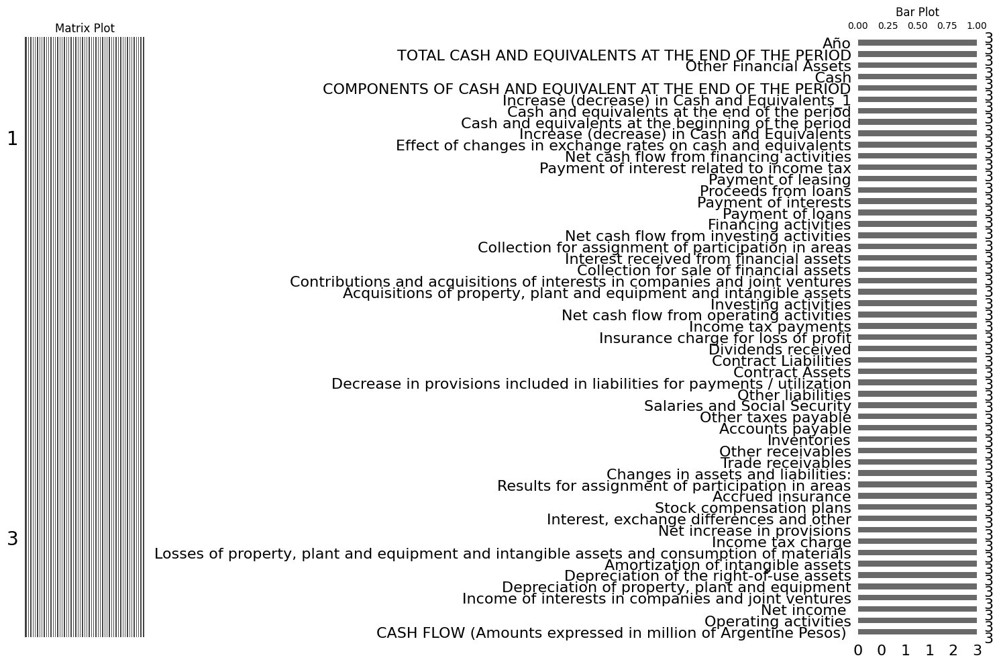

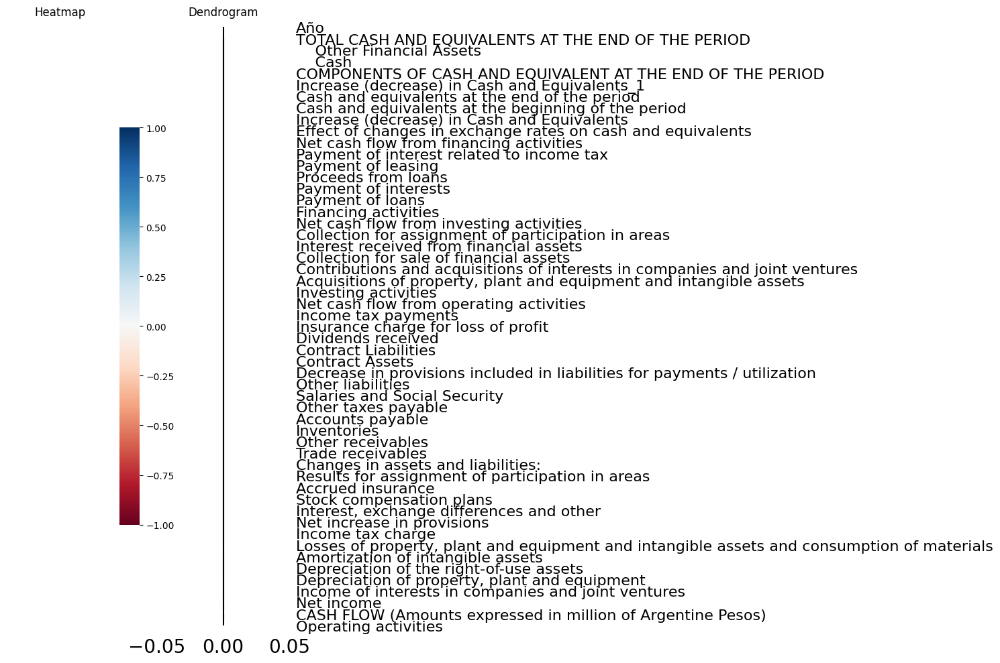

In [ ]:
r.visualizar_nulos(cf)

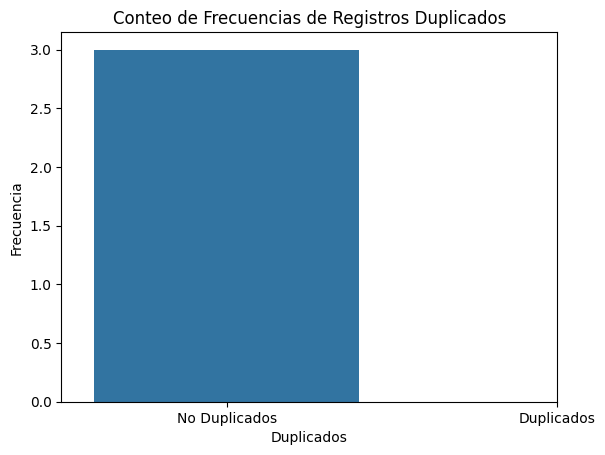

In [ ]:
r.hist_duplicados(cf)

## P&L

### Informe general

In [ ]:
r.informe_dataframe(pyl)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 3
Columnas: 23

--Numero de datos--
69

--Filas y Columnas--
Filas: muestra de indices-------> ['1Q 2019', '4Q 2019', '1Q 2020']  -----> Desde 1Q 2019  Hasta 1Q 2020
Columnas: ['(Amounts expressed in million of Argentine Pesos) ', 'Revenues', 'Costs', 'Gross Profit', 'Selling Expenses', 'Administration Expenses', 'Exploration Expenses', 'Other operating results, net', 'Operating Income', 'Income (loss) of interest in companies and joint ventures', 'Finance Income', 'Finance Cost', 'Other Financial Results', 'Finantial Results, net', 'Net (loss) profit before income tax', 'Income tax', 'Net (loss) profit for the period', 'Net (loss) profit for shareholders of the parent company', 'Net (loss) profits for noncontrolling interest', 'Earnings per share, basic and diluted', 'Other comprehensive Income', 'Total comprehensive income for the period', 'Año']

--Tipo de columnas--

(Amounts expressed in mi

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(pyl)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,(Amounts expressed in million of Argentine Pesos),[<class 'str'>],100.0,0.0,0
1,Revenues,[<class 'float'>],100.0,0.0,0
2,Costs,[<class 'float'>],100.0,0.0,0
3,Gross Profit,[<class 'float'>],100.0,0.0,0
4,Selling Expenses,[<class 'float'>],100.0,0.0,0
5,Administration Expenses,[<class 'float'>],100.0,0.0,0
6,Exploration Expenses,[<class 'float'>],100.0,0.0,0
7,"Other operating results, net",[<class 'float'>],100.0,0.0,0
8,Operating Income,[<class 'float'>],100.0,0.0,0
9,Income (loss) of interest in companies and joint ventures,[<class 'float'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in pyl:
  r.informe_columna(pyl, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE (Amounts expressed in million of Argentine Pesos) :

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1

--Valores unicos en la columna--
['']

--Moda de la columna especificada--
Valor modal -----> 
Frecuencia acumulada ------> 3

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 (Amounts expressed in million of Argentine Pesos) 
    3
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Revenues:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [130907. 206910. 174670.]  -----> Desde 130907.0  Hasta 174670.0

--Estadisticos Principales de la columna--
Media: 170829.0
Desviacion Estandar: 38146.81
Primer cuar

### Gráficos

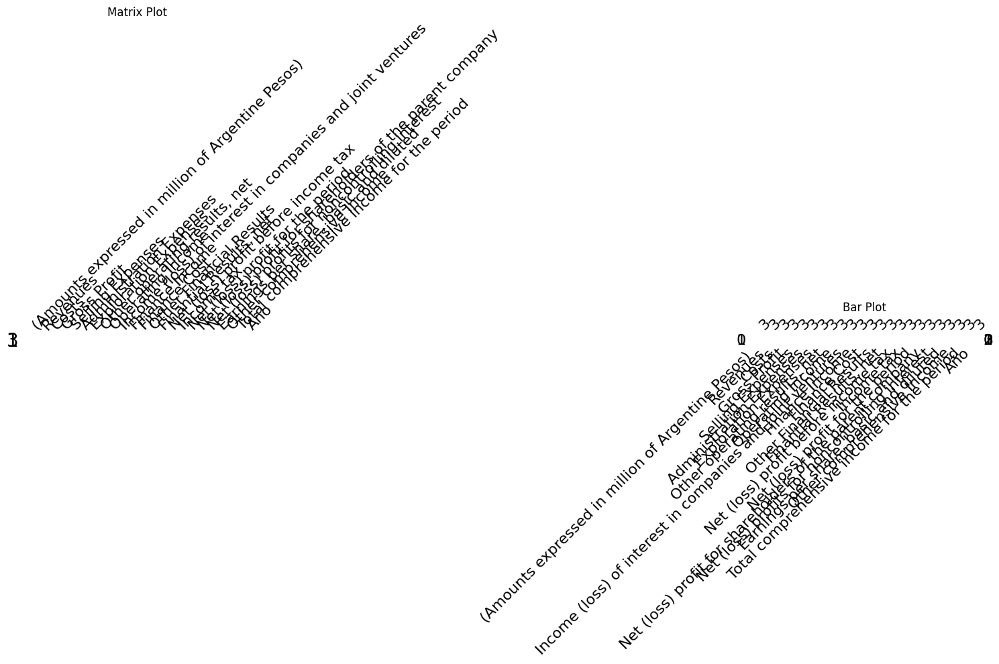

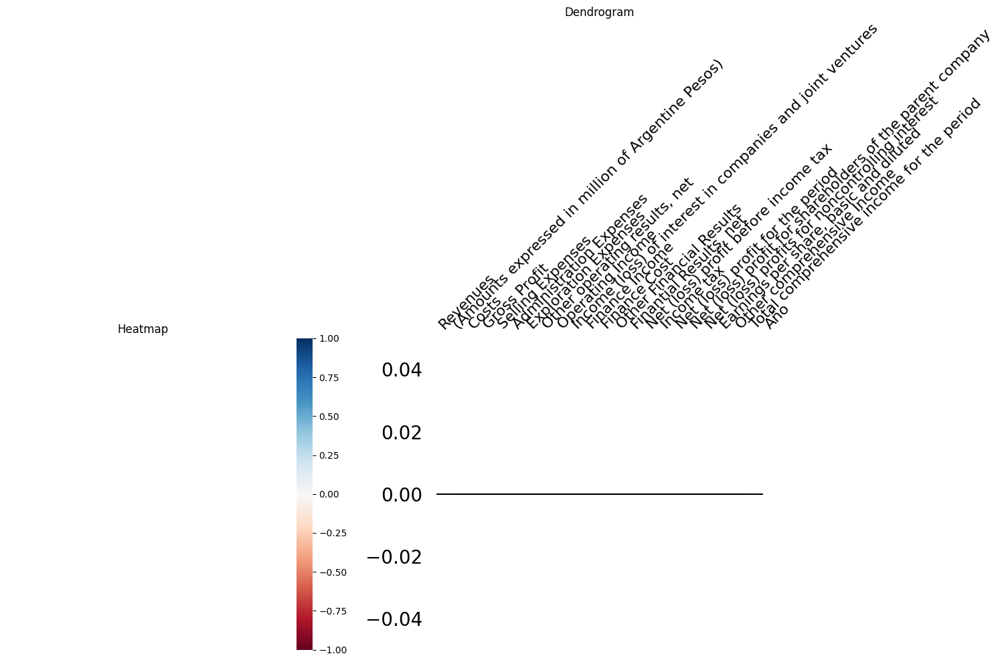

In [ ]:
r.visualizar_nulos(pyl)

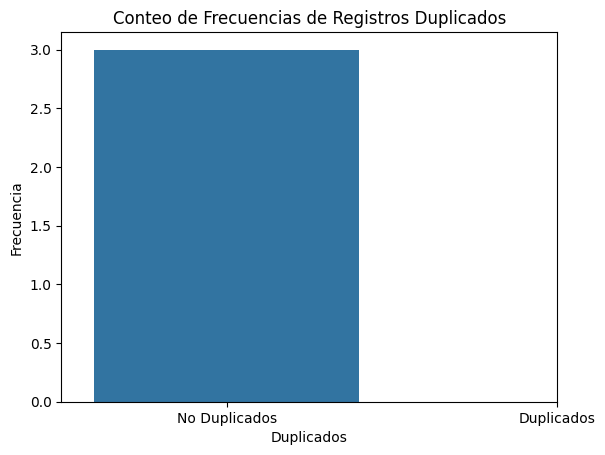

In [ ]:
r.hist_duplicados(pyl)

## Segment

### Informe general

In [ ]:
r.informe_dataframe(segment)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 6
Columnas: 19

--Numero de datos--
114

--Filas y Columnas--
Filas: muestra de indices-------> ['', '', '', '', '']  -----> Desde   Hasta 
Columnas: ['Q1 2020', 'Revenues', 'Revenues from intersegment sales', 'Revenues_1', 'Operating Income (loss)', 'Investments in companies', 'Depreciation of property, plant and equipment', 'Acquisitions of fixed assets', 'Assets', 'Q1 2019', 'Revenues_2', 'Revenues from intersegment sales_1', 'Revenues_3', 'Operating Income (loss)_1', 'Investments in companies_1', 'Depreciation of property, plant and equipment_1', 'Acquisitions of fixed assets_1', 'Assets_1', 'Año']

--Tipo de columnas--
Q1 2020                                             object
Revenues                                           float64
Revenues from intersegment sales                   float64
Revenues_1                                         float64
Operating Income (loss)                 

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(segment)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Q1 2020,[<class 'str'>],100.0,0.0,0
1,Revenues,[<class 'float'>],100.0,0.0,0
2,Revenues from intersegment sales,[<class 'float'>],100.0,0.0,0
3,Revenues_1,[<class 'float'>],100.0,0.0,0
4,Operating Income (loss),[<class 'float'>],100.0,0.0,0
5,Investments in companies,[<class 'float'>],100.0,0.0,0
6,"Depreciation of property, plant and equipment",[<class 'float'>],100.0,0.0,0
7,Acquisitions of fixed assets,[<class 'float'>],100.0,0.0,0
8,Assets,[<class 'float'>],100.0,0.0,0
9,Q1 2019,[<class 'str'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in segment:
  r.informe_columna(segment, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Q1 2020:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
6

--Valores unicos en la columna (Primeros 5 valores)--
['Upstream' 'Gas & Power' 'Downstream' 'Corporate and Other'
 'Consolidation Adjustments']

--Moda de la columna especificada--
Valor modal -----> Upstream
Frecuencia acumulada ------> 1

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Q1 2020
Upstream       1
Gas & Power    1
Downstream     1
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Revenues:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [   824.  27598. 143876.   4204.  -1832.]  -----> Desde 824.0  Hasta 174670.0

--Estadistico

### Gráficos

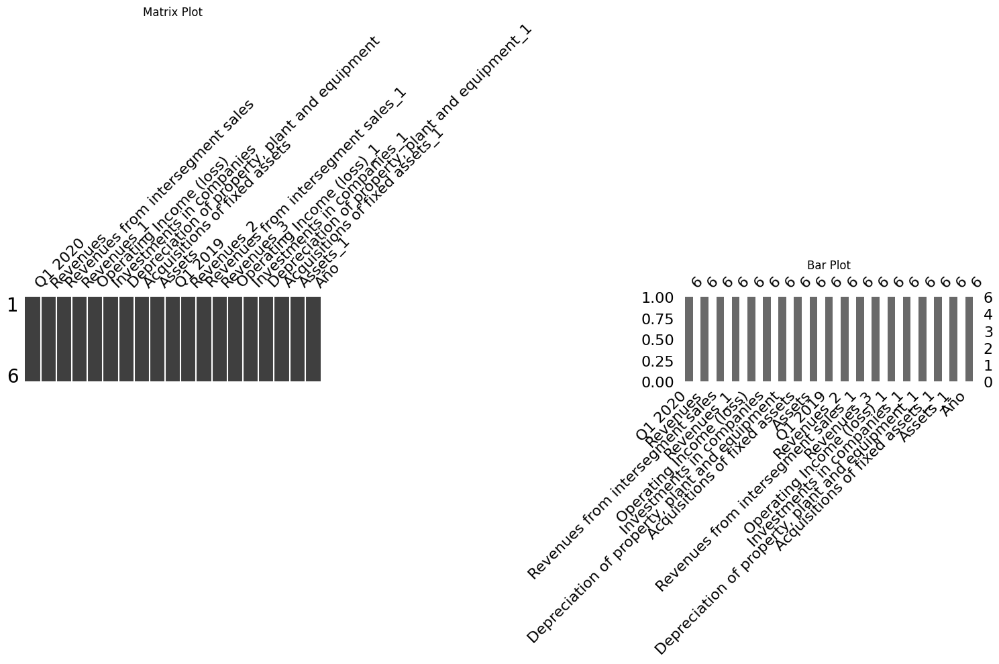

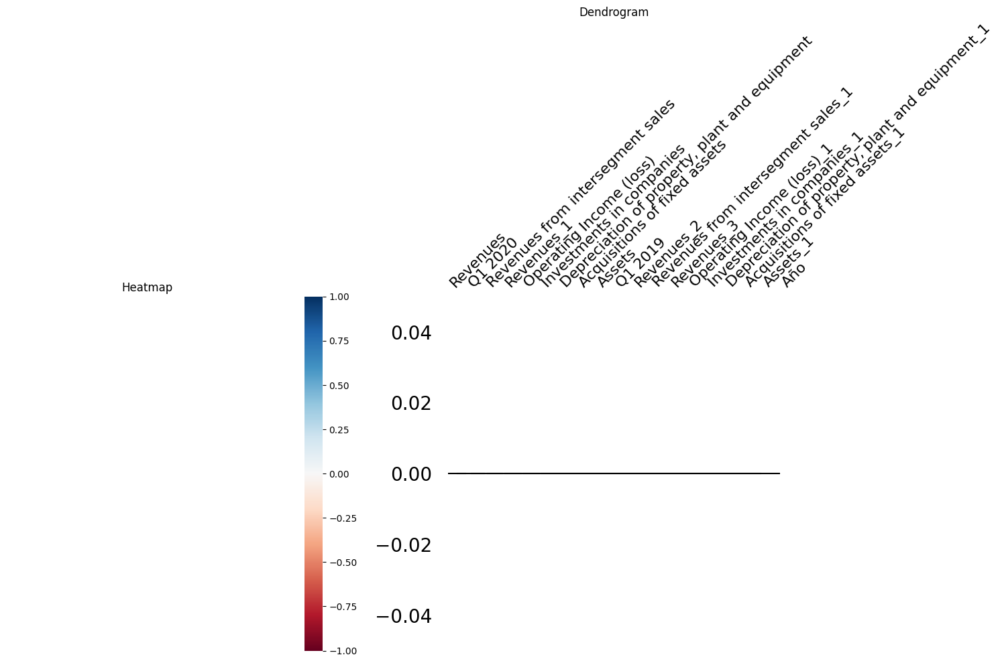

In [ ]:
r.visualizar_nulos(segment)

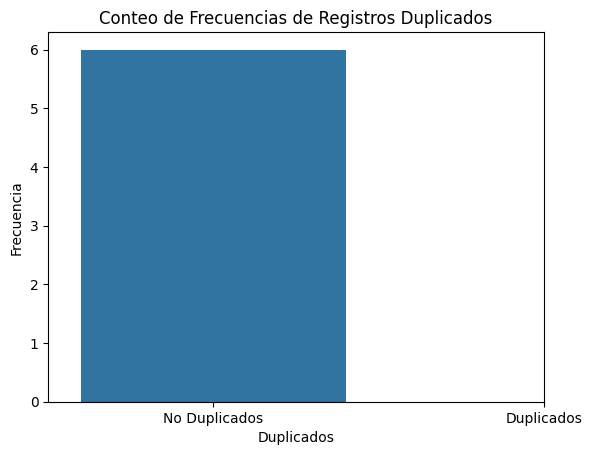

In [ ]:
r.hist_duplicados(segment)

## Volumes

### Informe general

In [ ]:
r.informe_dataframe(volumes)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 3
Columnas: 50

--Numero de datos--
150

--Filas y Columnas--
Filas: muestra de indices-------> ['1Q 2019', '4Q 2019', '1Q 2020']  -----> Desde 1Q 2019  Hasta 1Q 2020
Columnas: ['Production', 'Crude oil production', 'NGL production', 'Gas production', 'Total production', 'Brent ', 'Henry Hub ', 'Prices in domestic market', 'Crude oil\n', 'Average gas price', 'Gasoline', 'Diesel', 'Sales', 'Sales of refined products', 'Domestic market', 'Gasoline_1', 'Diesel_1', 'Jet fuel and kerosene', 'Fuel Oil', 'LPG', 'Others (*)', 'Total domestic market', 'Export market', 'Petrochemical naphtha', 'Jet fuel and kerosene_1', 'LPG_1', 'Bunker (Diesel and Fuel Oil)', 'Others (*)_1', 'Total export market', 'Total sales of refined products', 'Sales of petrochemical products', 'Domestic market_1', 'Fertilizers', 'Methanol', 'Others', 'Total domestic market_1', 'Export market_1', 'Methanol_1', 'Others_1', 'Total exp

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(volumes)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,Production,[<class 'str'>],100.0,0.0,0
1,Crude oil production,[<class 'float'>],100.0,0.0,0
2,NGL production,[<class 'float'>],100.0,0.0,0
3,Gas production,[<class 'float'>],100.0,0.0,0
4,Total production,[<class 'float'>],100.0,0.0,0
5,Brent,[<class 'float'>],100.0,0.0,0
6,Henry Hub,[<class 'float'>],100.0,0.0,0
7,Prices in domestic market,[<class 'str'>],100.0,0.0,0
8,Crude oil\n,[<class 'float'>],100.0,0.0,0
9,Average gas price,[<class 'float'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in volumes:
  r.informe_columna(volumes, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Production:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1

--Valores unicos en la columna--
['']

--Moda de la columna especificada--
Valor modal -----> 
Frecuencia acumulada ------> 3

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 Production
    3
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE Crude oil production:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [20376.29896666 20884.17926688 20487.63      ]  -----> Desde 20376.298966657894  Hasta 20487.63

--Estadisticos Principales de la columna--
Media: 20582.7
Desviacion Estandar: 266.95
Primer cuartil: 20431.96448332895
Mediana: 20487.63

### Gráficos

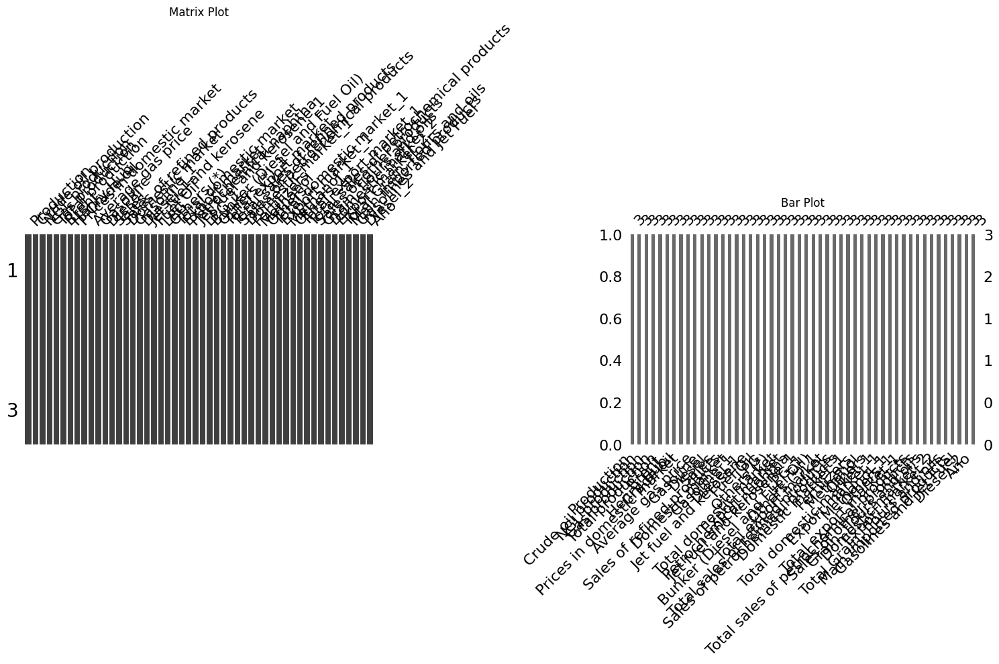

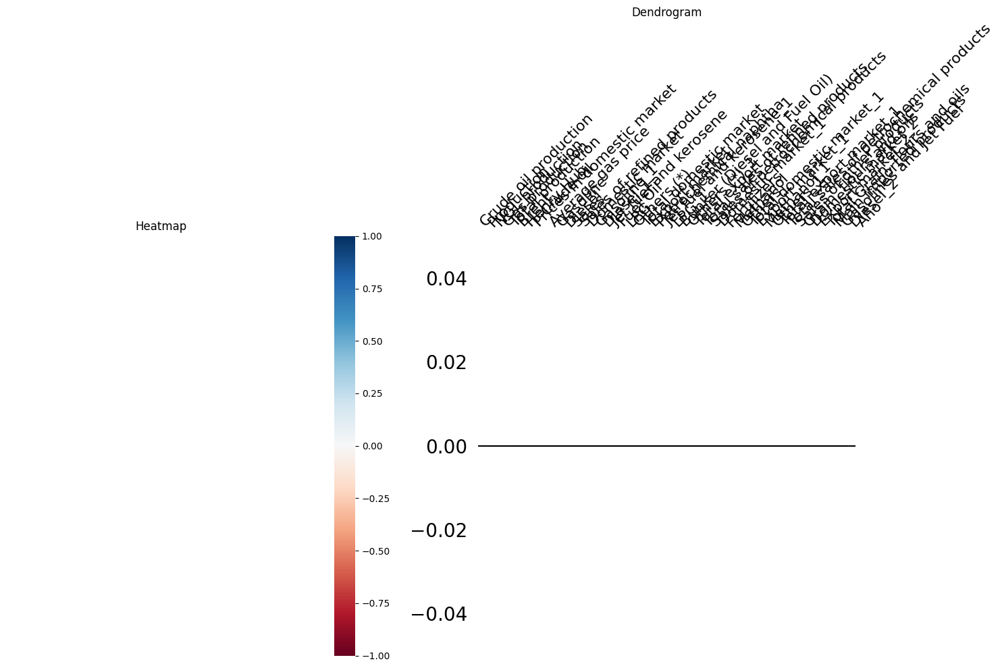

In [ ]:
r.visualizar_nulos(volumes)

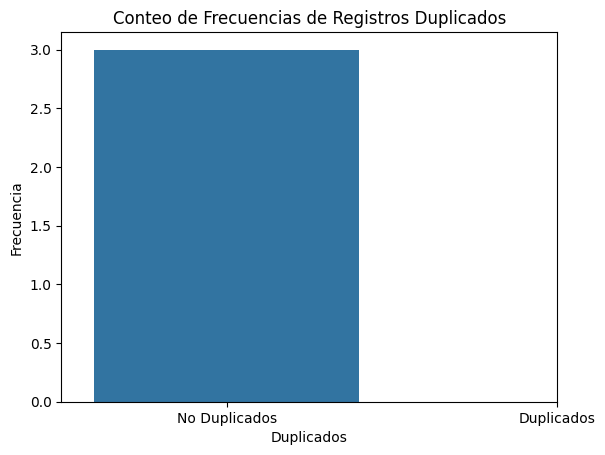

In [ ]:
r.hist_duplicados(volumes)

## Reservas 2023

### Informe general

In [ ]:
r.informe_dataframe(reservas)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 1256
Columnas: 13

--Numero de datos--
16328

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 1255
Columnas: ['OPERADOR', 'CUENCA', 'PROVINCIA', 'CONCESIÓN O PERMISO', 'YACIMIENTO', 'reserv_comp_pet_(Mm3)', 'reserv_comp_gas_(MMm3)', 'reserv_prob_pet_(Mm3)', 'reserv_prob_gas_(MMm3)', 'reserv_pos_pet_(Mm3)', 'reserv_pos_gas_(MMm3)', 'recur_cont_pet_(Mm3)', 'recur_cont_gas_(MMm3)']

--Tipo de columnas--
OPERADOR                   object
CUENCA                     object
PROVINCIA                  object
CONCESIÓN O PERMISO        object
YACIMIENTO                 object
reserv_comp_pet_(Mm3)     float64
reserv_comp_gas_(MMm3)    float64
reserv_prob_pet_(Mm3)     float64
reserv_prob_gas_(MMm3)    float64
reserv_pos_pet_(Mm3)      float64
reserv_pos_gas_(MMm3)     float64
recur_cont_pet_(Mm3)      float64
recur_cont_gas_(MMm3)     float64
dtype: object
--

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(reservas)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,OPERADOR,[<class 'str'>],100.0,0.0,0
1,CUENCA,[<class 'str'>],100.0,0.0,0
2,PROVINCIA,[<class 'str'>],100.0,0.0,0
3,CONCESIÓN O PERMISO,[<class 'str'>],100.0,0.0,0
4,YACIMIENTO,[<class 'str'>],100.0,0.0,0
5,reserv_comp_pet_(Mm3),[<class 'float'>],100.0,0.0,0
6,reserv_comp_gas_(MMm3),[<class 'float'>],100.0,0.0,0
7,reserv_prob_pet_(Mm3),[<class 'float'>],100.0,0.0,0
8,reserv_prob_gas_(MMm3),[<class 'float'>],100.0,0.0,0
9,reserv_pos_pet_(Mm3),[<class 'float'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in reservas:
  r.informe_columna(reservas, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE OPERADOR:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
48

--Valores unicos en la columna (Primeros 5 valores)--
['ALIANZA PETROLERA ARGENTINA S.A.' 'CAPETROL ARGENTINA S.A.'
 'CAPETROL S.A.' 'CAPEX S.A.' 'CGC ENERGIA SAU']

--Moda de la columna especificada--
Valor modal -----> YPF S.A.
Frecuencia acumulada ------> 409

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 OPERADOR
YPF S.A.                                 409
COMPAÑÍA GENERAL DE COMBUSTIBLES S.A.    167
PAN AMERICAN ENERGY SL                    95
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE CUENCA:

--Numero de datos nulos--
0

--Cantidad de valores 

### Gráficos

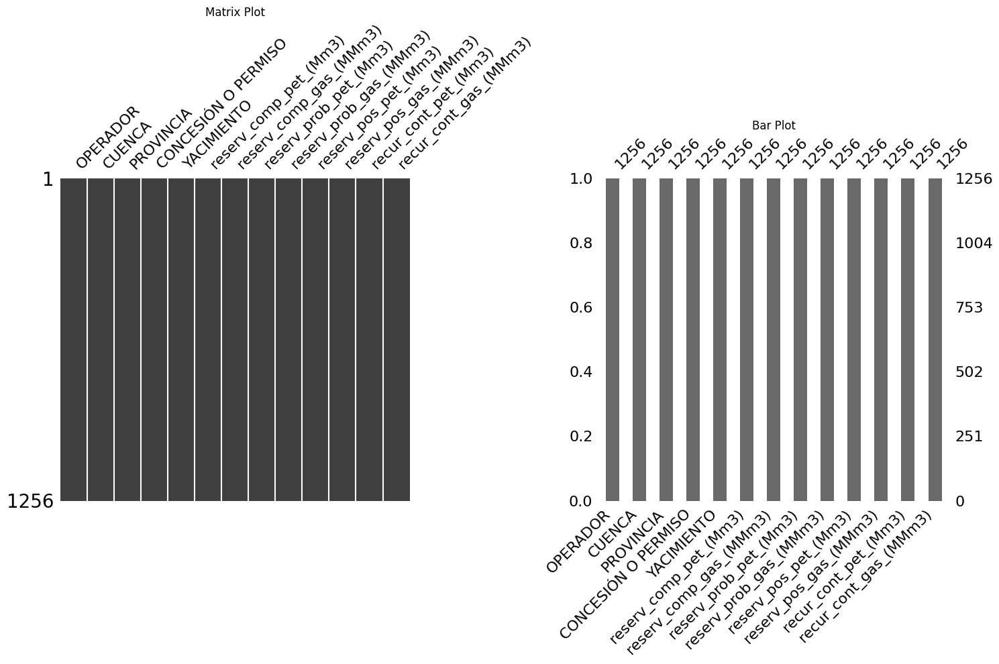

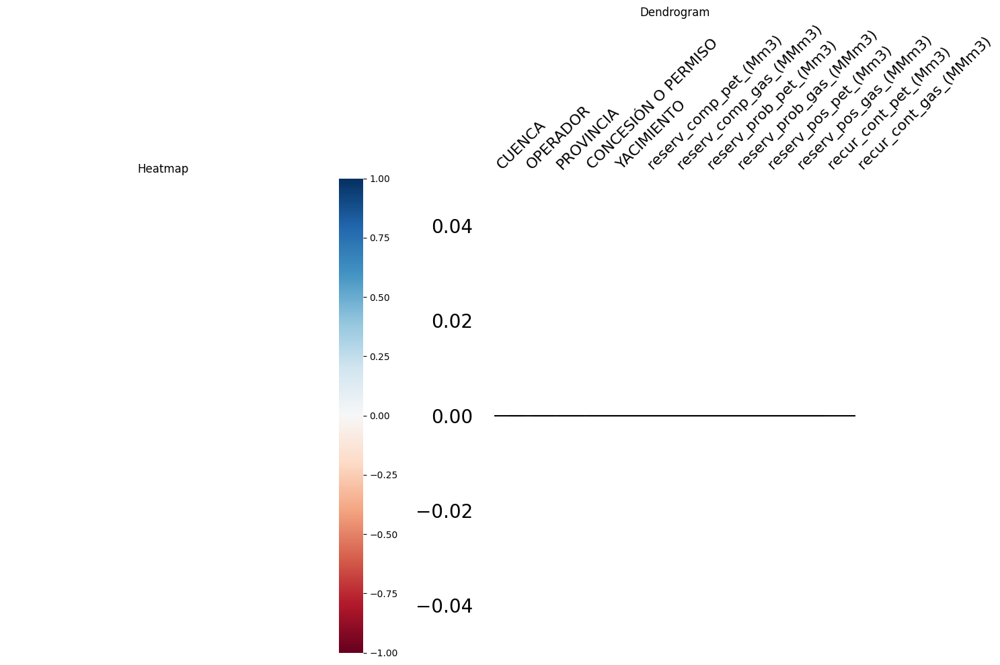

In [ ]:
r.visualizar_nulos(reservas)

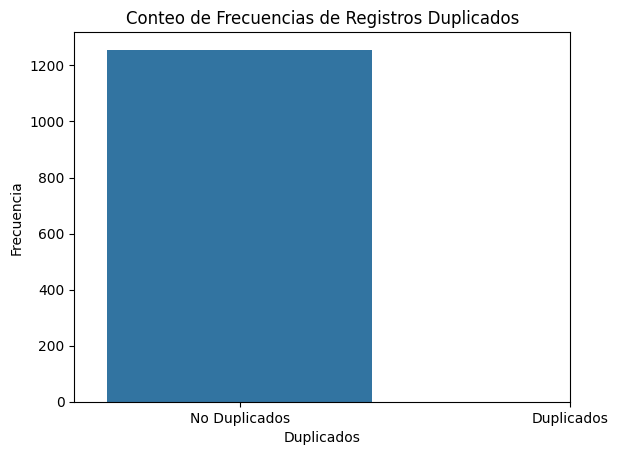

In [ ]:
r.hist_duplicados(reservas)

## World oil domestic consumption

### Informe general

In [ ]:
r.informe_dataframe(world_consum)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 60
Columnas: 36

--Numero de datos--
2160

--Filas y Columnas--
Filas: muestra de indices-------> ['World', 'OECD', 'G7', 'BRICS', 'Europe']  -----> Desde World  Hasta United Arab Emirates
Columnas: ['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2022 - 2023 (%) ', '2000 - 2023 (%/year) ']

--Tipo de columnas--
1990                     float64
1991                     float64
1992                     float64
1993                     float64
1994                     float64
1995                     float64
1996                     float64
1997                     float64
1998                     float64
1999                     float64
2000                     float64
2001  

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(world_consum)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,1990,[<class 'float'>],100.0,0.0,0
1,1991,[<class 'float'>],100.0,0.0,0
2,1992,[<class 'float'>],100.0,0.0,0
3,1993,[<class 'float'>],100.0,0.0,0
4,1994,[<class 'float'>],100.0,0.0,0
5,1995,[<class 'float'>],100.0,0.0,0
6,1996,[<class 'float'>],100.0,0.0,0
7,1997,[<class 'float'>],100.0,0.0,0
8,1998,[<class 'float'>],100.0,0.0,0
9,1999,[<class 'float'>],100.0,0.0,0


### Informe particular

In [ ]:
for columna in world_consum:
  r.informe_columna(world_consum, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 1990:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [3043.74186665 1809.64517427 1388.41598547  438.18025922  649.537072  ]  -----> Desde 3043.7418666541  Hasta 5.456

--Estadisticos Principales de la columna--
Media: 225.67
Desviacion Estandar: 507.95
Primer cuartil: 12.18661299212625
Mediana: 34.233088410693
Tercer cuartil: 123.1306889635625

--Valores extremos--
Valor maximo: 3043.7418666541
Valor minimo: 2.679

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 1990
3043.741867    1
1809.645174    1
56.798674      1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 3043.7418666541
Minimo: 2.679

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEAT

### Gráficos

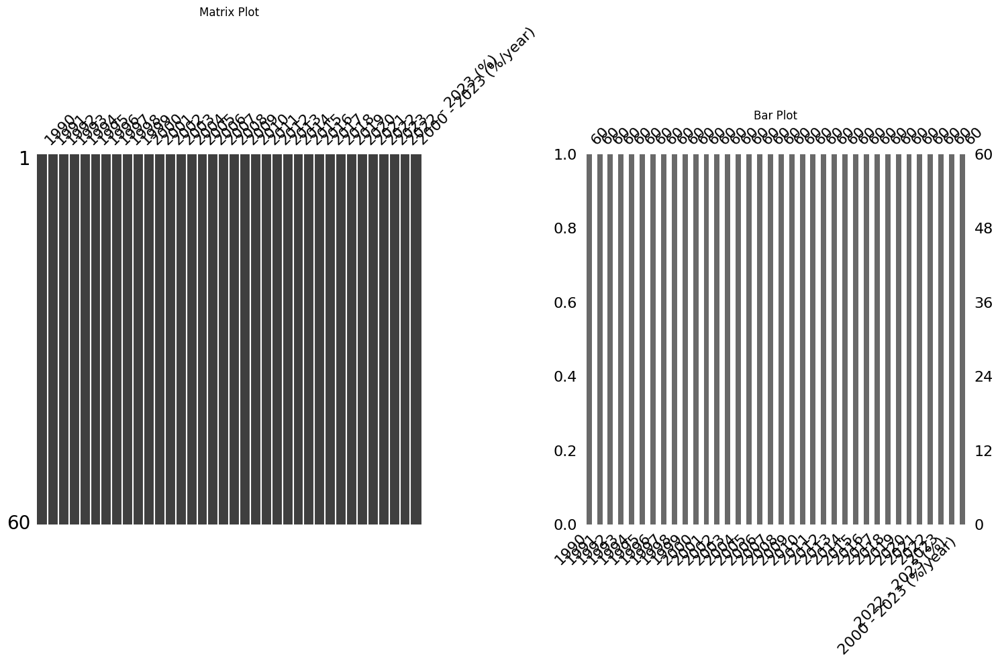

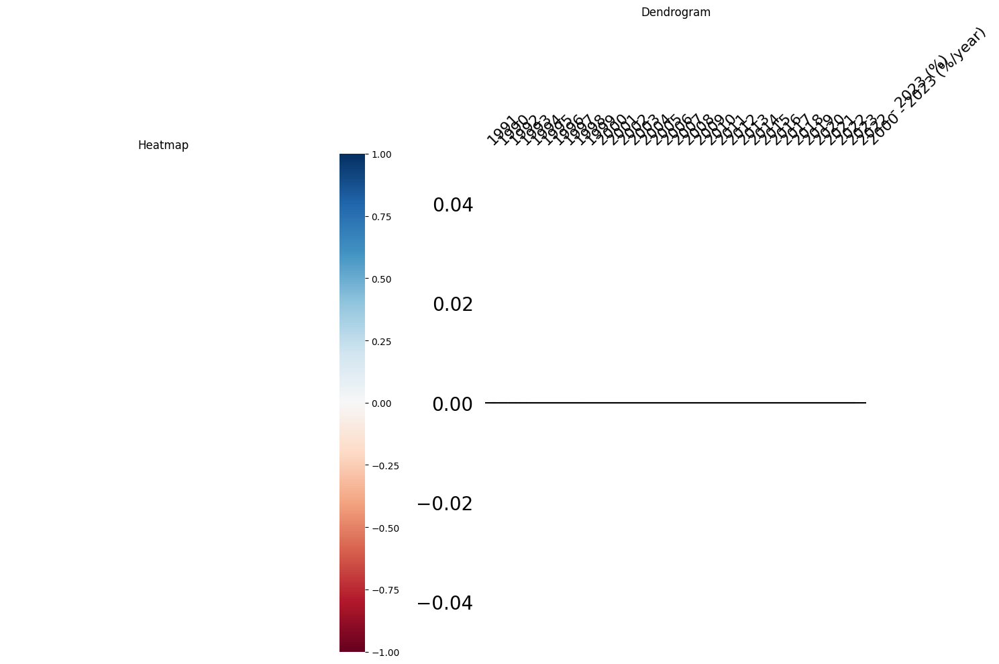

In [ ]:
r.visualizar_nulos(world_consum)

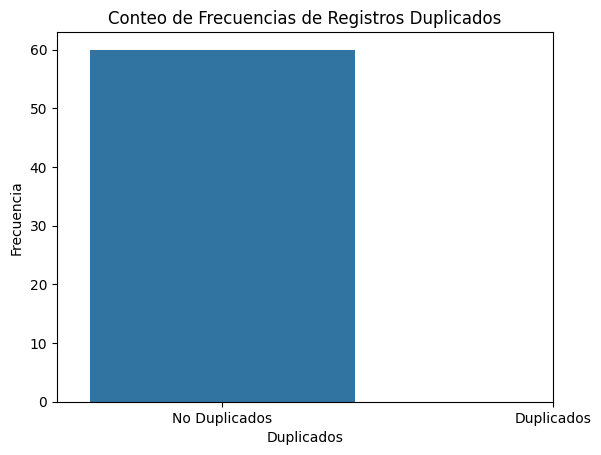

In [ ]:
r.hist_duplicados(world_consum)

## World Production

### Informe general

In [ ]:
r.informe_dataframe(world_prod)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 60
Columnas: 36

--Numero de datos--
2121

--Filas y Columnas--
Filas: muestra de indices-------> ['World', 'OECD', 'G7', 'BRICS', 'Europe']  -----> Desde World  Hasta United Arab Emirates
Columnas: ['1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2022 - 2023 (%) ', '2000 - 2023 (%/year) ']

--Tipo de columnas--
1990                     float64
1991                     float64
1992                     float64
1993                     float64
1994                     float64
1995                     float64
1996                     float64
1997                     float64
1998                     float64
1999                     float64
2000                     float64
2001  

'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(world_prod)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,1990,[<class 'float'>],98.33,1.67,1
1,1991,[<class 'float'>],98.33,1.67,1
2,1992,[<class 'float'>],98.33,1.67,1
3,1993,[<class 'float'>],98.33,1.67,1
4,1994,[<class 'float'>],98.33,1.67,1
5,1995,[<class 'float'>],98.33,1.67,1
6,1996,[<class 'float'>],98.33,1.67,1
7,1997,[<class 'float'>],98.33,1.67,1
8,1998,[<class 'float'>],98.33,1.67,1
9,1999,[<class 'float'>],98.33,1.67,1


### Informe particular

In [ ]:
for columna in world_prod:
  r.informe_columna(world_prod, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 1990:

--Numero de datos nulos--
1

--Valores unicos en la columna--
Ej: [3193.32056145  921.192       614.936       729.221       220.89      ]  -----> Desde 3193.3205614541  Hasta 106.245

--Estadisticos Principales de la columna--
Media: 207.89
Desviacion Estandar: 465.98
Primer cuartil: 3.556
Mediana: 34.534
Tercer cuartil: 188.418

--Valores extremos--
Valor maximo: 3193.3205614541
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 1990
0.000000       4
3193.320561    1
2.707000       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 3193.3205614541
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 1991:

--Numero de datos nulo

### Gráficos

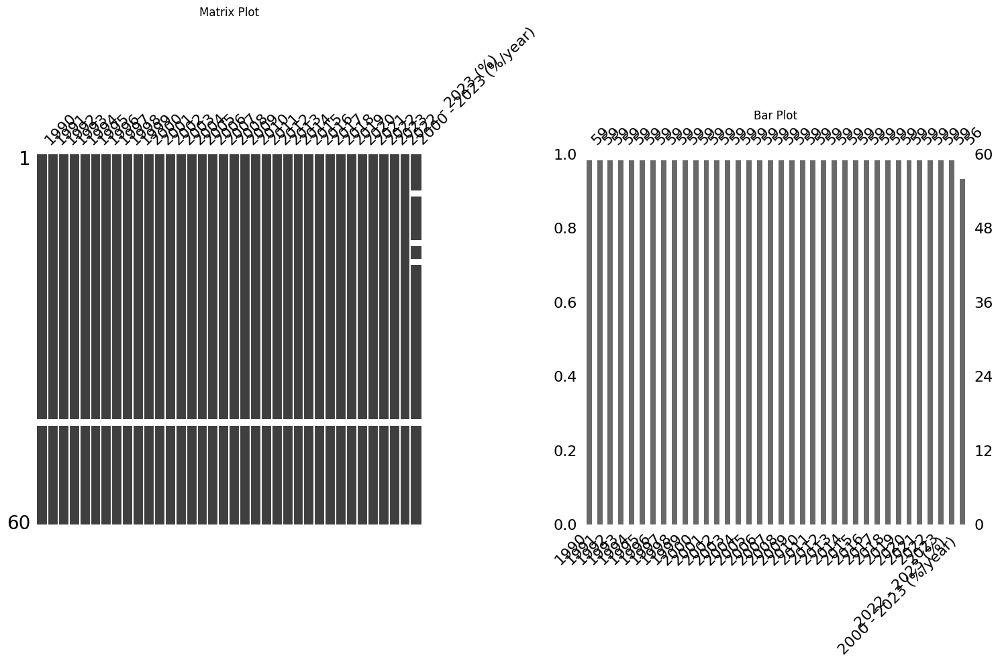

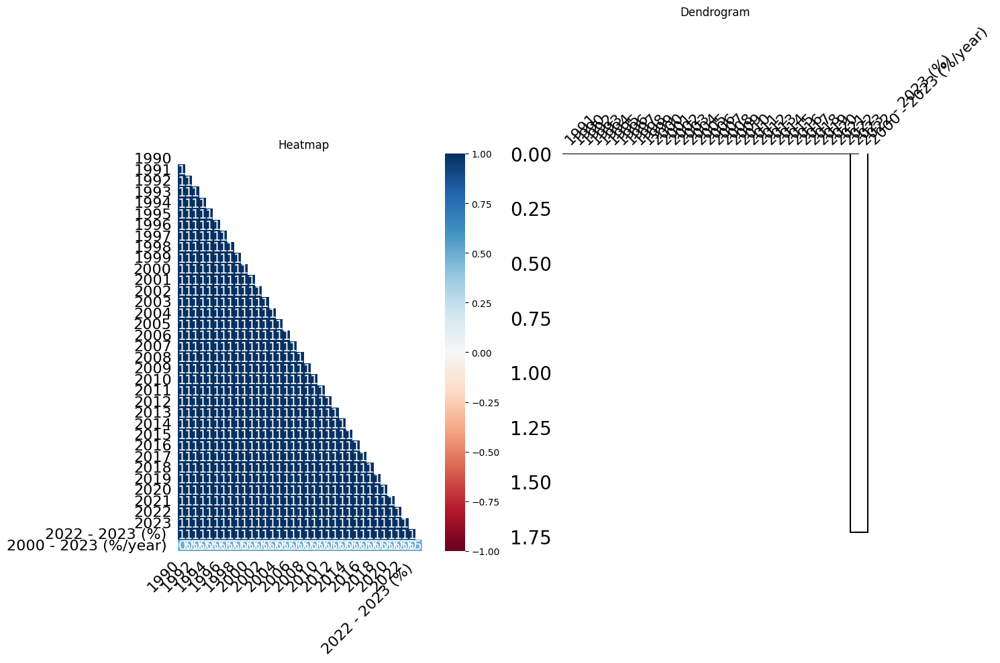

In [ ]:
r.visualizar_nulos(world_prod)

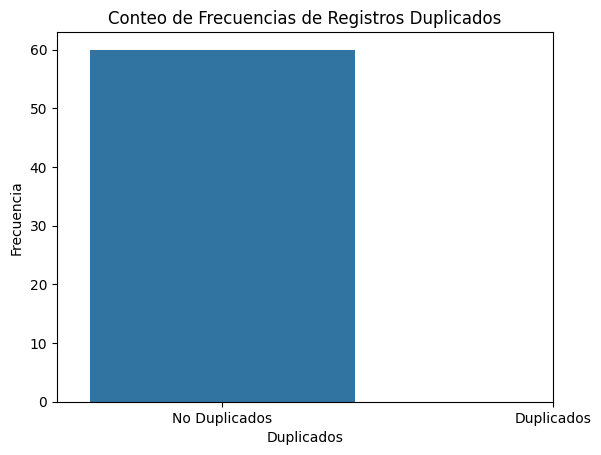

In [ ]:
r.hist_duplicados(world_prod)

## Ratios empresas (incluida YPF)



### ENAP

#### Informe general

In [ ]:
r.informe_dataframe(ENAP_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 2

--Numero de datos--
29

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2023, 2022]

--Tipo de columnas--
2023    float64
2022    float64
dtype: object
--Cantidad de registros duplicados--
4



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(ENAP_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2023,[<class 'float'>],83.33,16.67,3
1,2022,[<class 'float'>],77.78,22.22,4


#### Informe particular

In [ ]:
for columna in ENAP_ratios:
  r.informe_columna(ENAP_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2023:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [7.47810083e-01 2.96526559e+00 0.00000000e+00            nan
 2.02300000e+03]  -----> Desde 0.7478100827179522  Hasta 0.16850961116718177

--Estadisticos Principales de la columna--
Media: 405.73
Desviacion Estandar: 837.02
Primer cuartil: 0.12400781661007504
Mediana: 0.9243600173229088
Tercer cuartil: 5.574804992821493

--Valores extremos--
Valor maximo: 2023.0
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2023
2023.00000    3
0.00000       2
0.74781       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2023.0
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/F

#### Gráficos

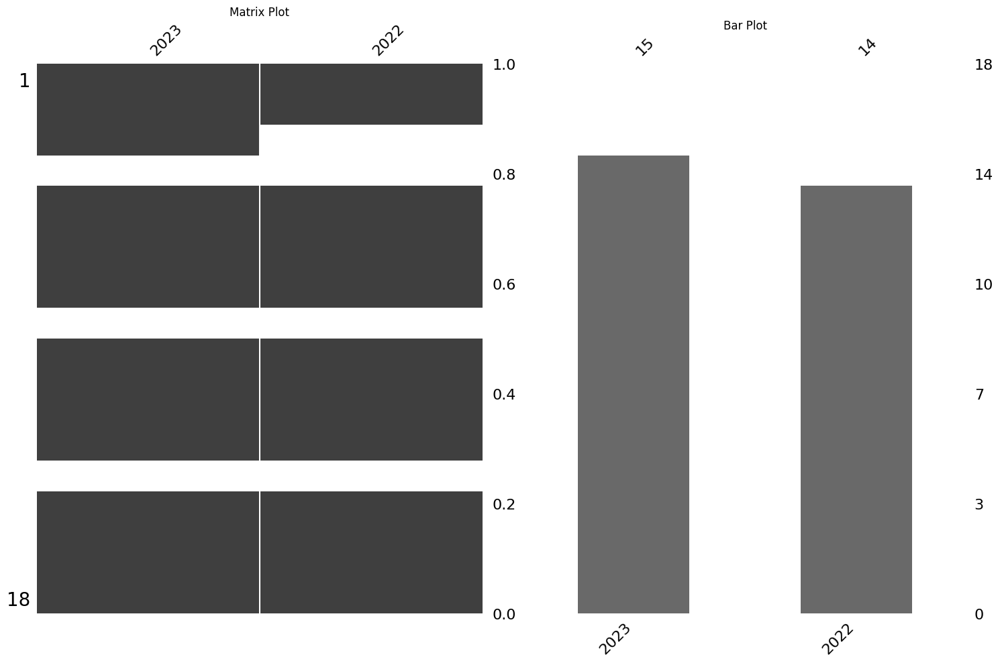

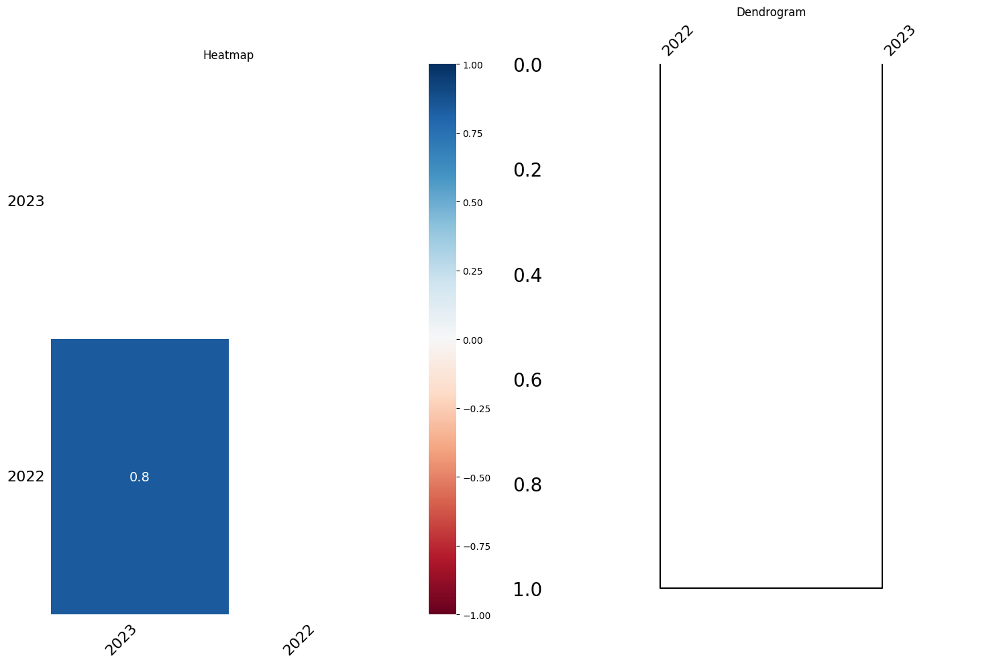

In [ ]:
r.visualizar_nulos(ENAP_ratios)

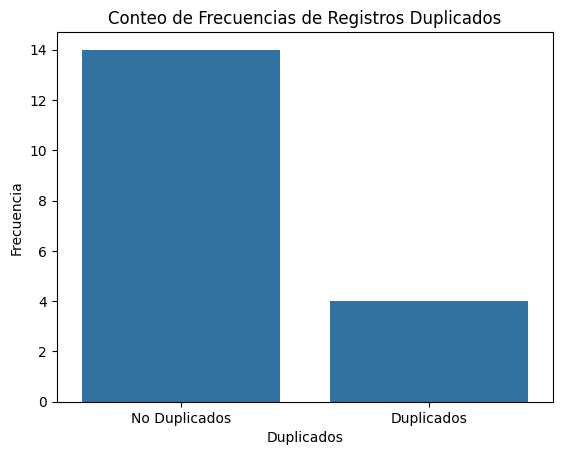

In [ ]:
r.hist_duplicados(ENAP_ratios)

### ECOPETROL

#### Informe general

In [ ]:
r.informe_dataframe(ecopetrol_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 2

--Numero de datos--
30

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2023, 2022]

--Tipo de columnas--
2023    float64
2022    float64
dtype: object
--Cantidad de registros duplicados--
4



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(ecopetrol_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2023,[<class 'float'>],83.33,16.67,3
1,2022,[<class 'float'>],83.33,16.67,3


#### Informe particular

In [ ]:
for columna in ecopetrol_ratios:
  r.informe_columna(ecopetrol_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2023:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [5.97411159e-01 2.34995649e+00 1.74327071e+00            nan
 2.02300000e+03]  -----> Desde 0.5974111587643165  Hasta 0.3258939957753964

--Estadisticos Principales de la columna--
Media: 405.0
Desviacion Estandar: 837.4
Primer cuartil: 0.065548171226264
Mediana: 0.5974111587643165
Tercer cuartil: 2.0466136008716456

--Valores extremos--
Valor maximo: 2023.0
Valor minimo: -2.268267576565938

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2023
2023.000000    3
0.597411       1
2.349956       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2023.0
Minimo: -2.268267576565938

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME 

#### Gráficos

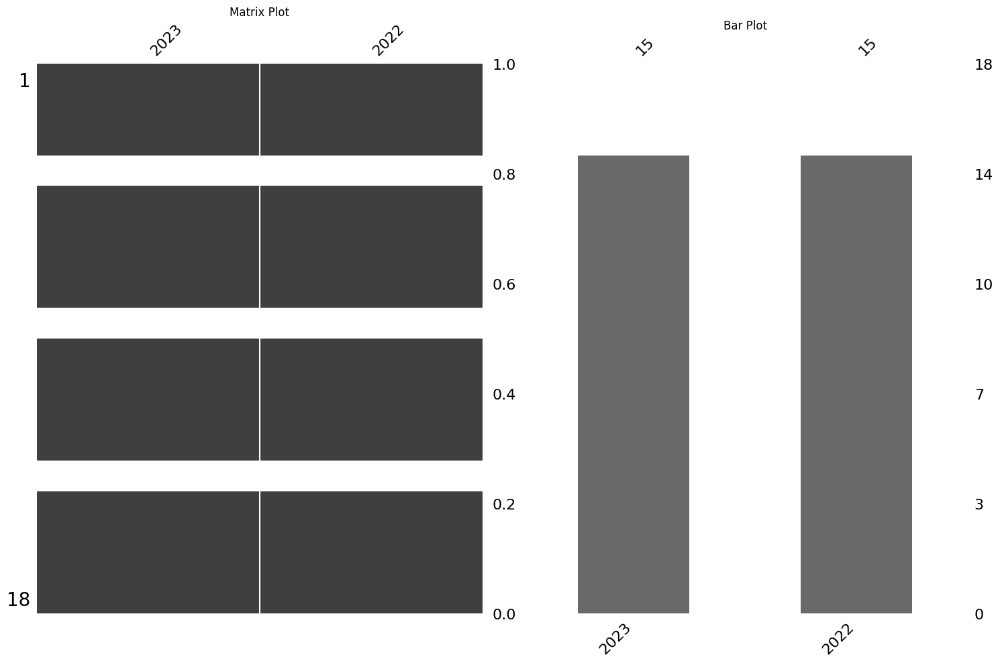

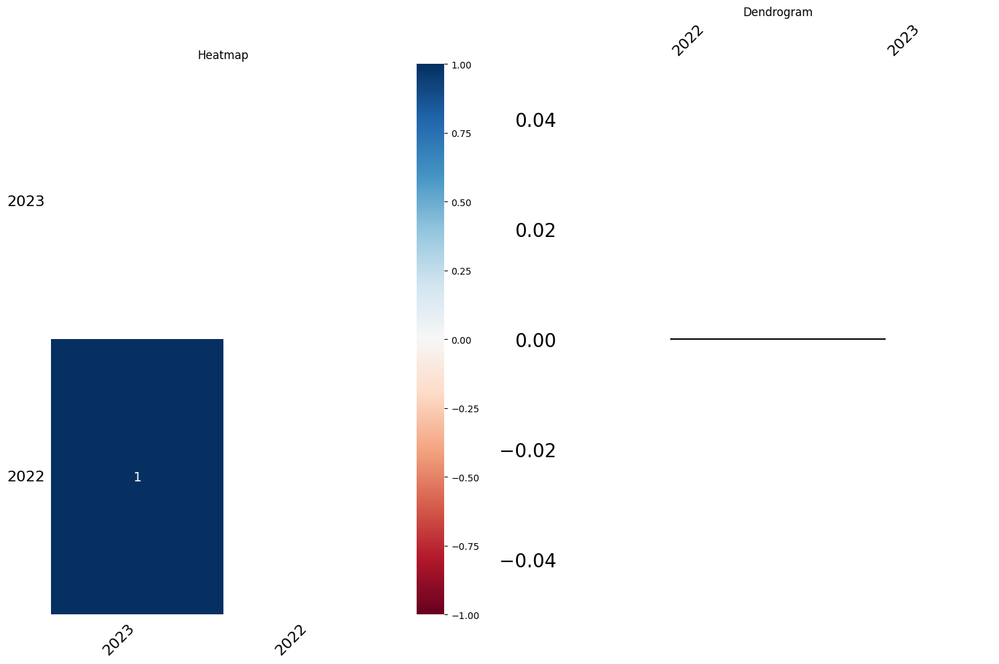

In [ ]:
r.visualizar_nulos(ecopetrol_ratios)

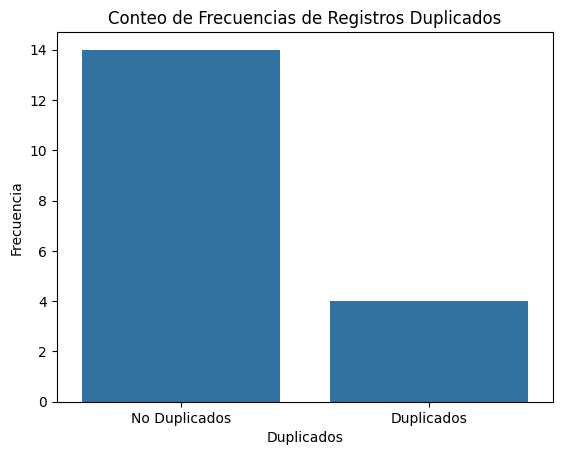

In [ ]:
r.hist_duplicados(ecopetrol_ratios)

### Gran Tierra Energy

#### Informe general

In [ ]:
r.informe_dataframe(gran_tierra_energy_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 2

--Numero de datos--
30

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2023, 2022]

--Tipo de columnas--
2023    float64
2022    float64
dtype: object
--Cantidad de registros duplicados--
5



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(gran_tierra_energy_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2023,[<class 'float'>],83.33,16.67,3
1,2022,[<class 'float'>],83.33,16.67,3


#### Informe particular

In [ ]:
for columna in gran_tierra_energy_ratios:
  r.informe_columna(gran_tierra_energy_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2023:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [7.20474041e-01 2.57748527e+00 1.41873932e+00            nan
 2.02300000e+03]  -----> Desde 0.7204740411149378  Hasta 0.4913083967096073

--Estadisticos Principales de la columna--
Media: 405.23
Desviacion Estandar: 837.27
Primer cuartil: -2.7809271183177528e-05
Mediana: 1.0802809250349215
Tercer cuartil: 2.3132694784579213

--Valores extremos--
Valor maximo: 2023.0
Valor minimo: -0.0004949866734357152

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2023
 2023.000000    3
-0.000056       2
 0.720474       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2023.0
Minimo: -0.0004949866734357152

------------------------------------------------------------------------------------------------------------------------
--------------------------------------------------------------------------------------------------------------

#### Gráficos

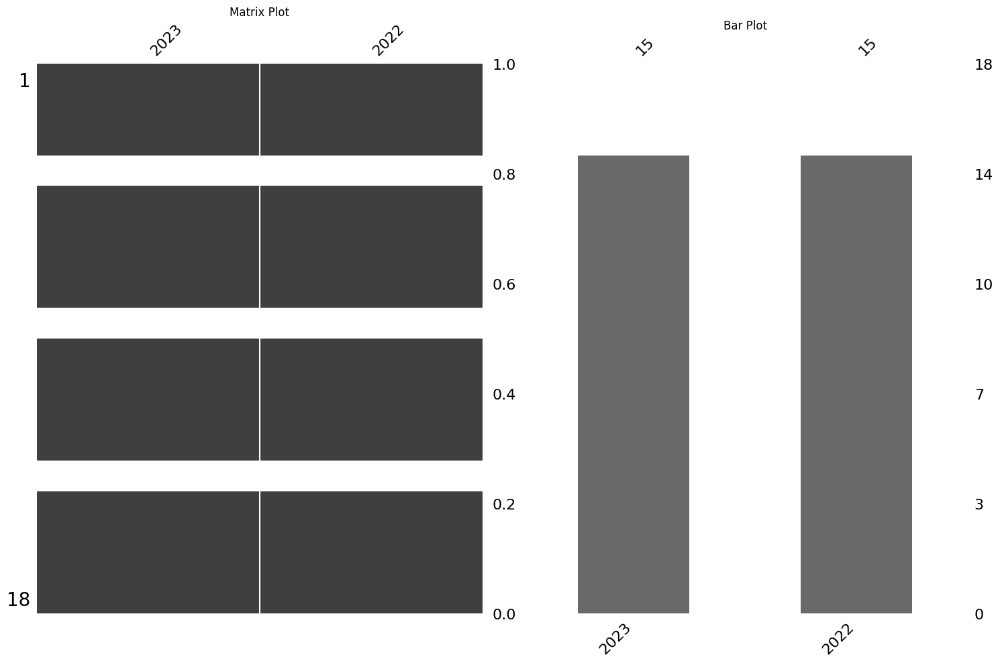

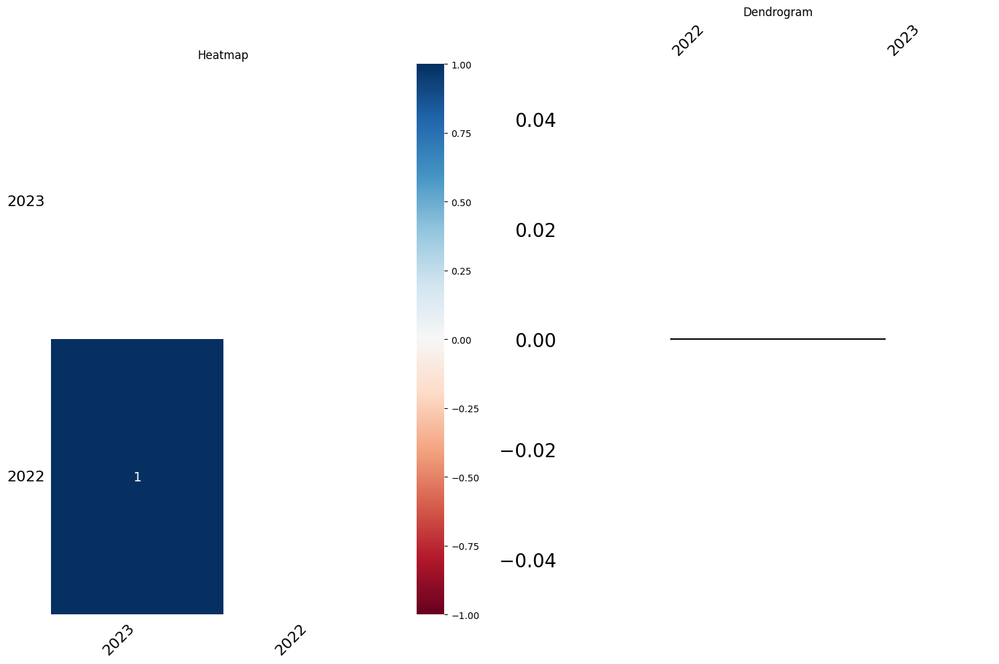

In [ ]:
r.visualizar_nulos(gran_tierra_energy_ratios)

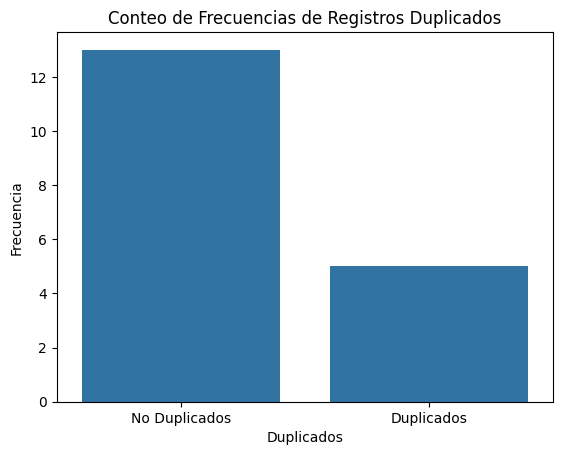

In [ ]:
r.hist_duplicados(gran_tierra_energy_ratios)

### Petrobras Br

#### Informe general

In [ ]:
r.informe_dataframe(petrobras_br_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 4

--Numero de datos--
57

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2023, 2022, 2021, 2020]

--Tipo de columnas--
2023    float64
2022    float64
2021    float64
2020    float64
dtype: object
--Cantidad de registros duplicados--
5



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(petrobras_br_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2023,[<class 'float'>],83.33,16.67,3
1,2022,[<class 'float'>],77.78,22.22,4
2,2021,[<class 'float'>],77.78,22.22,4
3,2020,[<class 'float'>],77.78,22.22,4


#### Informe particular

In [ ]:
for columna in petrobras_br_ratios:
  r.informe_columna(petrobras_br_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2023:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [3.71628537e-01 4.99503216e-01 4.30881997e-01            nan
 2.02300000e+03]  -----> Desde 0.3716285373111697  Hasta 0.36121566987313536

--Estadisticos Principales de la columna--
Media: 405.26
Desviacion Estandar: 837.26
Primer cuartil: 0.2543392766970114
Mediana: 0.43088199737856786
Tercer cuartil: 3.470351995410855

--Valores extremos--
Valor maximo: 2023.0
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2023
2023.000000    3
0.105788       2
0.371629       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2023.0
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMN

#### Gráficos

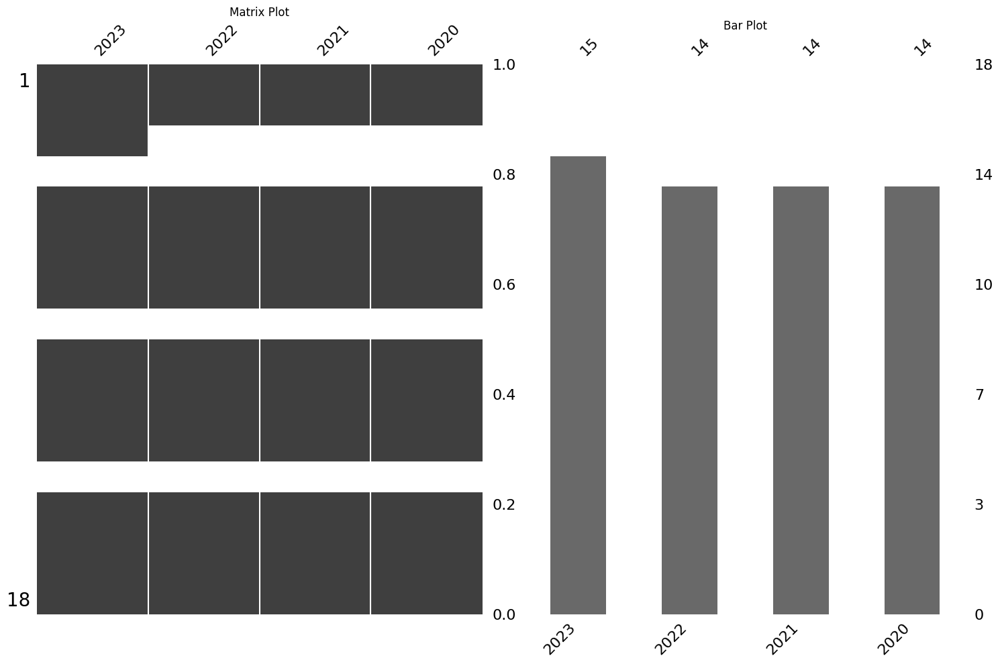

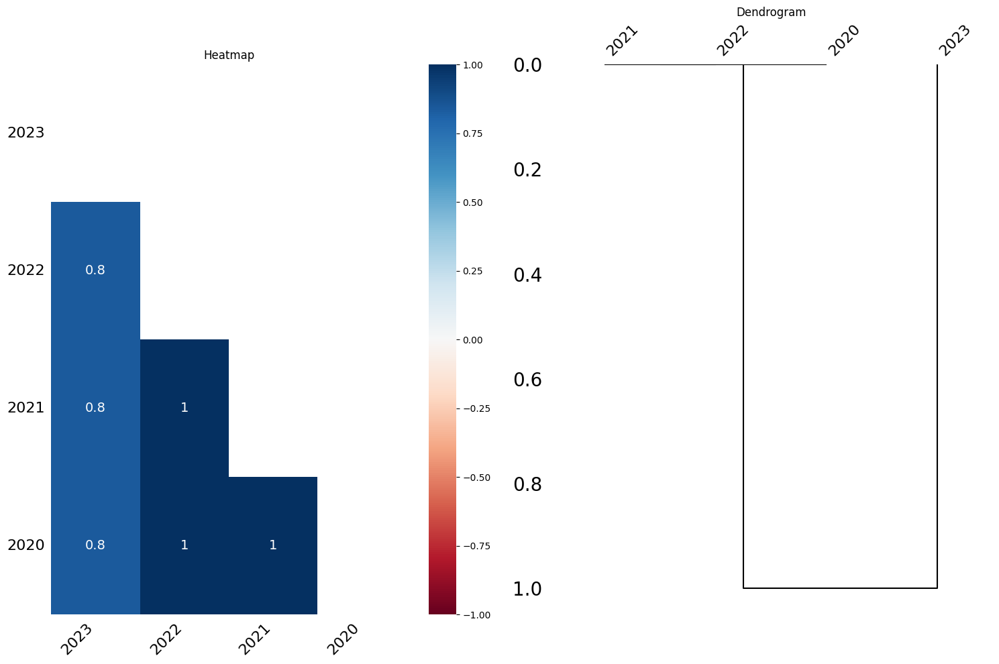

In [ ]:
r.visualizar_nulos(petrobras_br_ratios)

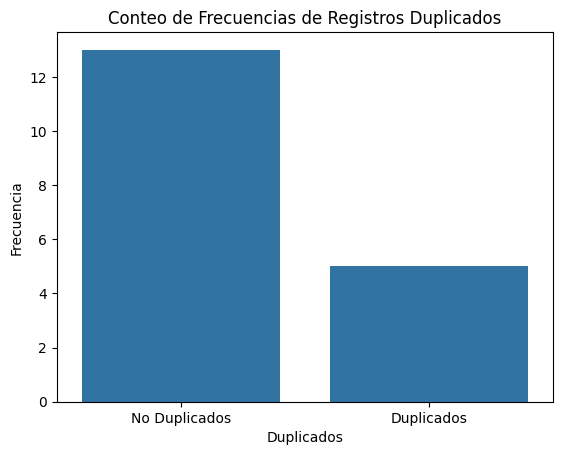

In [ ]:
r.hist_duplicados(petrobras_br_ratios)

### Repsol

#### Informe general

In [ ]:
r.informe_dataframe(repsol_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 2

--Numero de datos--
30

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2023, 2022]

--Tipo de columnas--
2023    float64
2022    float64
dtype: object
--Cantidad de registros duplicados--
4



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(repsol_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2023,[<class 'float'>],83.33,16.67,3
1,2022,[<class 'float'>],83.33,16.67,3


#### Informe particular

In [ ]:
for columna in repsol_ratios:
  r.informe_columna(repsol_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2023:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [5.28337092e-01 1.12015824e+00 3.56037152e-01            nan
 2.02300000e+03]  -----> Desde 0.5283370921421966  Hasta 0.27123431649477764

--Estadisticos Principales de la columna--
Media: 405.42
Desviacion Estandar: 837.18
Primer cuartil: 0.19010632233407612
Mediana: 0.6483466706930394
Tercer cuartil: 4.008253675646298

--Valores extremos--
Valor maximo: 2023.0
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2023
2023.000000    3
0.528337       1
1.120158       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2023.0
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMN

#### Gráficos

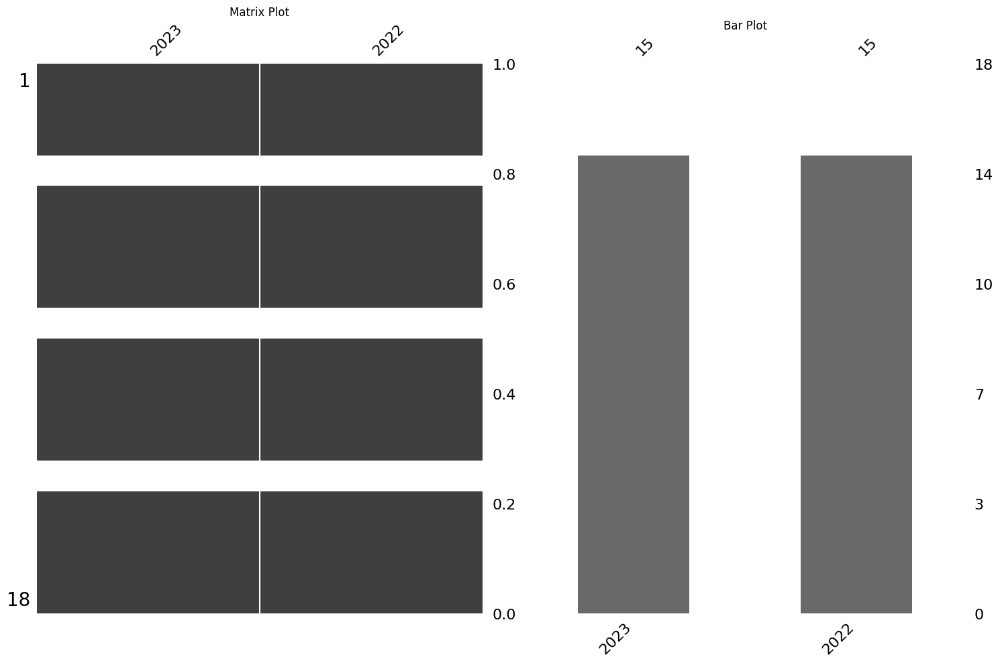

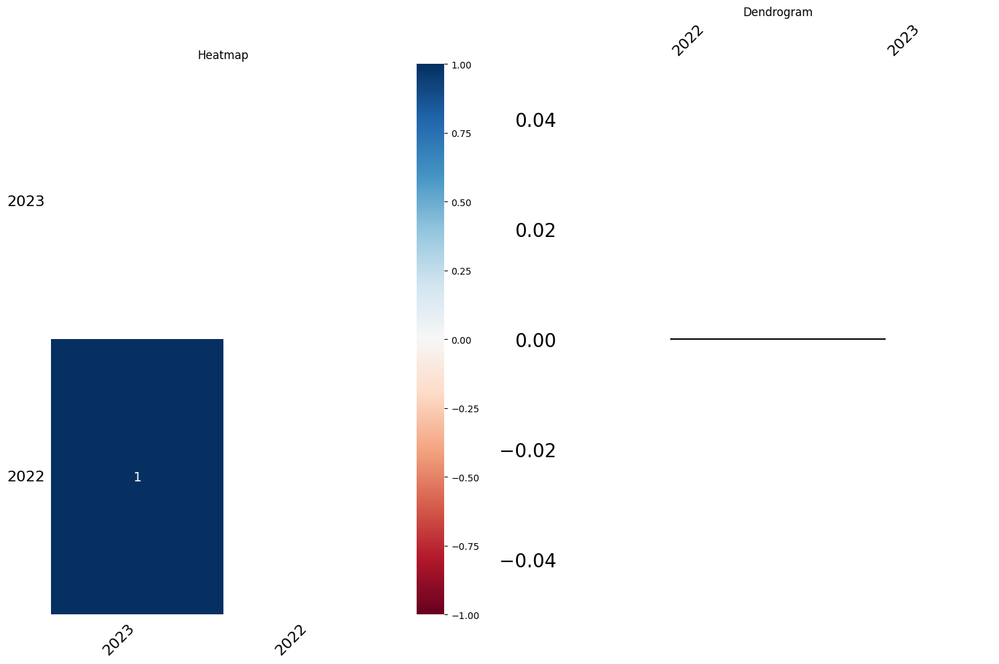

In [ ]:
r.visualizar_nulos(repsol_ratios)

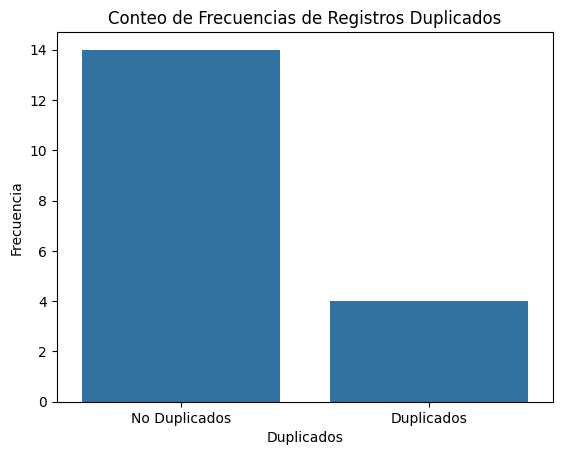

In [ ]:
r.hist_duplicados(repsol_ratios)

### TGC

#### Informe general

In [ ]:
r.informe_dataframe(TGC_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 2

--Numero de datos--
30

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2024, 2023]

--Tipo de columnas--
2024    float64
2023    float64
dtype: object
--Cantidad de registros duplicados--
4



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(TGC_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2024,[<class 'float'>],83.33,16.67,3
1,2023,[<class 'float'>],83.33,16.67,3


#### Informe particular

In [ ]:
for columna in TGC_ratios:
  r.informe_columna(TGC_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2024:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [3.71456810e-01 5.90980565e-01 3.05592461e-01            nan
 2.02300000e+03]  -----> Desde 0.37145680966453626  Hasta 0.18975312626472202

--Estadisticos Principales de la columna--
Media: 405.32
Desviacion Estandar: 837.23
Primer cuartil: 0.10173886612662045
Mediana: 0.37145680966453626
Tercer cuartil: 3.072929961673739

--Valores extremos--
Valor maximo: 2023.0
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2024
2023.000000    3
0.371457       1
0.590981       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2023.0
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLU

#### Gráficos

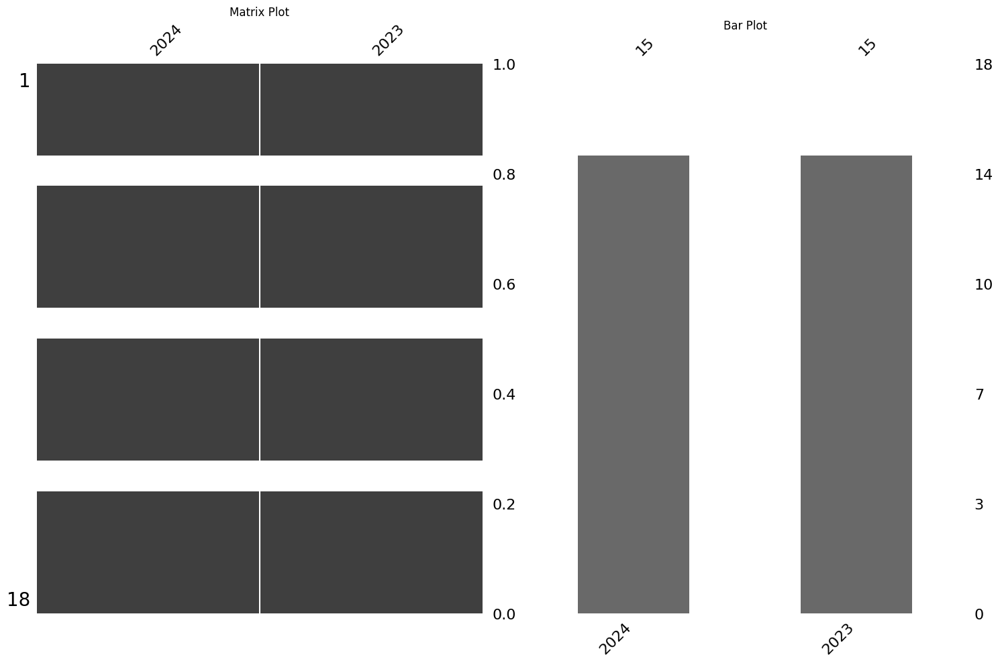

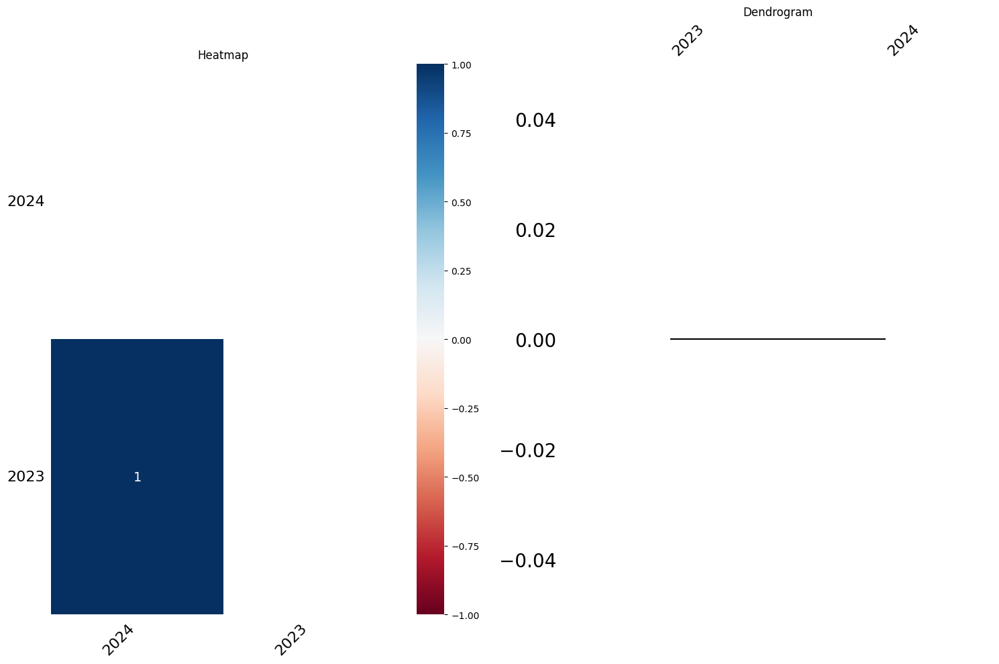

In [ ]:
r.visualizar_nulos(TGC_ratios)

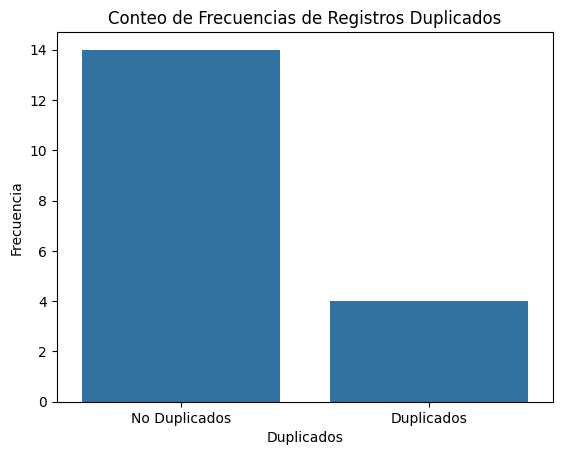

In [ ]:
r.hist_duplicados(TGC_ratios)

### Tecpetrol

#### Informe general

In [ ]:
r.informe_dataframe(tecpetrol_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 5

--Numero de datos--
74

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2024, 2023, 2022, 2021, 2020]

--Tipo de columnas--
2024    float64
2023    float64
2022    float64
2021    float64
2020    float64
dtype: object
--Cantidad de registros duplicados--
7



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [ ]:
r.verificar_tipo_datos(tecpetrol_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2024,[<class 'float'>],83.33,16.67,3
1,2023,[<class 'float'>],83.33,16.67,3
2,2022,[<class 'float'>],83.33,16.67,3
3,2021,[<class 'float'>],83.33,16.67,3
4,2020,[<class 'float'>],77.78,22.22,4


#### Informe particular

In [ ]:
for columna in tecpetrol_ratios:
  r.informe_columna(tecpetrol_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2024:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [4.93589899e-01 9.74684148e-01 3.92172200e-01            nan
 2.02400000e+03]  -----> Desde 0.4935898985010142  Hasta 0.7601252161226447

--Estadisticos Principales de la columna--
Media: 405.37
Desviacion Estandar: 837.72
Primer cuartil: 0.26320519713270296
Mediana: 0.7601252161226447
Tercer cuartil: 2.217202430624212

--Valores extremos--
Valor maximo: 2024.0
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2024
2024.000000    3
0.176963       3
0.760125       3
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2024.0
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA

#### Gráficos

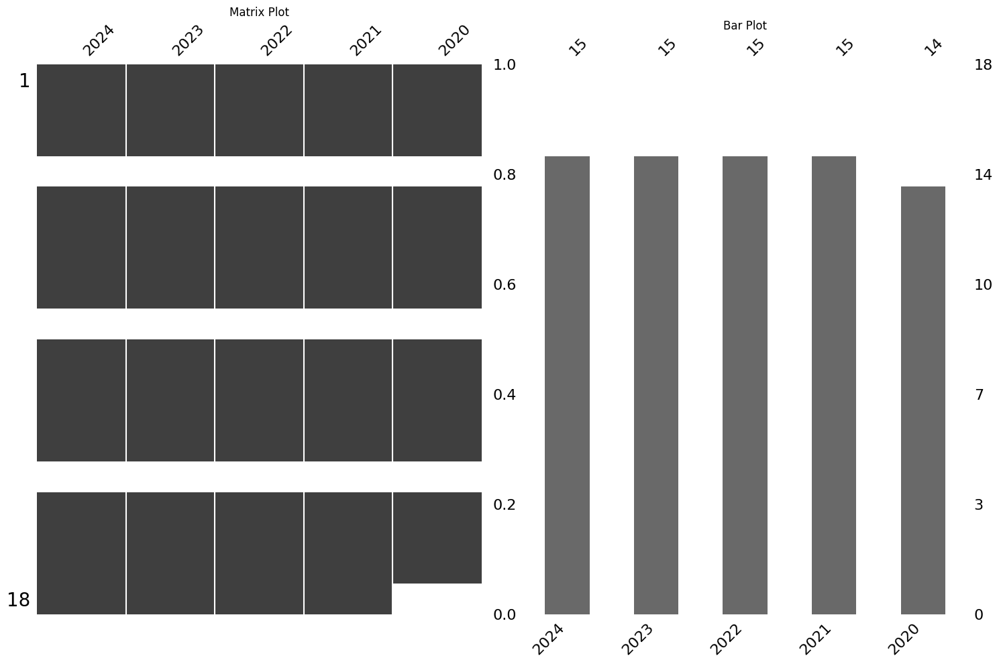

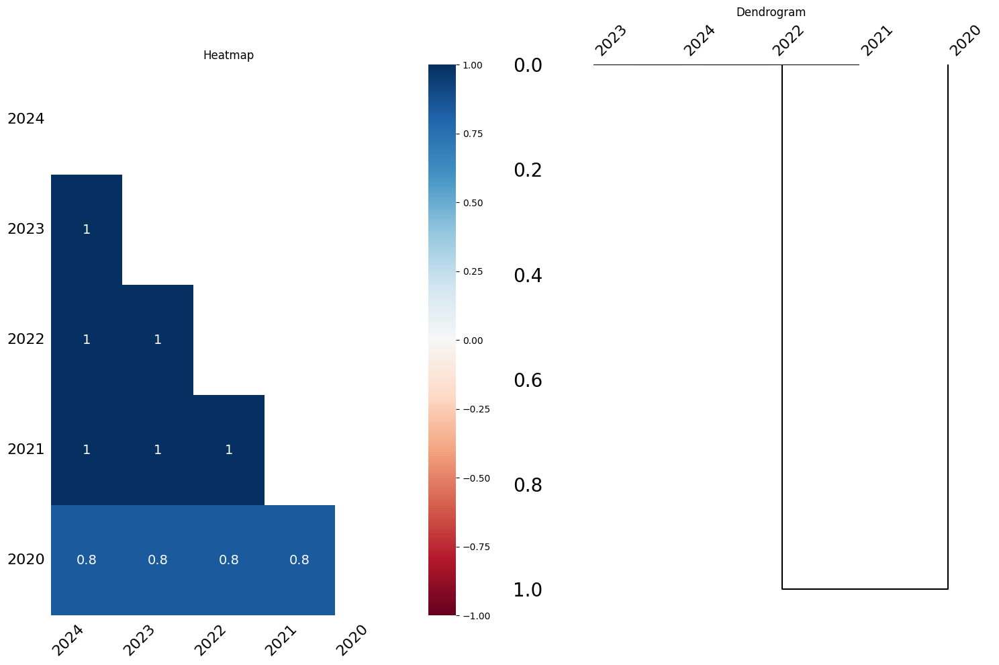

In [ ]:
r.visualizar_nulos(tecpetrol_ratios)

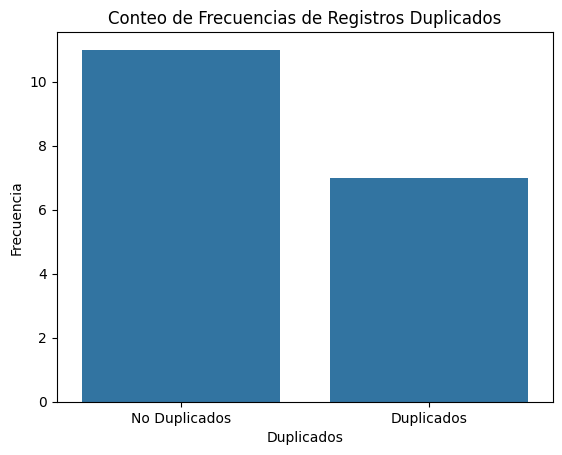

In [ ]:
r.hist_duplicados(tecpetrol_ratios)

### YPF

#### Informe general

In [5]:
r.informe_dataframe(ypf_ratios)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 18
Columnas: 4

--Numero de datos--
60

--Filas y Columnas--
Filas: muestra de indices-------> ['RDT', 'RDC', 'RDLP', None, 'Actividad']  -----> Desde RDT  Hasta Liquidez Inmediata
Columnas: [2024, 2023, 2022, 2021]

--Tipo de columnas--
2024    float64
2023    float64
2022    float64
2021    float64
dtype: object
--Cantidad de registros duplicados--
4



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [6]:
r.verificar_tipo_datos(ypf_ratios)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,2024,[<class 'float'>],83.33,16.67,3
1,2023,[<class 'float'>],83.33,16.67,3
2,2022,[<class 'float'>],83.33,16.67,3
3,2021,[<class 'float'>],83.33,16.67,3


#### Informe particular

In [7]:
for columna in ypf_ratios:
  r.informe_columna(ypf_ratios, columna)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE 2024:

--Numero de datos nulos--
3

--Valores unicos en la columna--
Ej: [5.40962652e-01 1.17847198e+00 1.31221719e-01            nan
 2.02400000e+03]  -----> Desde 0.5409626522867985  Hasta 0.1015003615328995

--Estadisticos Principales de la columna--
Media: 405.05
Desviacion Estandar: 837.89
Primer cuartil: 0.11636104049495655
Mediana: 0.2833117723156533
Tercer cuartil: 0.9727772855600909

--Valores extremos--
Valor maximo: 2024.0
Valor minimo: 0.0

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 2024
2024.000000    3
0.540963       1
1.178472       1
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 2024.0
Minimo: 0.0

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMN

#### Gráficos

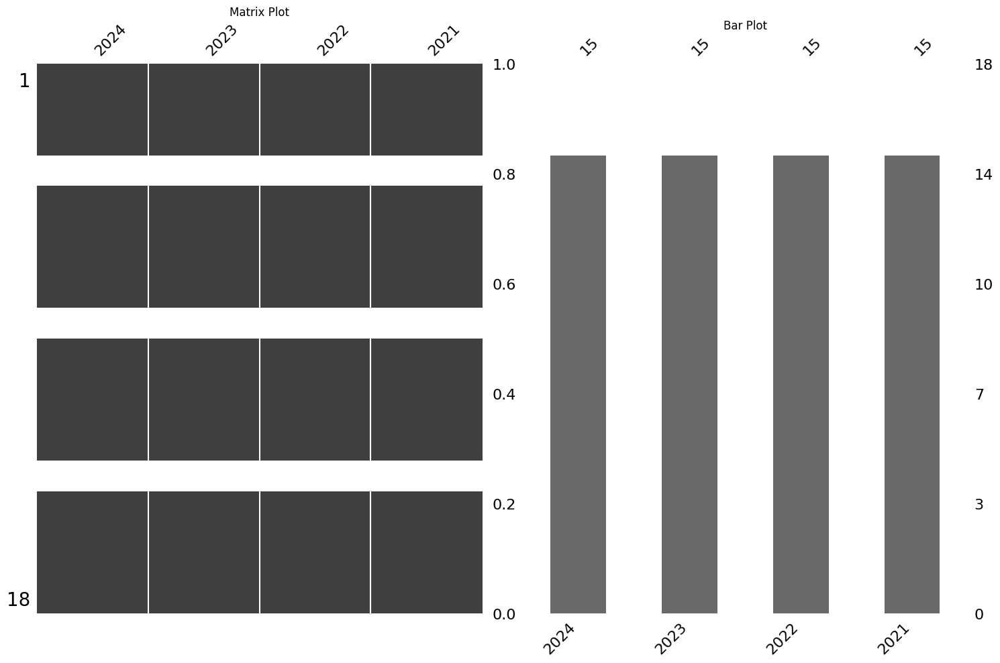

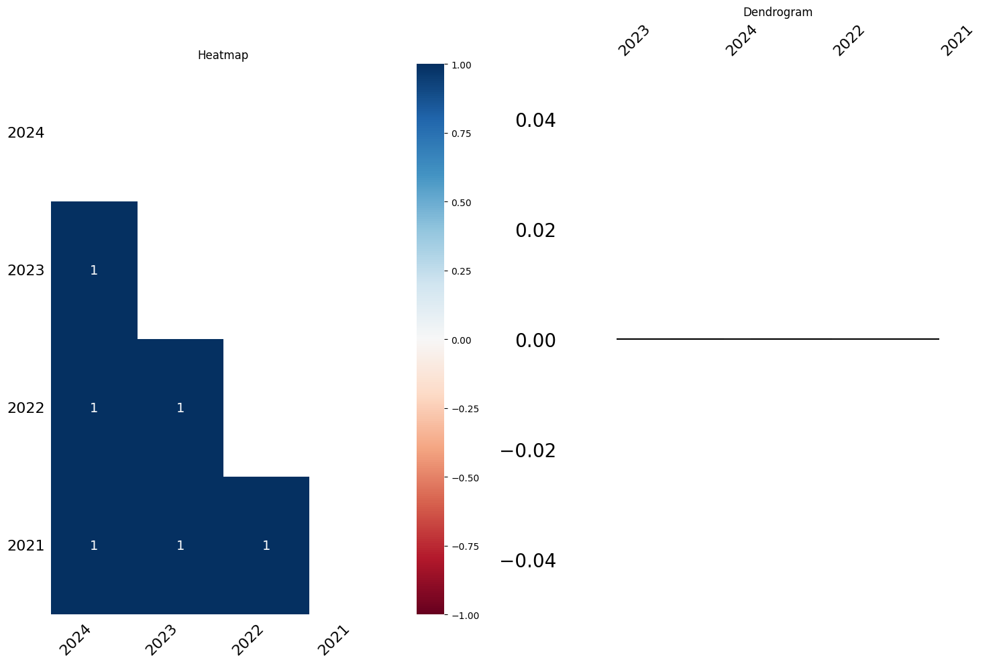

In [8]:
r.visualizar_nulos(ypf_ratios)

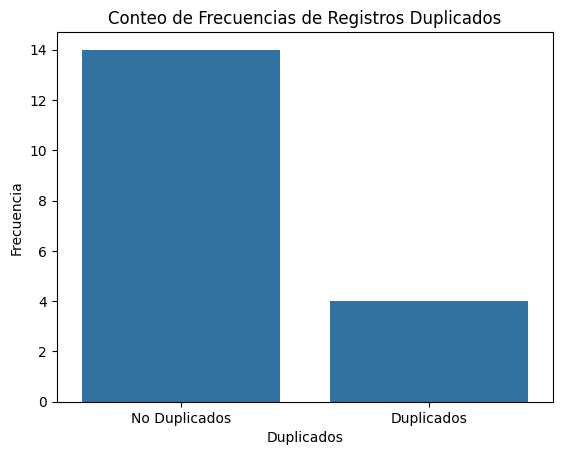

In [9]:
r.hist_duplicados(ypf_ratios)

# <h1 align= 'center'><u><strong></strong>Conclusiones</u></h1>

En principio, podemos decir que los datos de todos los ficheros en general se encuentran en condiciones, con formato y normalizados

Podemos mencionar que las columnas o campos referidos a fechas (y con sintaxis de fecha) estan como tipo de dato str por lo que es necesario realizar una conversion  de tipo de dato
Tambien señalamos que existen columnas con un muy alto porcentaje de datos nulos, lo que imposibilita su utilizacion o tratamiento, por lo que son plausibles de eliminacion. Siguiendo con la eliminacion de columnas, existen muchas en ciertos ficheros con perspectiva mas tecnica en los datos, donde no utilizaremos esa data ya que nuestro enfoque no es uno tecnico.

No se registran registros duplicados en principio, cuando se realice la eliminacion de ciertos campos, es muy probable que se presenten en consecuencia, pero no se eliminaran ya que originalmente esos registros se diferenciaban a causa de columnas preexistentes que nosotros por criterio propio eliminamos.

En cuento al tratamiento de nulos, en particular en columnas tipo object se utilizará una etiqueta generica SD (sin dato) para relleno a fines practicos, en cuanto al tratamiento de nulos en columnas numericas, se tratara cada caso especificamente

En relacion a la necesidad de cambiar un tipo de dato numerico por otro (para coherencia del dato) se tratara tambien cada caso en especifico.

Señalemos problemas menores como la normalizacion de etiquetas de campos en un idioma u otro, o en su formato

Cabe resaltar que muchos de estos ficheros eran originalmente de formato tabla dinamica (en archivos .xls o .xlsl), lo que requirio un tratamiento previo de extraccion desde ese formato a un formato estatico, para su posterior transformacion a dataframe, o tambien los datos y valores de interes se encontraban en una tabla que tenia muchas anotaciones y otros tipos de formato diferente a la tabla con los datos en si.
Este tratamiento se realizo previamente en un notebook llamado 'tratamiento_ficheros_tabdinamicas' que podemos encontrarlo [aquí](https://github.com/No-Country-simulation/c19-108-m-data-bi/blob/main/notebooks/tratamiento_ficheros_tabdinamicas.ipynb).

Por ultimo, existe un campo en especifico que se encuentra anidado en el fichero pozos. Es un campo que cuenta con la informacion de geolocalizacion de cada pozo (latitud y longitud) y que muy probablemente utilicemos por lo que debemos desanidar segmentar y formatear ese campo.

